In [1]:
import time
import numpy as np

# Audio utils

In [2]:
from abc import abstractmethod

In [3]:
class FeatureModule(object):
    
    def __init__(self, sample_rate, hop_length, num_channels=1, decibels=True):
        self.sample_rate = sample_rate
        self.hop_length = hop_length
        self.num_channels = num_channels
        self.decibels = decibels
        
    def get_expected_frames(self, audio):
         # Simply the number of hops plus one
        num_frames = 1 + len(audio) // self.hop_length
        return num_frames
    
    def get_sample_range(self, num_frames):
         # Calculate the boundaries
        max_samples = num_frames * self.hop_length - 1
        min_samples = max(1, max_samples - self.hop_length + 1)

        # Construct an array ranging between the minimum and maximum number of samples
        sample_range = np.arange(min_samples, max_samples + 1)
        return sample_range
    
    @abstractmethod
    def process_audio(self, audio):
        return NotImplementedError
    
    def to_decibels(self, feats):
        feats = librosa.core.amplitude_to_db(feats, ref=np.max)
        return feats

    def post_proc(self, feats):
        if self.decibels:
            # Convert to decibels (dB)
            feats = self.to_decibels(feats)

            # TODO - make additional variable for 0/1 scaling
            # Assuming range of -80 to 0 dB, scale between 0 and 1
            feats = feats / 80
            feats = feats + 1
        else:
            # TODO - should anything be done here? - would I ever not want decibels?
            pass

        # Add a channel dimension
        feats = np.expand_dims(feats, axis=0)
        return feats
    
    def get_times(self, audio):
        num_frames = self.get_expected_frames(audio)

        frame_idcs = np.arange(num_frames + 1)
        # Obtain the time of the first sample of each frame
        times = librosa.frames_to_time(frames=frame_idcs,
                                       sr=self.sample_rate,
                                       hop_length=self.hop_length)
        return times
    
    def get_sample_rate(self):
        sample_rate = self.sample_rate
        return sample_rate

    def get_hop_length(self):
        hop_length = self.hop_length
        return hop_length

    def get_num_channels(self):
        num_channels = self.num_channels
        return num_channels

    @classmethod
    def features_name(cls):
         return cls.__name__

## patch madmom import error with sed

In [4]:
from madmom.audio.signal import SignalProcessor, FramedSignalProcessor
from madmom.audio.stft import ShortTimeFourierTransformProcessor
from madmom.audio.spectrogram import (
    FilteredSpectrogramProcessor, LogarithmicSpectrogramProcessor,
    SpectrogramDifferenceProcessor)
from madmom.processors import ParallelProcessor, SequentialProcessor

In [5]:
class LOG_SPECT(FeatureModule):
    def __init__(self, num_channels=1, sample_rate=22050, win_length=2048, hop_size=512, n_bands=[12], mode='online'):
        sig = SignalProcessor(num_channels=num_channels, win_length=win_length, sample_rate=sample_rate)
        self.sample_rate = sample_rate
        self.hop_length = hop_size
        self.num_channels = num_channels
        multi = ParallelProcessor([])
        frame_sizes = [win_length]  
        num_bands = n_bands  
        for frame_size, num_bands in zip(frame_sizes, num_bands):
            if mode == 'online' or mode == 'offline':
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size) 
            else:   # for real-time and streaming modes 
                frames = FramedSignalProcessor(frame_size=frame_size, hop_size=hop_size, num_frames=4) 
            stft = ShortTimeFourierTransformProcessor()  # caching FFT window
            filt = FilteredSpectrogramProcessor(
                num_bands=num_bands, fmin=30, fmax=17000, norm_filters=True)
            spec = LogarithmicSpectrogramProcessor(mul=1, add=1)
            diff = SpectrogramDifferenceProcessor(
                diff_ratio=0.5, positive_diffs=True, stack_diffs=np.hstack)
            # process each frame size with spec and diff sequentially
            multi.append(SequentialProcessor((frames, stft, filt, spec, diff)))
        # stack the features and processes everything sequentially
        self.pipe = SequentialProcessor((sig, multi, np.hstack))

    def process_audio(self, audio):
        feats = self.pipe(audio)
        return feats.T

# Beatmap utils

In [6]:
import re
import os
import torch
import math
import scipy.io.wavfile as wav
import subprocess

In [7]:
class Beatmap():    
    
    def __init__(self, beatmap_dir, beatmap, proc, sample_rate=22050, tmp='./wav/', 
                 peak_type='gaussian', hop_size=512, width=4):
        self.beatmap = beatmap
        self.beatmap_dir = beatmap_dir
        self.sample_rate = sample_rate
        self.proc = proc
        self.tmp = tmp
        self.wavf = None
        self.audiof = None
        self.rate = int(sample_rate / hop_size)
        self.w = width
    
        self.timestamp = []
        self.beat_len = []
        self.hitobjects = []
        self.frames = None
        self.beats = None
        self.m = None
        self.hitstream = None
        self.hits = None
        
        peaks = {
            'gaussian': self.create_gaussian_peak, 
            'linear': self.create_linear_peak, 
            'parabolic': self.create_parabolic_peak
        }
        self.create_peak = peaks[peak_type]
        
    def parse_audiof(self):
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'AudioFilename.*', l):
                    self.audiof = re.search('AudioFilename:\s*(.*)', l).group(1)
        
        if not os.path.exists(self.audiof):
            for f in os.listdir(self.beatmap_dir):
                if re.match(self.audiof, f, flags=re.IGNORECASE):
                    self.audiof = f
        
    def get_audiof(self):
        if self.audiof is None:
            self.parse_audiof()
        return self.audiof
        
    def parse_ids(self):
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'BeatmapID.*',  l):
                self.BeatmapID = re.search('BeatmapID:\s*(\d+).*', l).group(1)
            if re.match(r'BeatmapSetID.*', l):
                self.BeatmapSetID = re.search('BeatmapSetID:\s*(\d+).*', l).group(1)
        if 'BeatmapSetID' not in locals():
            self.BeatmapSetID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        if 'BeatmapID' not in locals():
            self.BeatmapID = self.beatmap_dir.split('/')[-1].split(' ')[0]
        f.close()
            
    def parse_wav(self):
        self.parse_ids();
        self.wavf = str(self.BeatmapSetID) + '-' + str(self.BeatmapID) + '.wav'
        
    def create_wav(self):
        self.parse_wav()
        mp3 = os.path.join(self.beatmap_dir, self.get_audiof())
        wav = os.path.join(self.tmp, self.wavf)
        subprocess.call(['ffmpeg', '-hide_banner', '-loglevel', 'error', '-y', 
                         '-i', mp3, '-ar', str(self.sample_rate), wav])
        
    def get_wav(self):
        if self.wavf is None:
            self.parse_wav()
            if not os.path.exists(os.path.join(self.tmp, self.wavf)):
                self.create_wav()
        return self.wavf

    def parse_timings(self):
        rate, audio_data = wav.read(os.path.join(self.tmp, self.get_wav()))
        audio_len = np.shape(audio_data)[0]
        self.beat_len = []
        self.timestamp = []
        
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'BeatDivisor.*', l):
                    self.BeatDivisor = re.search('BeatDivisor:\s*(\d+).*', l).group(1)
                    self.BeatDivisor = int(self.BeatDivisor)
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[TimingPoints\]', l):
                break
        for l in f:
            if l == "\n":
                break
            a = l.split(',')
            if float(a[1]) < 0:
                continue
            self.beat_len.append(float(a[1]))
            self.timestamp.append(float(a[0])) 
        self.timestamp.append(int(audio_len / rate * 1000))
        f.close()
        
    def parse_hitobjects(self):
        self.hitobjects = []
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'ApproachRate.*', l):
                    AR = float(l.split(':')[1])
                    if AR < 5.0:
                        preempt = 1200 + 600 * (5 - AR) / 5
                        fadein = 800 + 400 * (5 - AR) / 5
                    else:
                        preempt = 1200 - 750 * (AR - 5) / 5
                        fadein = 800 - 500 * (AR - 5) / 5
                    self.preempt = preempt - fadein*0.1
                    break
        with open(os.path.join(self.beatmap_dir, self.beatmap)) as f:
            for l in f:
                if re.match(r'SliderMultiplier.*', l):
                    self.sliderMultiplier = float(l.split(':')[1])
                    break
        f = open(os.path.join(self.beatmap_dir, self.beatmap))
        for l in f:
            if re.match(r'\[HitObjects\]', l):
                break
        for l in f:
            self.hitobjects.append(l.split(','))
        f.close()
        
    def parse_beatmap(self):
        self.parse_timings()
        self.parse_hitobjects()
    
    def process_audio(self):
        feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
        feats = torch.tensor(feats)
        self.frames = torch.transpose(feats, 0, 1)
        
    def create_gaussian_peak(self, y, i):
        alen = len(y)
        w = self.w/2/2
        
        def func(x):
            return math.exp(-j**2/w**2)
        
        j = 0 
        while i+j > 0 and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= w*2:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_parabolic_peak(self, y, i):
        alen = len(y)
        limit = self.w*2
        w = self.w

        def func(x):
            return -(1/w**2 * x**2) + 1

        j = 0        
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1
            
    def create_linear_peak(self, y, i):
        alen = len(y)
        w = self.w/2
        m = 1/w
        limit = w
        
        def func(x):
            return m*x + 1
        
        j=0
        while i+j > 0 and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j -= 1
        m = -m
        j = 0
        while i+j < alen and abs(j) <= limit:
            f = func(j)
            y[i+j] = max(y[i+j], f, 0)
            j += 1  
    
    def process_beats(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        self.beats = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        i = self.timestamp[0] * 0.001 * self.rate
        while i > 0:
            x = round(i)
            self.create_peak(self.beats, x)
            i -= self.beat_len[0] * 0.001 * self.rate
        for j in range(len(self.timestamp) - 1):
            i = self.timestamp[j] * 0.001 * self.rate
            while i < (self.timestamp[j+1] * 0.001 * self.rate):
                x = round(i)
                self.create_peak(self.beats, x)
                i += self.beat_len[j] * 0.001 * self.rate
            if i >= self.timestamp[-1] * 0.001 * self.rate:
                break
                
    def process_hitobjects(self):
        global debug
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hitstream = [None] * math.ceil(self.timestamp[-1] * 0.001 * self.rate)
        
        sr = 1.0/self.rate * 1000
        time = 0.0
        i = 0
        k = 0
        self.hitstream[k] = []
        while i != len(self.hitobjects):
            if float(self.hitobjects[i][2]) < time:
                i += 1
                continue
            j = i
            while j < len(self.hitobjects):
                if float(self.hitobjects[j][2]) > time + self.preempt or float(self.hitobjects[j][2]) < time:
                    break
                hit_type = int(self.hitobjects[j][3]) & 0b0011
                self.hitstream[k].append(hit_type)
                
                if int(hit_type) & 0b0010 != 0:
                    slider_rate = None
                    length = None
                    for i in range(len(self.timestamp)-1, 0-1, -1):
                        if slider_rate != None:
                            if self.beat_len[i] < 0.0:
                                continue
                            length = self.beat_len[i]
                            break
                        if self.timestamp[i] < float(self.hitobjects[j][2]):
                            if self.beat_len[i] > 0.0:
                                slides = 100
                                slider_rate = self.beat_len[i]
                                break
                            else:
                                slides = self.beat_len[i] * -1
                    if length == None:
                        length = self.beat_len[0]
                        slider_rate = 100
                    length = float(length)
                    y = round(float(self.hitobjects[j][7]) * length / (100/slider_rate * self.sliderMultiplier * 100.0) * 0.001 * self.rate)
                    for i in range(int(self.hitobjects[j][6])):
                        self.hitstream[k].append(-1)
                    
                j += 1
            
            time += sr
            debug = self.hitstream
            k += 1
            self.hitstream[k] = []
    
    def process_hits(self):
        if len(self.hitobjects) == 0:
            self.parse_beatmap()
        self.hits = np.zeros(math.ceil(self.timestamp[-1] * 0.001 * self.rate), dtype=np.float32)
        
        for h in self.hitobjects:
            x = round(float(h[2]) * 0.001 * self.rate)
            self.create_peak(self.hits, x)
            
            if int(h[3]) & 2 == 2:
                slider_rate = None
                length = None
                for i in range(len(self.timestamp)-1, 0-1, -1):
                    if slider_rate != None:
                        if self.beat_len[i] < 0.0:
                            continue
                        length = self.beat_len[i]
                        break
                    if self.timestamp[i] < float(h[2]):
                        if self.beat_len[i] > 0.0:
                            slides = 100
                            slider_rate = self.beat_len[i]
                            break
                        else:
                            slides = self.beat_len[i] * -1
                if length == None:
                    length = self.beat_len[0]
                    slider_rate = 100
                length = float(length)
                y = round(float(h[7]) * length / (100/slider_rate * self.sliderMultiplier * 100.0) * 0.001 * self.rate)
                for i in range(0, int(h[6])*y):
                    if x + i > self.hits.shape[0]:
                        break
                    self.create_peak(self.hits, x+i)
                    
    def get_audio(self):
        if self.frames is None:
            self.process_audio()
        return self.frames
    
    def get_hitobjects(self):
        if self.hitstream is None:
            self.process_hitobjects()
        stream = [None] * len(self.hitstream)
        for i in range(len(self.hitstream)):
            if self.hitstream[i] == [] or self.hitstream[i] == None:
                h = np.array([0])
            else:
                h = np.array(self.hitstream[i], dtype=np.float32)
            stream[i] = torch.tensor(np.pad(h, (0, 64 - h.shape[0])))
        return torch.stack(stream)
    
    def get_hits(self):
        if self.hits is None:
            self.process_hits()
        return torch.tensor(self.hits)
    
    def get_beats(self):
        if self.beats is None:
            self.process_beats()
        return torch.tensor(self.beats)
    
    def get_metadata(self):
        if self.BeatDivisor is None:
            self.parse_beatmap()
        return (self.beatmap, self.rate, self.BeatDivisor)
    
    def get_timings(self):
        if len(self.timestamp) == 0:
            self.parse_beatmap()
        return list(zip(self.timestamp, self.beat_len))

# Dataset

In [8]:
import glob
import copy
import gc
import concurrent.futures
import traceback
import torch
from torch.utils.data import Dataset

In [9]:
class Beatmap_Dataset(Dataset):  
    
    def __init__(self, beatmap_dir, proc, seq_dur=10, sample_rate=22050, hop_size=512, width=4, 
                 peak_type='gaussian', threads=4, threading=True):
        self.beatmap_dir = beatmap_dir
        self.proc = proc
        self.sample_rate = sample_rate
        self.hop_size = hop_size
        self.beatmaps = []
        self.seq_len = int(seq_dur * sample_rate / hop_size)
        self.width = width
        
        if beatmap_dir == None:
            self.a = []
            self.o = []
            self.b = []
            self.h = []
            self.t = []
            self.m = []
            return
        
        j = 0
        for r, dirs, _ in os.walk(beatmap_dir):
            for dir in dirs:
                for root, _, files in os.walk(os.path.join(r, dir)):
                    for f in files:
                        if re.match('.*.osu$', f):
                            self.beatmaps.append(Beatmap(root, f, proc, sample_rate=sample_rate, 
                                                         hop_size=hop_size, width=width, peak_type=peak_type))
                            j += 1
                                            
        self.a = [None] * j
        self.o = [None] * j
        self.b = [None] * j
        self.h = [None] * j
        self.t = [None] * j
        self.m = [None] * j 

        def process(i):
            m = self.beatmaps[i]
            self.beatmaps[i] = None
            try:
                print(str(i) + '/' + str(j-1), m.beatmap)            
                self.a[i] = copy.deepcopy(m.get_audio())
                self.o[i] = copy.deepcopy(m.get_hitobjects())
                self.b[i] = copy.deepcopy(m.get_beats())
                self.h[i] = copy.deepcopy(m.get_hits())
                self.t[i] = copy.deepcopy(m.get_timings())
                self.m[i] = copy.deepcopy(m.get_metadata())
            except Exception as e:
                traceback.print_exc()
                print("pruning:", m.beatmap)     
                self.a[i] = None
                self.o[i] = None
                self.b[i] = None
                self.h[i] = None
                self.t[i] = None
                self.m[i] = None
            del m
            #gc.collect()

        if threading:
            executor = concurrent.futures.ThreadPoolExecutor(threads)
            list(executor.map(process, range(j)))
        else:
            list(map(process, range(j)))
                        
        self.beatmaps = list(filter(None, self.beatmaps))
        self.a = list(filter(lambda x: x != None, self.a))
        self.o = list(filter(lambda x: x != None, self.o))
        self.b = list(filter(lambda x: x != None, self.b))
        self.h = list(filter(lambda x: x != None, self.h))
        self.t = list(filter(None, self.t))
        self.m = list(filter(None, self.m))
        
    def take(self, ds, i, j):
        self.a = ds.a[i:j]
        self.o = ds.o[i:j]
        self.b = ds.b[i:j]
        self.h = ds.h[i:j]
        self.m = ds.m[i:j]
        self.t = ds.t[i:j]
        
    def __len__(self):
        return len(self.a)
    
    def __getitem__(self, i):
        if self.seq_len == 0:
            return None
        j = np.random.randint(0, self.a[i].shape[0] - self.seq_len)
        return self.a[i][j: j+self.seq_len], self.o[i][j: j+self.seq_len], self.b[i][j: j+self.seq_len], self.h[i][j: j+self.seq_len], self.t[i][0], (self.m[i], i, j)
    

# Testing

In [ ]:
# debug
log_spect = LOG_SPECT(sample_rate=44100, hop_size=441*2, n_bands=[24], mode='offline')
s = Beatmap_Dataset('../ex/beatmaps', log_spect, sample_rate=44100, hop_size=441*2, width=2, peak_type='linear', threading=True)

0/241/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [HOS' Normal].osu
 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu
2/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [RLC's Insane].osu
3/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [deetz' Deception].osu
4/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Easy].osu
5/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [toybot's Insane].osu
6/24 sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Collab Advanced].osu
7/24 TMABird - Everybody's Circulation (Vncegd) [Very Easy].osu
8/24 TMABird - Everybody's Circulation (Vncegd) [Normal].osu
9/24 TMABird - Everybody's Circulation (Vncegd) [Hard (new)].osu
10/24 TMABird - Everybody's Circulation (Vncegd) [Easy (new)].osu
11/24 TMABird - Everybody's Circulation (Vncegd) [Insane].osu


# Constants

In [10]:
sample_rate = 44100
hop_size = 441 * 2
seq_dur = 10
peak_type = 'gaussian'
width = 4

beatmap_dir = '../beatmaps'
ds_path = './datasets/HN/ds_' + peak_type + '.pkl'
bn_model_path = './models/ASU/dbn01_' + peak_type
hn_model_path = './models/ASU/hn01_' + peak_type

# Process Data

In [12]:
start = time.time()

log_spect = LOG_SPECT(sample_rate=sample_rate, hop_size=hop_size, n_bands=[24], mode='offline')
ds = Beatmap_Dataset(beatmap_dir, log_spect, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width, threads=16, threading=True)

end = time.time()
print(end - start, 'secs')

0/1511 Chata - Engage (Lasse) [Insane].osu
1/1511 Mimi - Surrealism (feat. ZAT) (-Tatsuo) [no mania].osu
2/1511 sana - kanojo wa tabi ni deru (Firika) [Insane].osu
3/1511 Ishida Youko - To the Promised Sky ~The place that I was~ (caren) [Collabo].osu
4/1511 5/1511StylipS - Prism Sympathy(Asterisk Remix) (iMage--) [Kaleid Liner].osu
 Cranky - Chandelier - King (Mao) [Gero's Insane].osu
6/1511 senya - Akatsuki no Suiheisen ni (Satellite) [Zweib's Insane].osu
7/1511 Tadokoro Azusa - 1HOPE SNIPER (Sotarks) [NiNo's Insane].osu
8/15119/1511 fripSide - future gazer (TV Size) (alacat) [Insane].osu
10/1511 Yazawa Nico (CV.Tokui Sora) - Nicopuri Joshidou (yf_bmp) [z1085684963's Insane].osu
 cYsmix - bells! (Gero) [normal!].osu
11/1511 Hamburgaga - Watame Internet Connection Race (CE6A) [Insane].osu
12/1511 xi - Parousia -LAST JUDGMENT- (Zapy) [Retribution].osu
13/1511 Shiena Nishizawa - Meaning (Taeyang) [xChippy's Insane].osu
14/1511 namirin - Hitokoto no Kyori (sahuang) [Linadeft's Insane].osu

Traceback (most recent call last):
  File "/tmp/ipykernel_31940/2904171237.py", line 44, in process
    self.a[i] = copy.deepcopy(m.get_audio())
  File "/tmp/ipykernel_31940/554882180.py", line 308, in get_audio
    self.process_audio()
  File "/tmp/ipykernel_31940/554882180.py", line 137, in process_audio
    feats = self.proc.process_audio(os.path.join(self.beatmap_dir, self.get_audiof()))
  File "/tmp/ipykernel_31940/680612967.py", line 27, in process_audio
    feats = self.pipe(audio)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 120, in __call__
    return self.process(*args, **kwargs)
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 424, in process
    data = _process((processor, data, kwargs))
  File "/home/poi/proj/osuAi/hitNet/.env/lib/python3.10/site-packages/madmom/processors.py", line 289, in _process
    return process_tuple[0](*process_tuple[1:-1], **process_tuple[-1])
  F

KeyboardInterrupt: 

In [ ]:
start = time.time()

torch.save(ds, ds_path)

end = time.time()
print(end - start, 'secs')

# Load Dataset

In [11]:
ds = torch.load(ds_path)

# Model

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as nnF

In [14]:
class BN(nn.Module):
    def __init__(self, dim_in, device):
        super(BN, self).__init__()
        
        self.dim_in = dim_in
        self.dim_out = 1
        self.dim_hd = 64
        self.num_layers = 2
        self.kernel_size = 5
        self.padding = 2
        self.device = device
        
        # convolution
        K = self.kernel_size
        P = 1
        S = 1
        # pooling
        p = 0
        k = 2
        s = 2
        
        # temporal
        W = dim_in[1]
        W = int(((W - K + 2*P)/S) + 1)
        K = 3
        temporal_dim = int(((W - K + 2*P)/S) + 1)
        self.temporal_dim = temporal_dim
        
        self.conv_out = self.temporal_dim
        
        self.convA1 = nn.Conv2d(1, 1, (3, 5), padding=1)
        self.convA2 = nn.Conv2d(1, 1, (3, 3), padding=1)
        
        self.lstm1 = nn.LSTM(input_size=self.conv_out,
                           hidden_size=self.dim_hd,
                           num_layers=self.num_layers,
                           batch_first=True,
                           bidirectional=True)
        self.linear2 = nn.Linear(self.dim_hd * 2, self.dim_hd)
        self.linear1 = nn.Linear(self.dim_hd, self.dim_out)
        self.softmax = nn.Softmax(dim=0)
        self.hidden = None
        
    def init_hidden(self, batch_size):
        hidden_state = torch.zeros(self.num_layers * 2, batch_size, self.dim_hd).to(self.device)
        cell_state = torch.zeros(self.num_layers * 2, batch_size, self.dim_hd).to(self.device)
        self.hidden = (hidden_state, cell_state)

    def forward(self, x):
        x = x.unsqueeze(1)
        x = self.convA1(x)
        x = nnF.relu(x)
        x = self.convA2(x)
        x = nnF.relu(x)
        x = x.squeeze(1)
        
        #x = nnF.max_pool2d(x, (1,2))
        x, self.hidden = self.lstm1(x, self.hidden)
        x = self.linear2(x)
        x = nnF.relu(x)
        
        x = self.linear1(x)
        #x = self.softmax(x)
        
        return x

In [15]:
class HN(nn.Module):
    def __init__(self, dim_in, device):
        super(HN, self).__init__()
        
        self.dim_in = dim_in
        self.dim_out = 1
        self.device = device
        self.num_layers = 2
        
        # convolution
        K = 5
        P = 1
        S = 1
        # pooling
        p = 0
        k = 2
        s = 2
        
        # temporal
        W = dim_in[1]
        W = int(((W - K + 2*P)/S) + 1)
        K = 3
        temporal_dim = int(((W - K + 2*P)/S) + 1)
        self.temporal_dim = temporal_dim
        
        self.conv_out = self.temporal_dim
        self.lstmX_size = self.conv_out + 64 + 1
        print(self.lstmX_size)
        
        self.convA1 = nn.Conv2d(1, 1, (3, 5), padding=1)
        self.convA2 = nn.Conv2d(1, 1, (3, 3), padding=1)

        self.lstmX1 = nn.LSTM(input_size=self.lstmX_size,
                   hidden_size=self.lstmX_size,
                   num_layers=self.num_layers,
                   batch_first=True,
                   bidirectional=False) 
        self.linearX1 = nn.Linear(self.lstmX_size, 64)
                                  
        #self.linear2 = nn.Linear(int(self.lstmX_size/self.lstm_layers), int(self.lstmX_size/self.lstm_layers/2))
        self.linear1 = nn.Linear(64, self.dim_out)

        
    def init_hidden(self, batch_size):
        h = torch.zeros(self.num_layers, batch_size, self.lstmX_size).to(self.device)
        c = torch.zeros(self.num_layers, batch_size, self.lstmX_size).to(self.device)
        self.hiddenX1 = (h, c)

    def forward(self, a, b, o):
        a = a.unsqueeze(1)
        a = self.convA1(a)
        a = nnF.relu(a)
        a = self.convA2(a)
        a = nnF.relu(a)
        a = a.squeeze(1)
        
        b = b.unsqueeze(2)
        
        x = torch.cat([a, b, o], dim=2)
        
        x, self.hiddenX1 = self.lstmX1(x, self.hiddenX1)
        x = self.linearX1(x)
        x = nnF.relu(x)
        
        #x = self.linear2(x)
        #x = nnF.relu(x)
        x = self.linear1(x)
        
        return x

# Training DBN

In [23]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt

In [24]:
batch_size = 32
init_trunc = 1

In [25]:
dim_in = (ds.seq_len, ds.a[0].shape[1])
dim_out = 1

In [26]:
device = torch.device('cuda')

In [27]:
epoch_cum = 0
val_hist = []
train_hist = []
bn = BN(dim_in=dim_in, device=device)
bn.to(device)

BN(
  (convA1): Conv2d(1, 1, kernel_size=(3, 5), stride=(1, 1), padding=(1, 1))
  (convA2): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lstm1): LSTM(278, 64, num_layers=2, batch_first=True, bidirectional=True)
  (linear2): Linear(in_features=128, out_features=64, bias=True)
  (linear1): Linear(in_features=64, out_features=1, bias=True)
  (softmax): Softmax(dim=0)
)

In [90]:
bn.init_hidden(1)
summary(bn, input_data=[ds.a[0].unsqueeze(0).to(device)], col_width=16,
        col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
DBN                                      --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 14206, 280] [1, 1, 14206, 278] 16               [1, 1, 3, 5]     63,188,288
├─Conv2d: 1-2                            [1, 1, 14206, 278] [1, 1, 14206, 278] 10               [1, 1, 3, 3]     39,492,680
├─LSTM: 1-3                              [1, 14206, 278]  [1, 14206, 128]  275,456          --               3,913,127,936
├─Linear: 1-4                            [1, 14206, 128]  [1, 14206, 64]   8,256            [128, 64]        8,256
├─Linear: 1-5                            [1, 14206, 64]   [1, 14206, 1]    65               [64, 1]          65
├─Softmax: 1-6                           --               --               --               --               --
Total params: 283,803
Trainable params: 283,803
Non-trainab

In [91]:
train_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)
val_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

In [92]:
criterion = nn.MSELoss()
#criterion = nn.L1Loss()
optimizer = torch.optim.Adam(bn.parameters(), lr=0.001)

In [101]:
def beatAcc(pred, gt, thresh):
    c = 0
    n = 0
    for i in range(1, gt.shape[0]-2):
        n += 1 if gt[i] == 1.0 else 0
        if pred[i] > pred[i-1] and pred[i] > pred[i+1] and pred[i] >= thresh:
            c += 1 if gt[i] > 0.0 else 0
    if n == 0:
        return 1
    return c / n    

In [23]:
def trainBN():
    global epoch_cum
    global A, O, B, H, P
    global l
    
    for epoch in range(epochs):
        bn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for a, o, b, h, t, m, in info:
            bn.init_hidden(a.shape[0])
            A, B = a.to(device), b.to(device)

            optimizer.zero_grad()
            P = dbn(A)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                B[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)

            loss = criterion(P, B.unsqueeze(2))
            loss.backward()
            optimizer.step()
      
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        bn.eval()
        torch.no_grad()
        val_loss = 0
        val_acc50 = 0
        val_acc40 = 0
        for a, o, b, h, t, m, in val_ldr:
            bn.init_hidden(a.shape[0])
            A, B = a.to(device), b.to(device)

            P = dbn(A)

            for i in range(P.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                B[i][0:l] = torch.tensor([0] * l)
                P[i][0:l] = torch.tensor([0] * l).unsqueeze(1)

            loss = criterion(P, B.unsqueeze(2))

            acc = 0
            for i in range(P.shape[0]):
                acc += beatAcc(P[i].cpu().detach().numpy(), b[i], 0.5)
            val_acc50 += acc
            acc = 0
            for i in range(P.shape[0]):
                acc += beatAcc(P[i].cpu().detach().numpy(), b[i], 0.4)
                #print(acc)
            val_acc40 += acc

            
            val_loss += loss.item()

        train_loss = train_loss/len(train_ldr)    
        val_loss = val_loss/len(val_ldr)
        val_acc50 = val_acc50/len(val_ldr)/batch_size
        val_acc40 = val_acc40/len(val_ldr)/batch_size
        print(epoch+epoch_cum, 'of', epochs+epoch_cum)
        print("TRAIN LOSS:", train_loss)
        print("VAL LOSS:", val_loss)
        print("VAL_ACC50:", val_acc50)
        print("VAL_ACC40:", val_acc40)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        plt.rcParams["figure.figsize"] = (20,1)
        for i in range(dim_out):
            plt.plot(P[0,:,i].cpu().detach().numpy())
            plt.plot(b[i])
            plt.show()
        
        plt.rcParams["figure.figsize"] = (10, 5)
        plt.plot(train_hist)
        plt.plot(val_hist)
        plt.show()
            
    epoch_cum += epochs

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0575                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 64
TRAIN LOSS: 0.059587342457638845
VAL LOSS: 0.0597413070499897


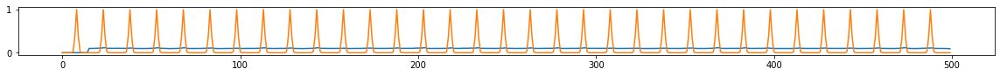

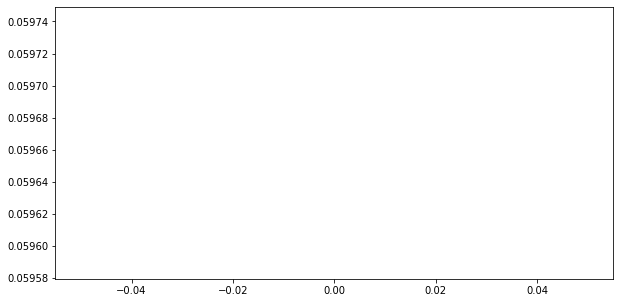

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.67it/s  0.0427                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 64
TRAIN LOSS: 0.05208738065428204
VAL LOSS: 0.046357010387712054


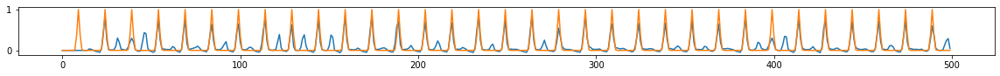

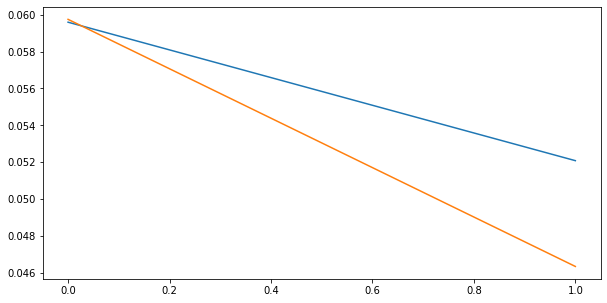

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.57it/s  0.0413                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 64
TRAIN LOSS: 0.042871497881909214
VAL LOSS: 0.03982798175679313


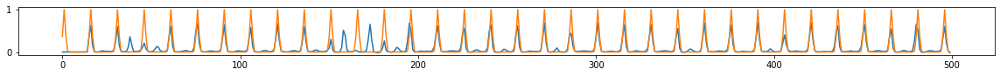

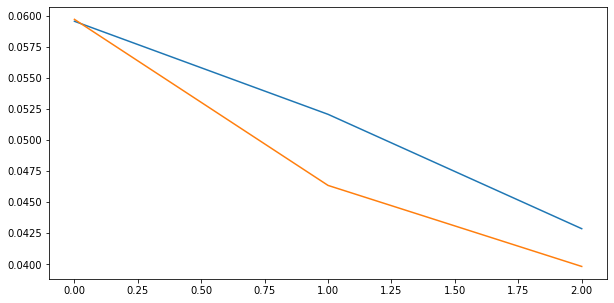

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.55it/s  0.0361                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 64
TRAIN LOSS: 0.03777186091368397
VAL LOSS: 0.037568399475680456


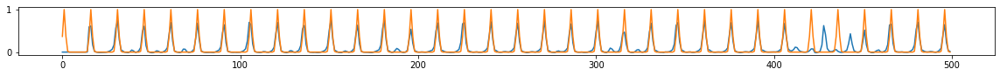

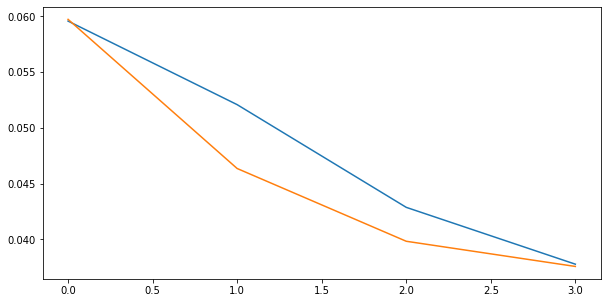

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.51it/s  0.0332                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 64
TRAIN LOSS: 0.03652588681628307
VAL LOSS: 0.03594251163303852


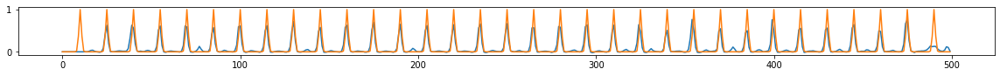

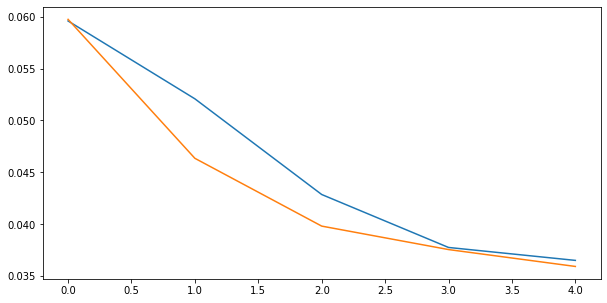

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.53it/s  0.0357                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 64
TRAIN LOSS: 0.03688158834767011
VAL LOSS: 0.03720114938914776


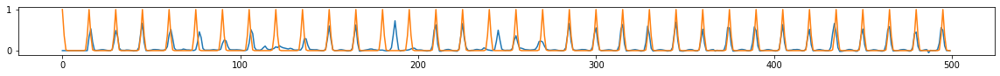

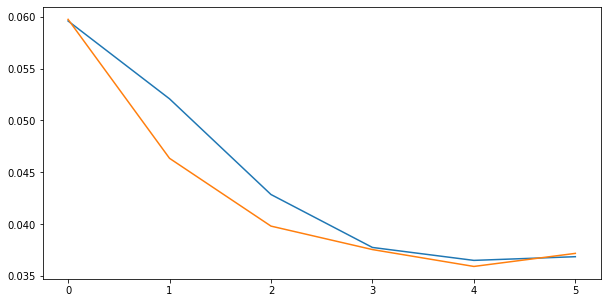

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.62it/s  0.0364                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 64
TRAIN LOSS: 0.03460540193029576
VAL LOSS: 0.034280427214172154


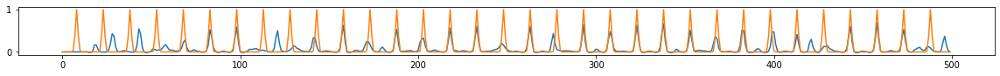

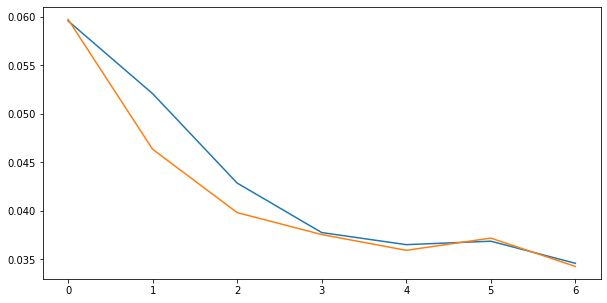

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.52it/s  0.0333                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 64
TRAIN LOSS: 0.034284117424653635
VAL LOSS: 0.03307048583196269


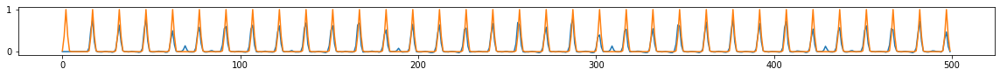

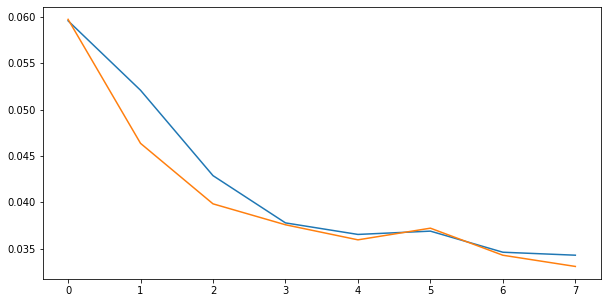

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0368                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 64
TRAIN LOSS: 0.0336124227485723
VAL LOSS: 0.033333523819843926


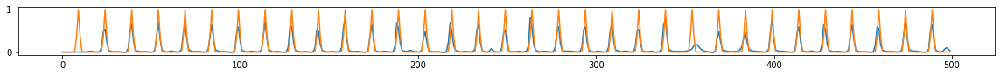

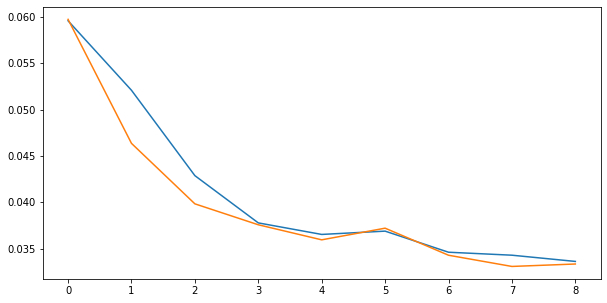

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.58it/s  0.0369                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 64
TRAIN LOSS: 0.03482860456117325
VAL LOSS: 0.037511742777294584


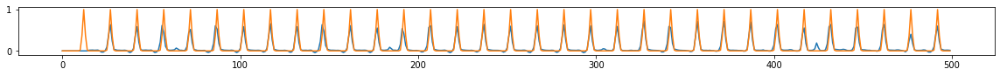

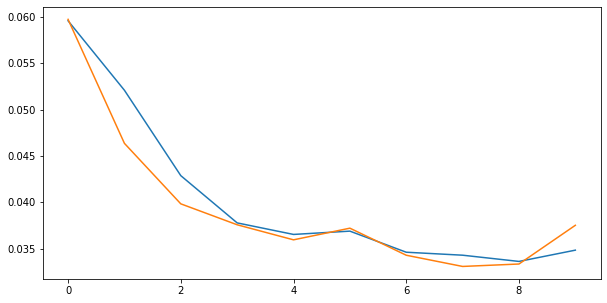

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.63it/s  0.0335                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 64
TRAIN LOSS: 0.034819571767002344
VAL LOSS: 0.035247850956188306


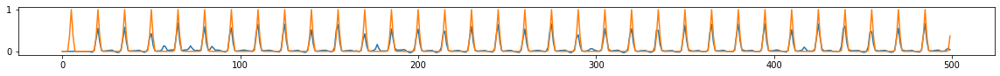

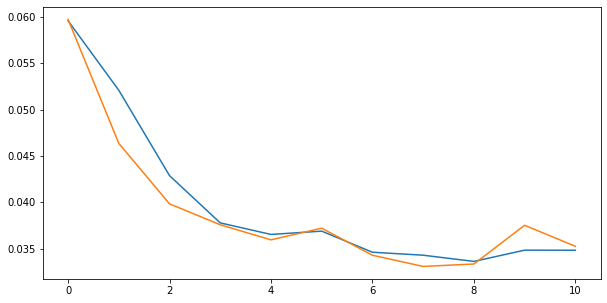

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.57it/s  0.0332                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 64
TRAIN LOSS: 0.03344518199769987
VAL LOSS: 0.035194459888670176


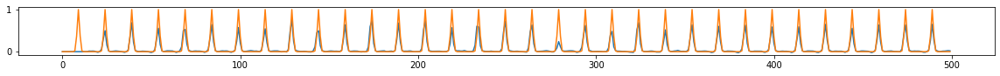

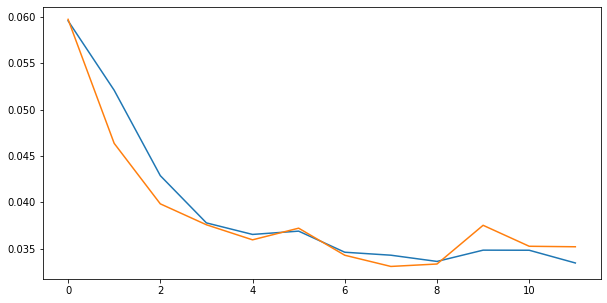

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.59it/s  0.0319                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 64
TRAIN LOSS: 0.032487155145241156
VAL LOSS: 0.03395666513178083


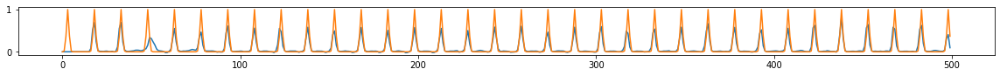

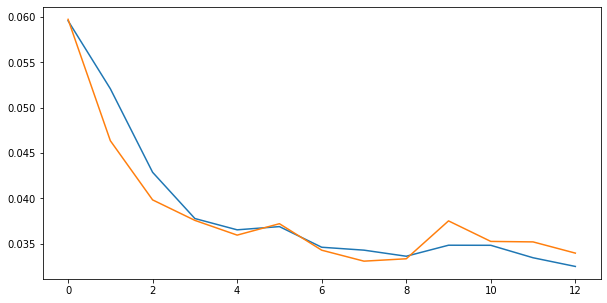

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.52it/s  0.0259                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 64
TRAIN LOSS: 0.031810193995220795
VAL LOSS: 0.030758393100566335


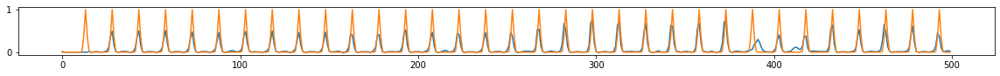

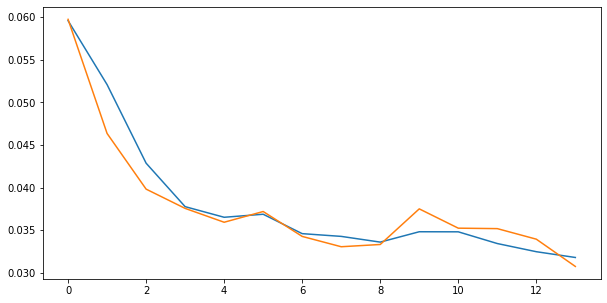

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.52it/s  0.0333                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 64
TRAIN LOSS: 0.031218768666601844
VAL LOSS: 0.030628946506314807


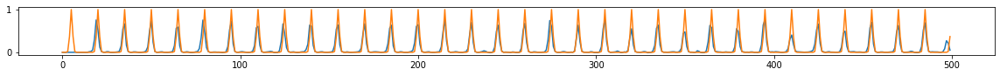

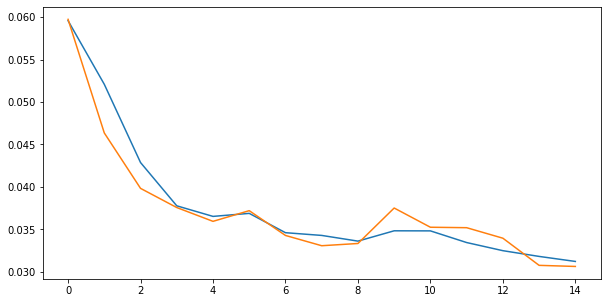

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.63it/s  0.0404                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 64
TRAIN LOSS: 0.03551790796013342
VAL LOSS: 0.03512328780359692


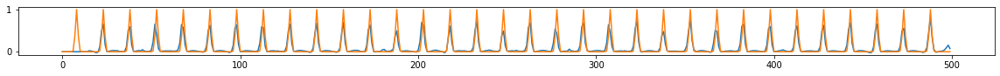

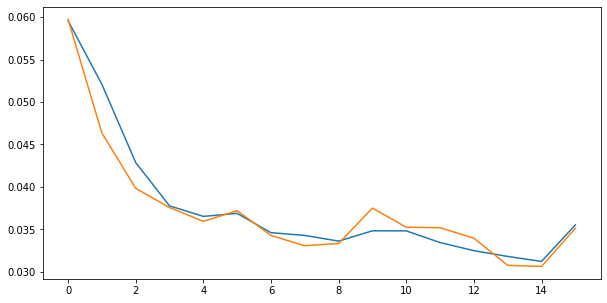

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0331                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 64
TRAIN LOSS: 0.03462513893221816
VAL LOSS: 0.03324984614219931


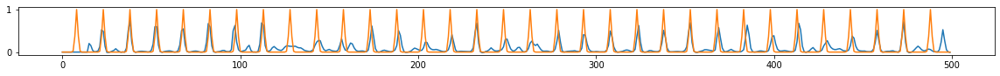

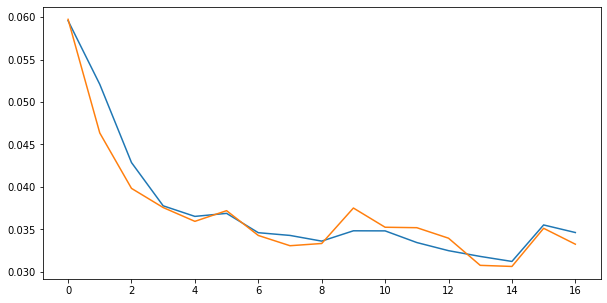

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.62it/s  0.0278                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 64
TRAIN LOSS: 0.03141181864258316
VAL LOSS: 0.03079071454703808


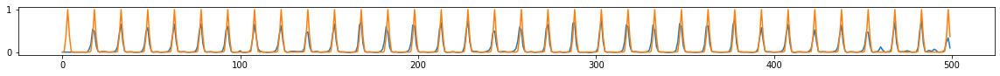

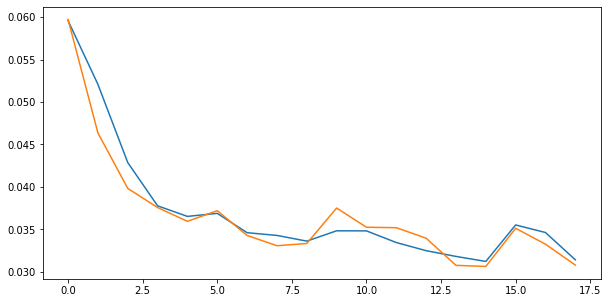

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0285                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 64
TRAIN LOSS: 0.03168708965596226
VAL LOSS: 0.03069476866059833


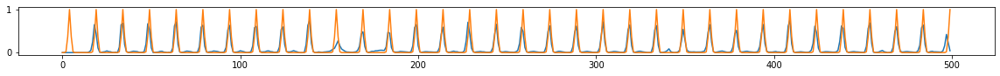

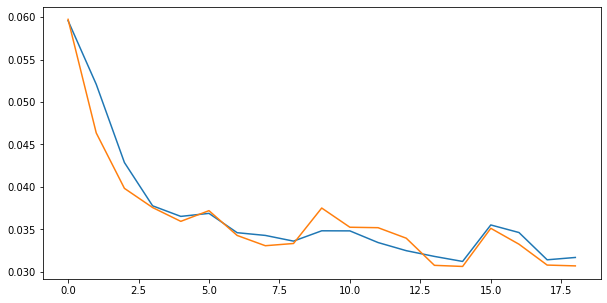

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.44it/s  0.0328                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 64
TRAIN LOSS: 0.031178652308881283
VAL LOSS: 0.0316753921409448


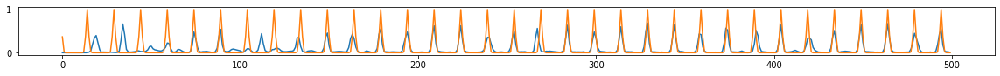

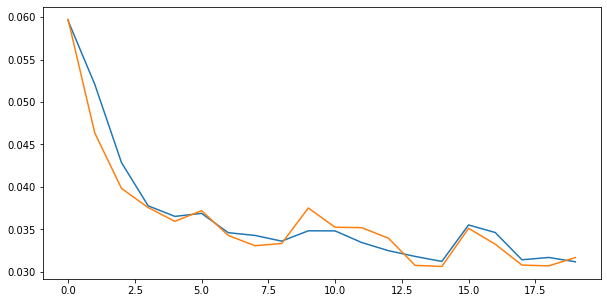

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0302                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 64
TRAIN LOSS: 0.03083830580322279
VAL LOSS: 0.030676649883389473


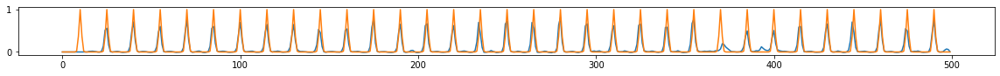

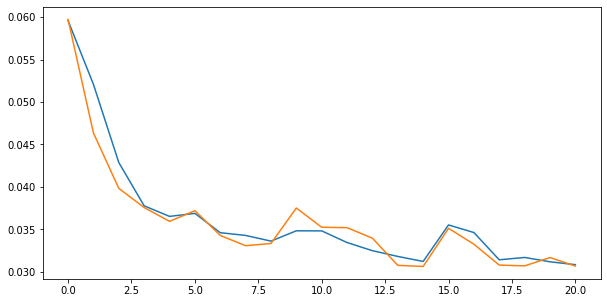

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.59it/s  0.0328                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 64
TRAIN LOSS: 0.02994950281249152
VAL LOSS: 0.03067594828704993


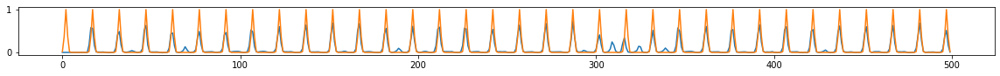

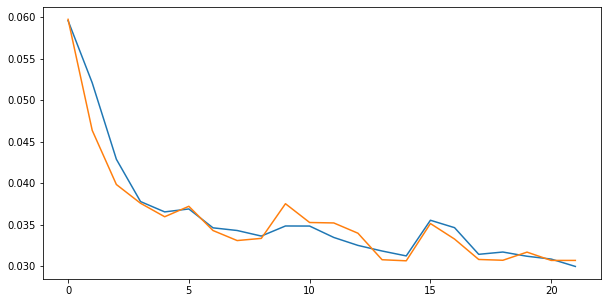

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0478                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 64
TRAIN LOSS: 0.030926731311612658
VAL LOSS: 0.0360128130349848


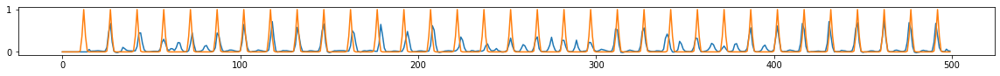

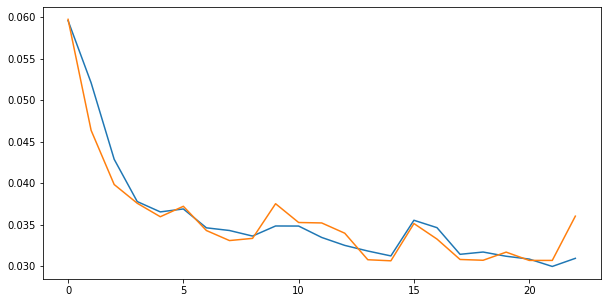

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0343                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 64
TRAIN LOSS: 0.034663704172190696
VAL LOSS: 0.0364994787507587


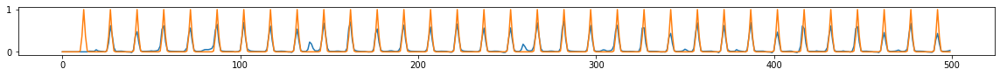

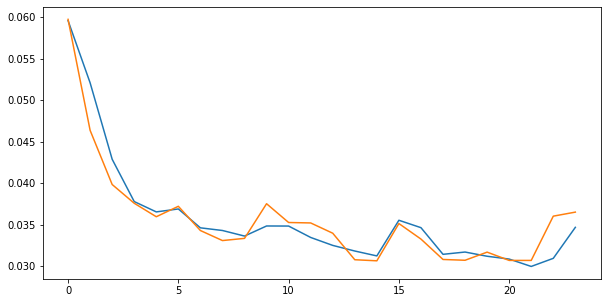

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.48it/s  0.0380                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 64
TRAIN LOSS: 0.037460992164495915
VAL LOSS: 0.041717365798023015


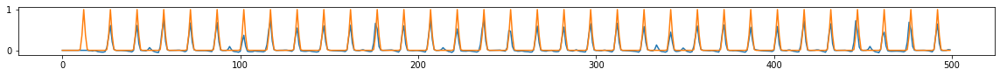

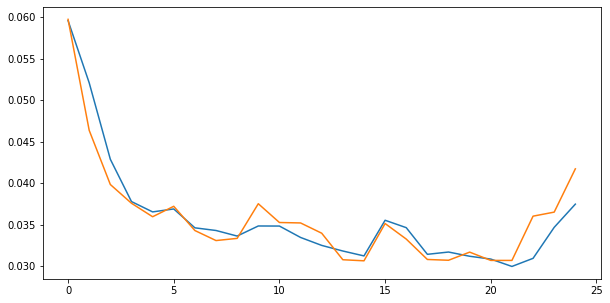

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0305                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 64
TRAIN LOSS: 0.035907540936023
VAL LOSS: 0.03431106193198098


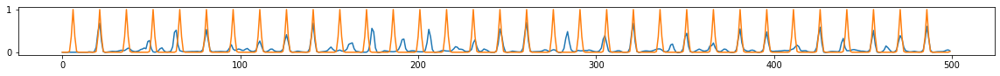

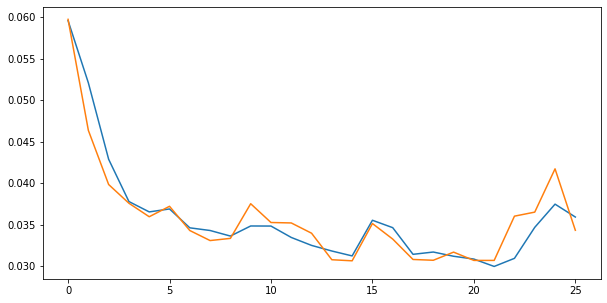

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.51it/s  0.0379                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 64
TRAIN LOSS: 0.03576538065034482
VAL LOSS: 0.035414587499366865


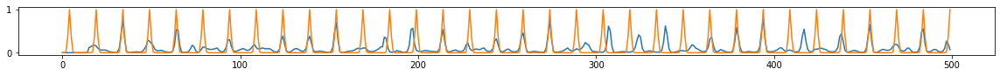

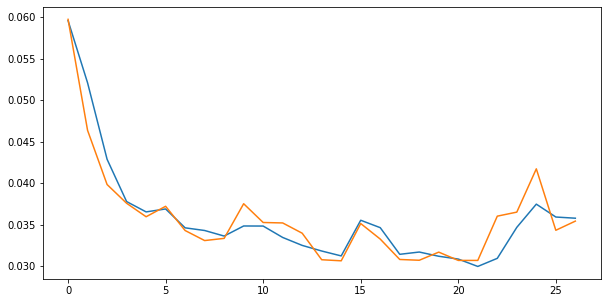

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.52it/s  0.0334                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 64
TRAIN LOSS: 0.03357293410226703
VAL LOSS: 0.03298567566606733


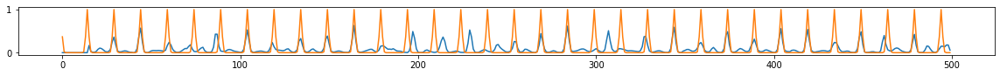

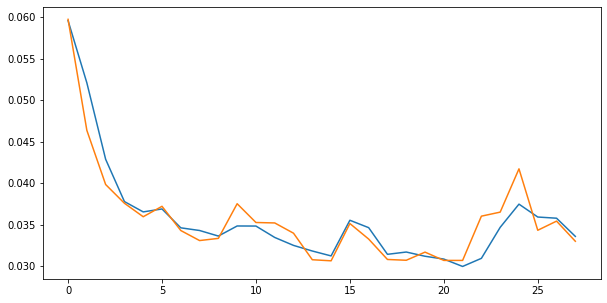

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.59it/s  0.0336                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 64
TRAIN LOSS: 0.03118862382446726
VAL LOSS: 0.031663159736328654


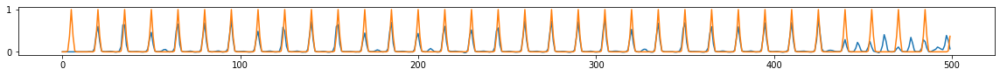

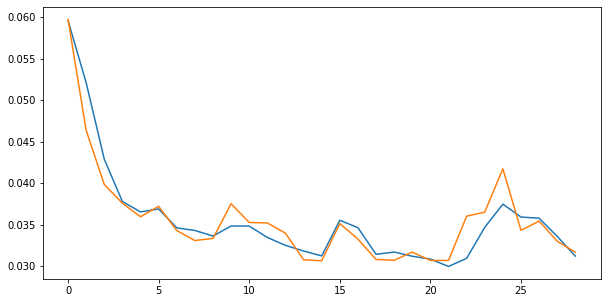

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.66it/s  0.0248                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 64
TRAIN LOSS: 0.02971567337711652
VAL LOSS: 0.030597442554103002


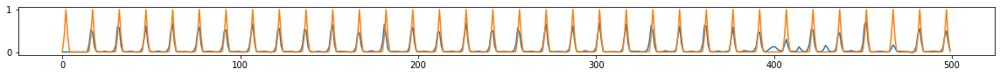

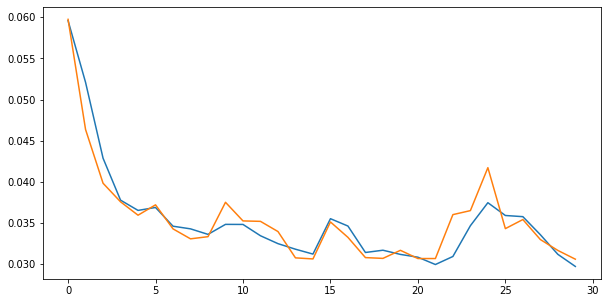

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0269                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 64
TRAIN LOSS: 0.030080748049335346
VAL LOSS: 0.030614757703410253


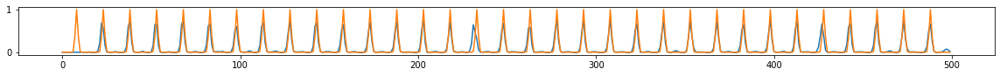

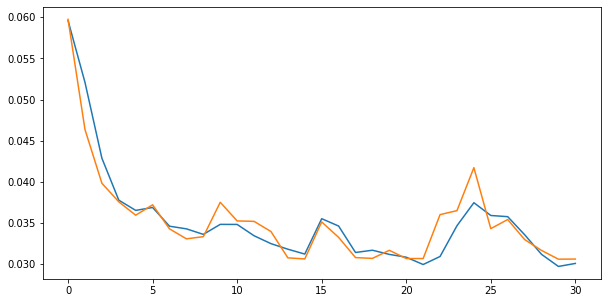

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.54it/s  0.0313                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 64
TRAIN LOSS: 0.030123725378264982
VAL LOSS: 0.029888865020540025


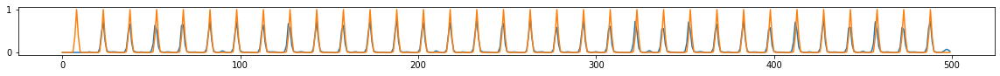

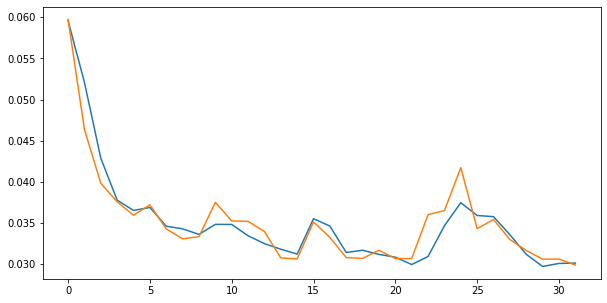

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.57it/s  0.0268                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 64
TRAIN LOSS: 0.029037826228886843
VAL LOSS: 0.02902575106256538


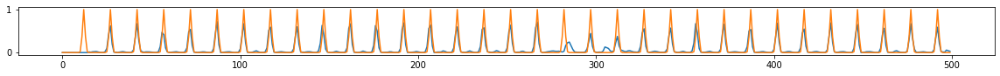

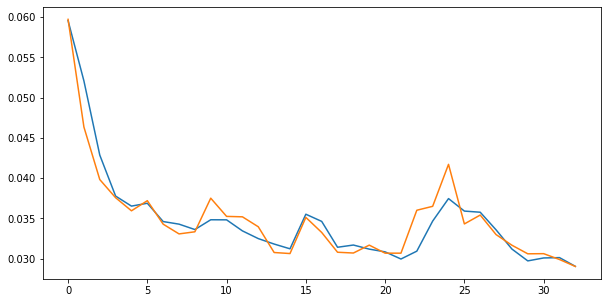

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.65it/s  0.0298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 64
TRAIN LOSS: 0.02981016965996888
VAL LOSS: 0.029655587755971484


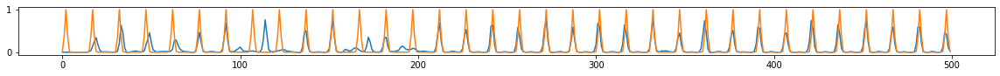

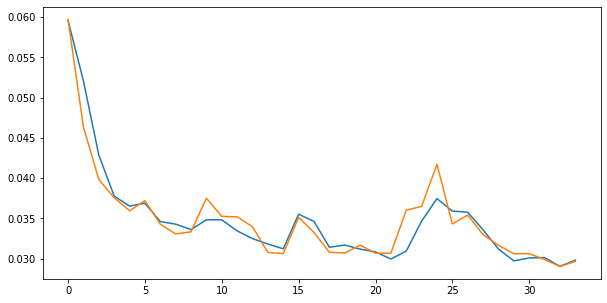

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0326                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 64
TRAIN LOSS: 0.03435611497196886
VAL LOSS: 0.0334530392040809


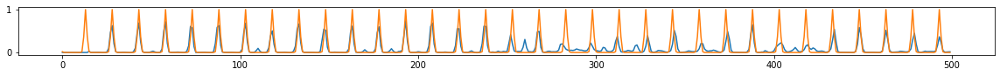

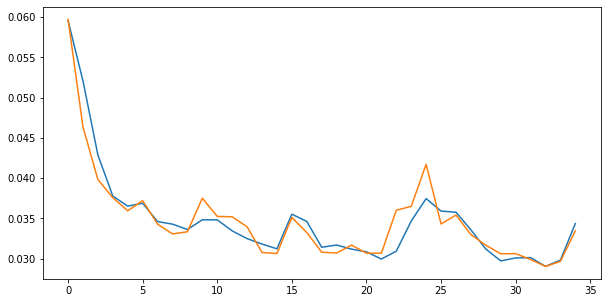

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0409                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 64
TRAIN LOSS: 0.031553495209664106
VAL LOSS: 0.031311644655134946


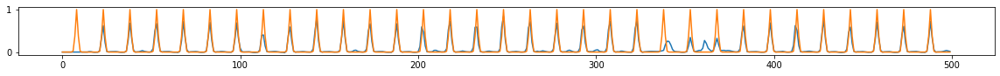

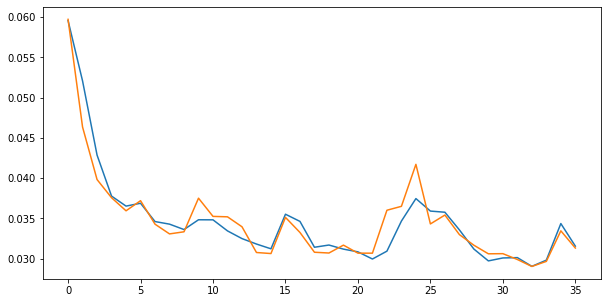

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.67it/s  0.0330                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 64
TRAIN LOSS: 0.031551667437371284
VAL LOSS: 0.035486750304698944


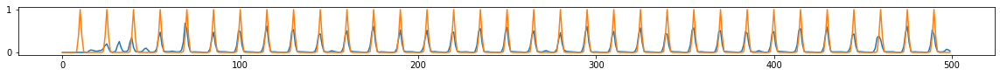

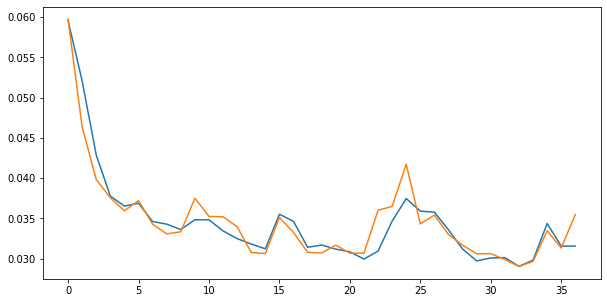

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.45it/s  0.0349                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 64
TRAIN LOSS: 0.03253348425237669
VAL LOSS: 0.031678879633545876


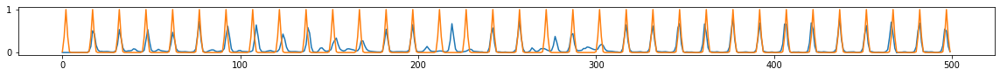

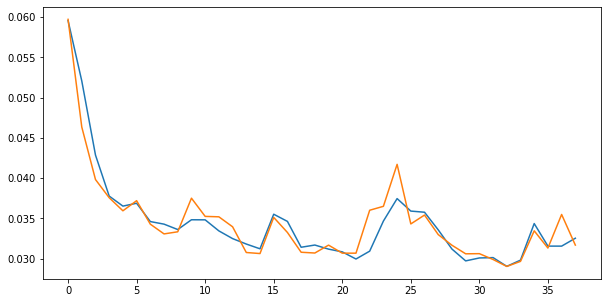

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.56it/s  0.0340                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 64
TRAIN LOSS: 0.030124760181125667
VAL LOSS: 0.03026423789560795


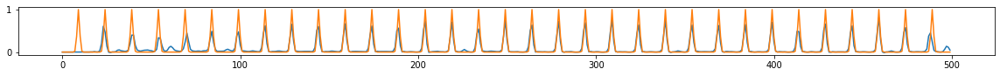

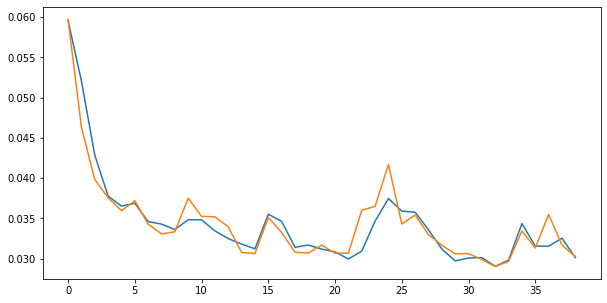

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0356                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 64
TRAIN LOSS: 0.030053919543408684
VAL LOSS: 0.030058772820565436


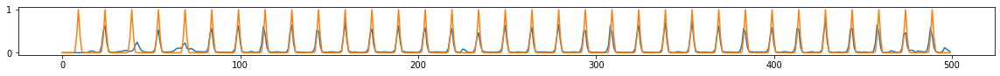

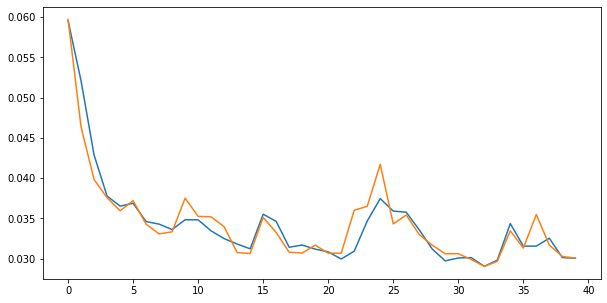

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.55it/s  0.0297                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 64
TRAIN LOSS: 0.02925805887207389
VAL LOSS: 0.02982636872265074


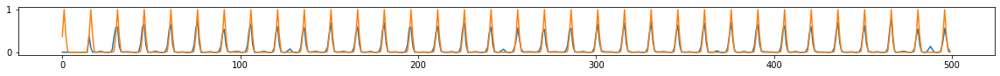

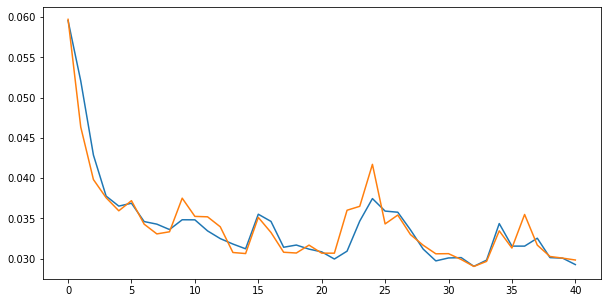

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0293                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 64
TRAIN LOSS: 0.028584292986326747
VAL LOSS: 0.029198951812254056


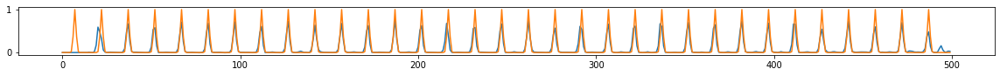

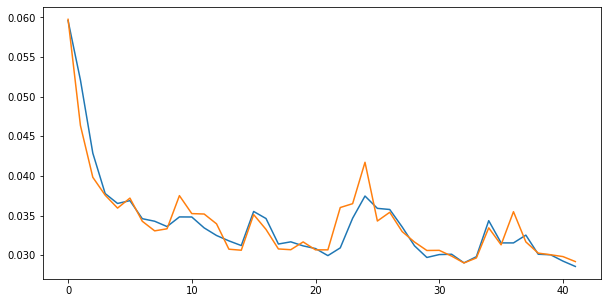

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0310                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 64
TRAIN LOSS: 0.029086558303485315
VAL LOSS: 0.030475968081090186


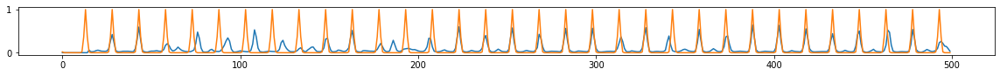

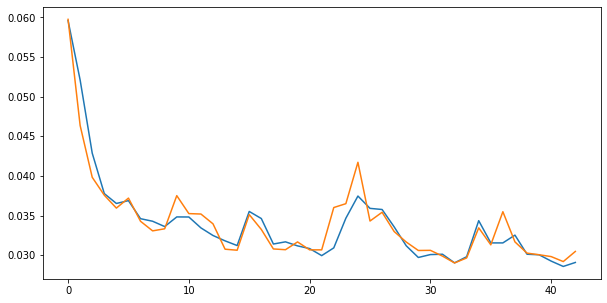

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.66it/s  0.0297                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 64
TRAIN LOSS: 0.03131469111475679
VAL LOSS: 0.030593057680461142


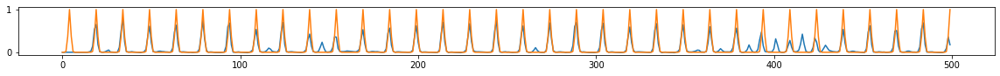

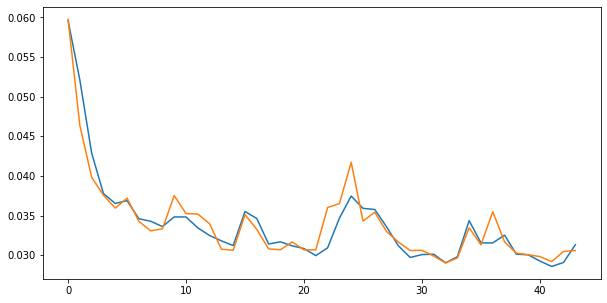

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.66it/s  0.0395                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 64
TRAIN LOSS: 0.03430681282447444
VAL LOSS: 0.034291481806172266


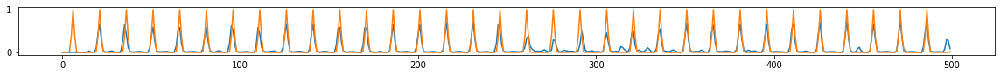

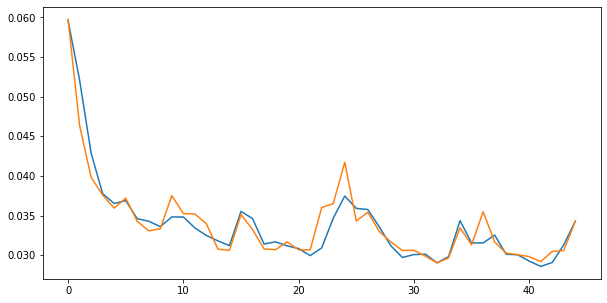

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.60it/s  0.0311                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 64
TRAIN LOSS: 0.03283933845038215
VAL LOSS: 0.03231476557751497


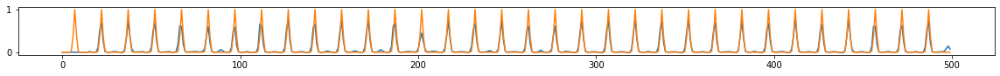

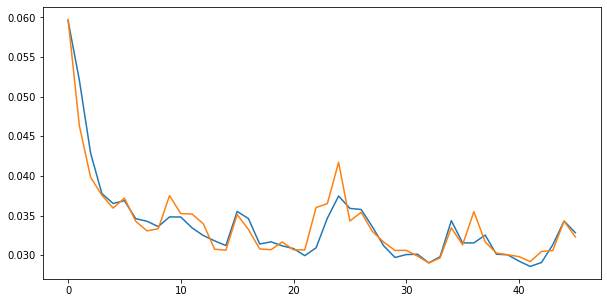

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.68it/s  0.0262                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 64
TRAIN LOSS: 0.03127780861945616
VAL LOSS: 0.031331685475177236


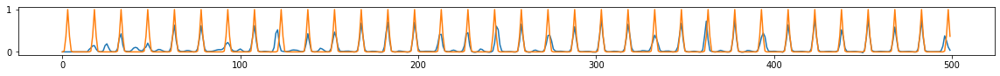

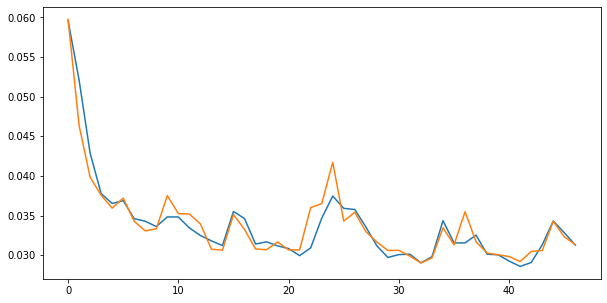

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.56it/s  0.0332                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 64
TRAIN LOSS: 0.03195861219945881
VAL LOSS: 0.032108773994776935


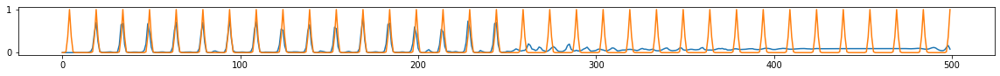

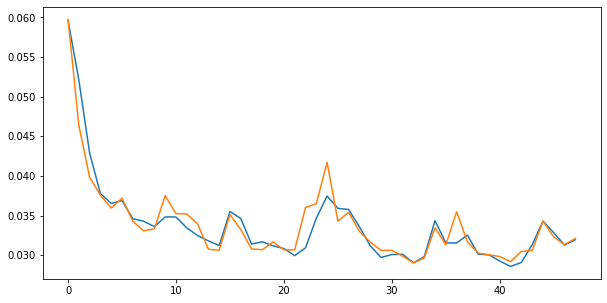

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0257                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 64
TRAIN LOSS: 0.030207463695357244
VAL LOSS: 0.03206397427452935


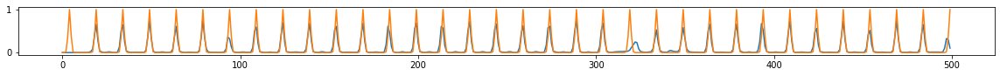

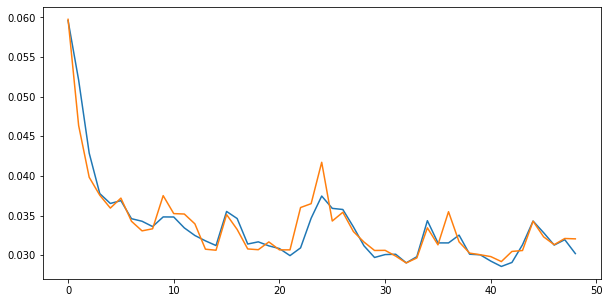

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.66it/s  0.0271                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 64
TRAIN LOSS: 0.02926000590539641
VAL LOSS: 0.02904148234261407


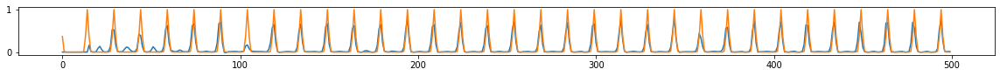

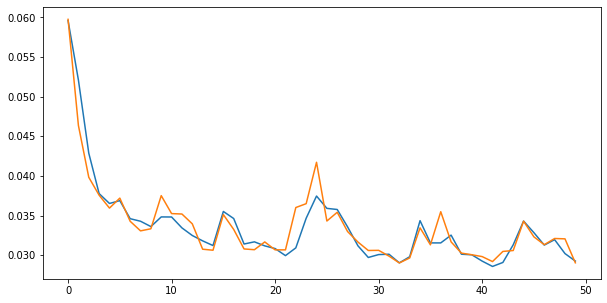

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.51it/s  0.0311                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 64
TRAIN LOSS: 0.028799309240033228
VAL LOSS: 0.028098704914251964


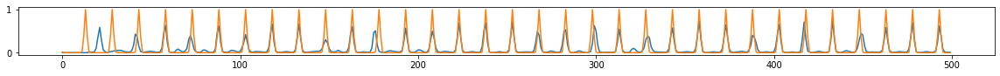

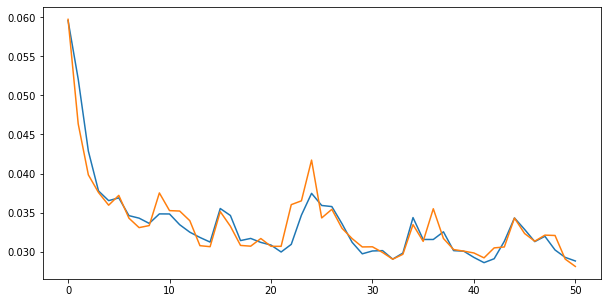

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.56it/s  0.0303                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 64
TRAIN LOSS: 0.02904368859405319
VAL LOSS: 0.0314457058492634


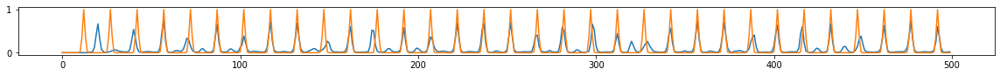

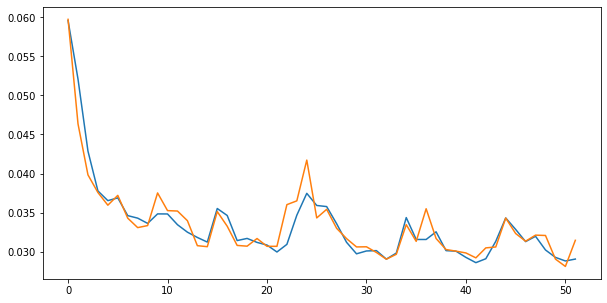

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.45it/s  0.0309                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 64
TRAIN LOSS: 0.029124093448950186
VAL LOSS: 0.029090341387523547


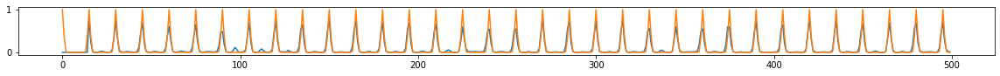

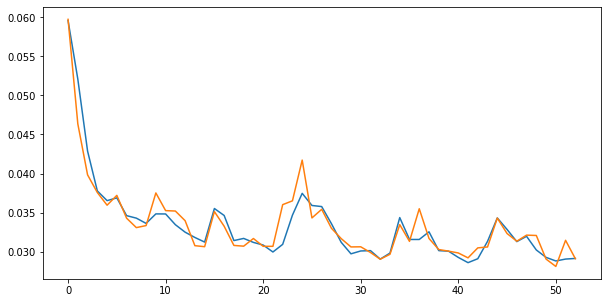

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.56it/s  0.0518                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 64
TRAIN LOSS: 0.03121718355557985
VAL LOSS: 0.04892014256782002


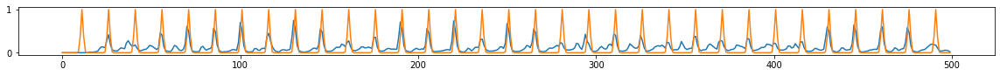

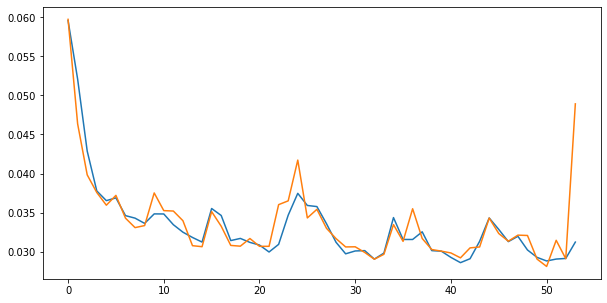

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0420                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 64
TRAIN LOSS: 0.04604094082282649
VAL LOSS: 0.04172275670700603


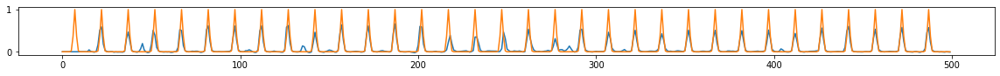

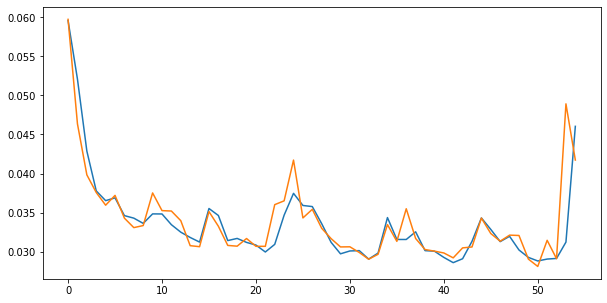

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.48it/s  0.0446                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 64
TRAIN LOSS: 0.04752491766379939
VAL LOSS: 0.0473740477528837


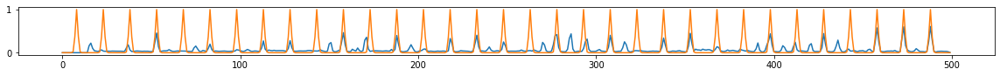

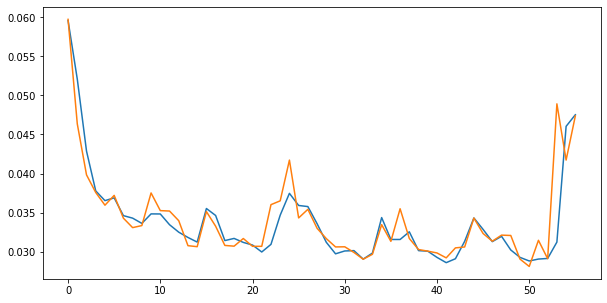

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.44it/s  0.0479                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 64
TRAIN LOSS: 0.044604091284175716
VAL LOSS: 0.04393594215313593


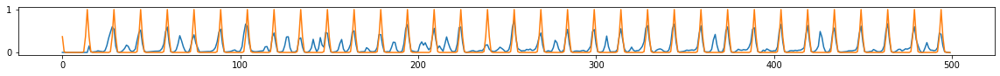

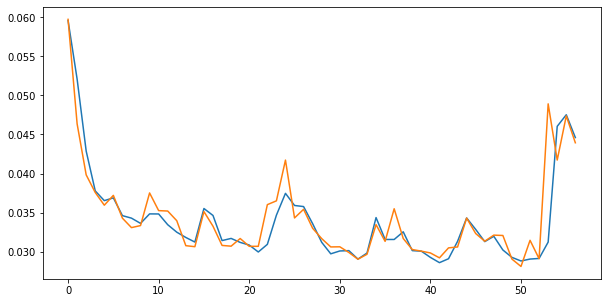

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.64it/s  0.0406                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 64
TRAIN LOSS: 0.041920243141551815
VAL LOSS: 0.040400289413001805


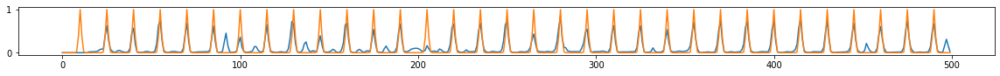

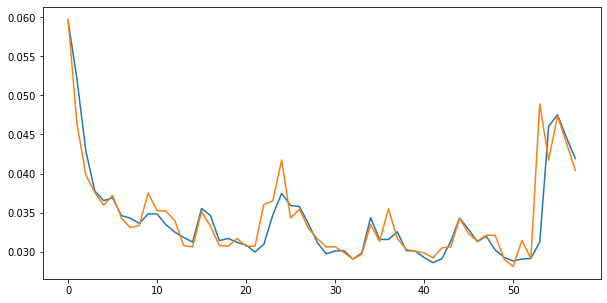

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.57it/s  0.0349                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 64
TRAIN LOSS: 0.037363477516919374
VAL LOSS: 0.03713216342859798


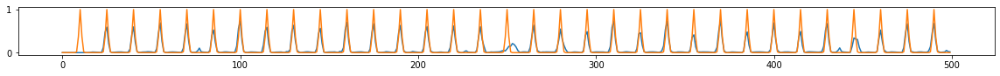

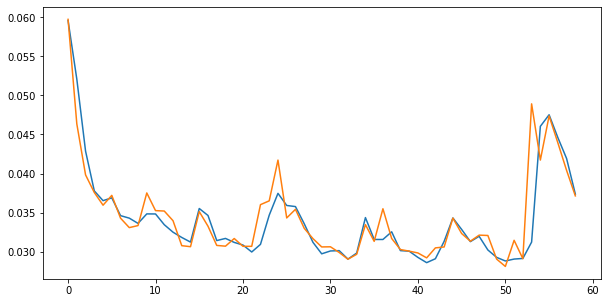

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0422                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 64
TRAIN LOSS: 0.0475502862698502
VAL LOSS: 0.045487607518831887


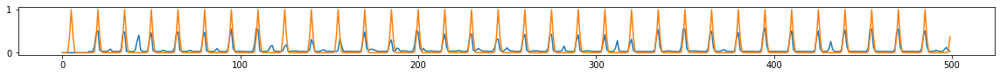

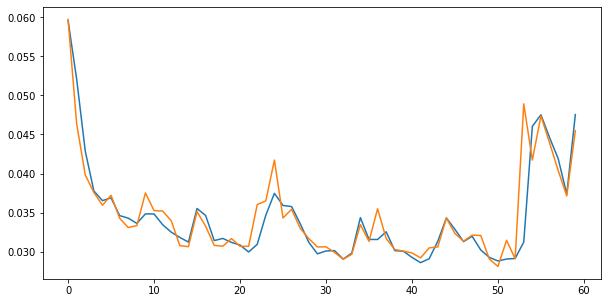

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.54it/s  0.0460                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 64
TRAIN LOSS: 0.041713162739243775
VAL LOSS: 0.040931386666165456


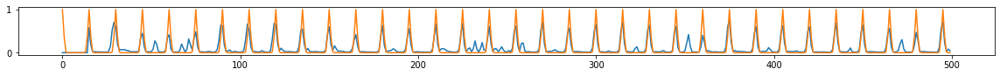

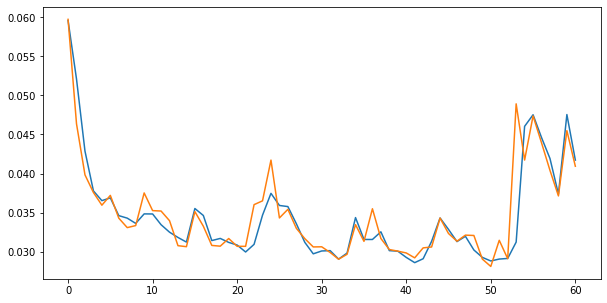

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.58it/s  0.0371                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 64
TRAIN LOSS: 0.038942806836631566
VAL LOSS: 0.03893414388100306


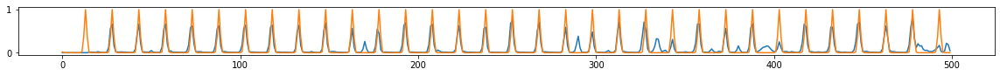

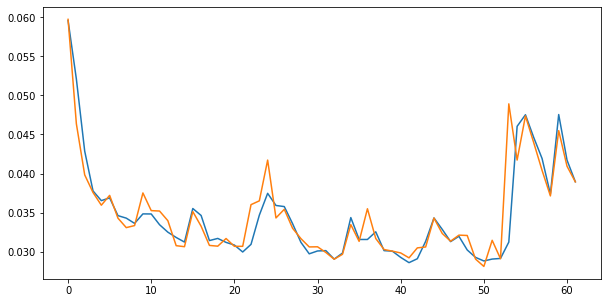

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0383                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 64
TRAIN LOSS: 0.037678227552937135
VAL LOSS: 0.03782353219058779


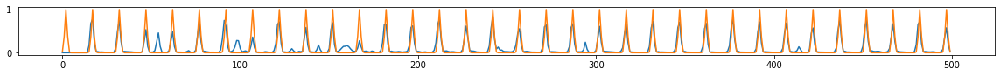

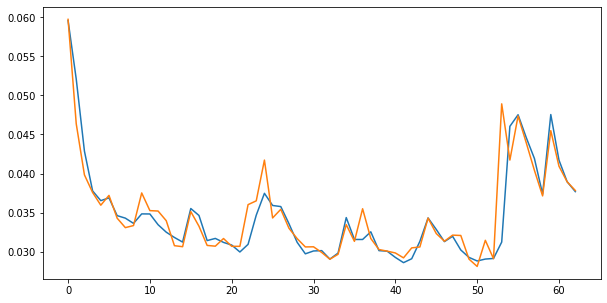

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.51it/s  0.0327                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 64
TRAIN LOSS: 0.03626862923718161
VAL LOSS: 0.03796893606583277


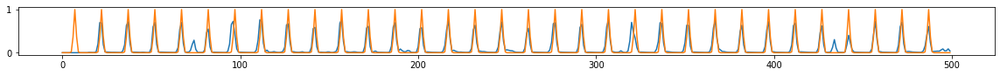

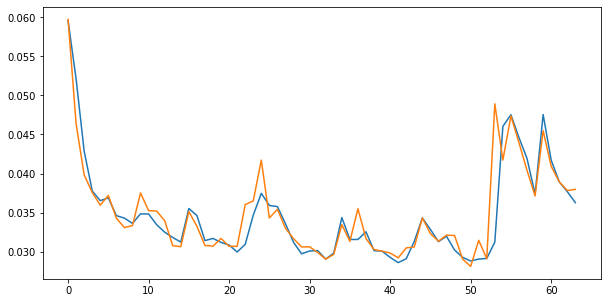

329.2813513278961 secs


In [94]:
start = time.time()

epochs = 64
trainBN()

end = time.time()
print(end - start, 'secs')

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0435                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

64 of 128
TRAIN LOSS: 0.034371934468961425
VAL LOSS: 0.044467848622136645
VAL_ACC50: 0.3134625084524744
VAL_ACC40: 0.44098594049773043


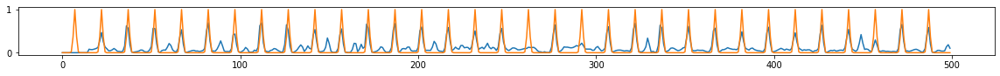

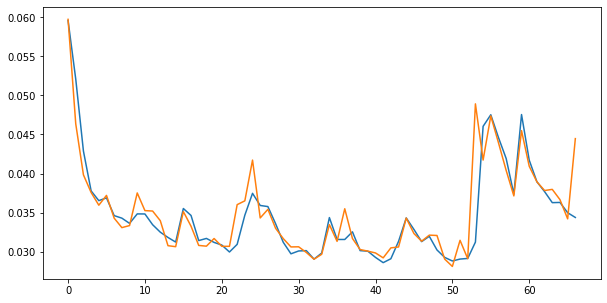

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.51it/s  0.0339                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

65 of 128
TRAIN LOSS: 0.0389890835310022
VAL LOSS: 0.036658269042770066
VAL_ACC50: 0.5523183334881765
VAL_ACC40: 0.6435920229717573


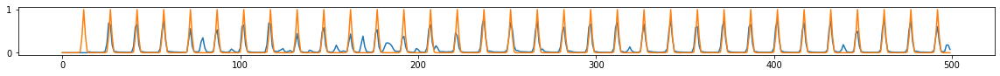

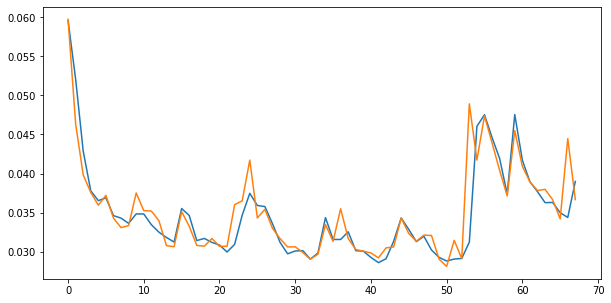

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.54it/s  0.0421                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

66 of 128
TRAIN LOSS: 0.034813091055386595
VAL LOSS: 0.03764159149593777
VAL_ACC50: 0.5206202557374529
VAL_ACC40: 0.6004201082384077


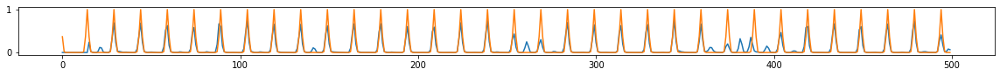

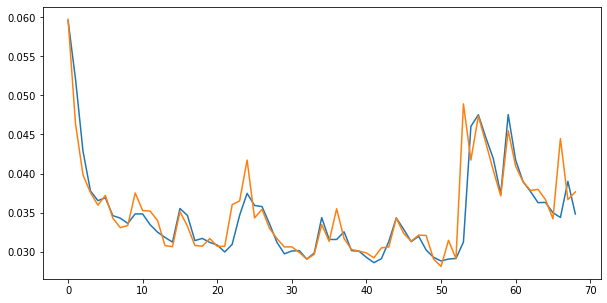

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0310                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

67 of 128
TRAIN LOSS: 0.03468839063619574
VAL LOSS: 0.03595932241943148
VAL_ACC50: 0.5207570648278634
VAL_ACC40: 0.6171301911962713


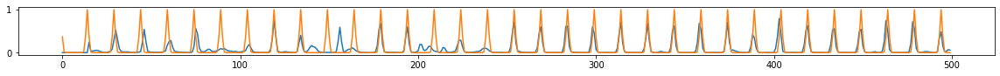

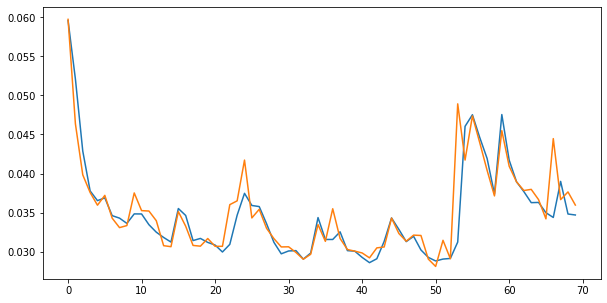

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.37it/s  0.0289                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

68 of 128
TRAIN LOSS: 0.03357161602212323
VAL LOSS: 0.03489758550292916
VAL_ACC50: 0.5580617145400857
VAL_ACC40: 0.6445635720434555


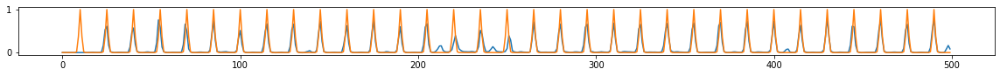

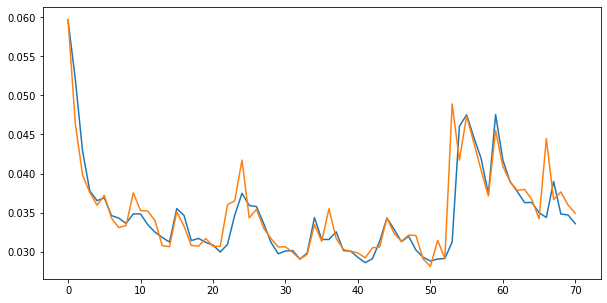

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.34it/s  0.0298                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

69 of 128
TRAIN LOSS: 0.03393283082793156
VAL LOSS: 0.03567731752991676
VAL_ACC50: 0.5746307404368239
VAL_ACC40: 0.6655406281145065


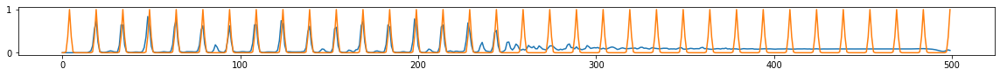

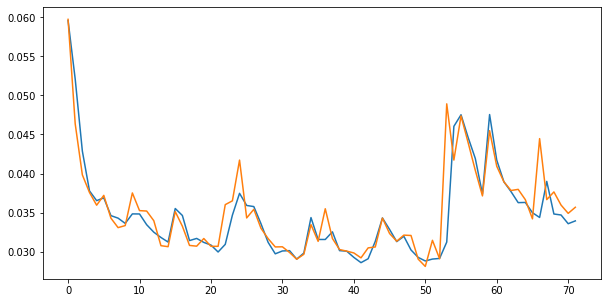

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.34it/s  0.0272                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

70 of 128
TRAIN LOSS: 0.0323741871656643
VAL LOSS: 0.03506319928500387
VAL_ACC50: 0.5828812022930339
VAL_ACC40: 0.6584620555117036


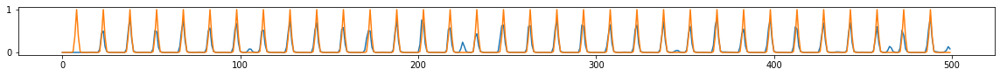

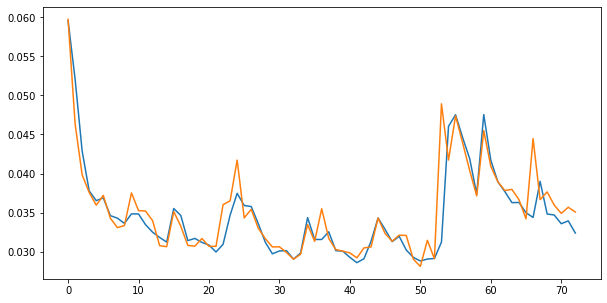

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.37it/s  0.0316                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

71 of 128
TRAIN LOSS: 0.03338343381053872
VAL LOSS: 0.035811321809887886
VAL_ACC50: 0.5516021675545816
VAL_ACC40: 0.6309870043982413


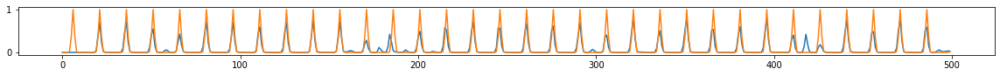

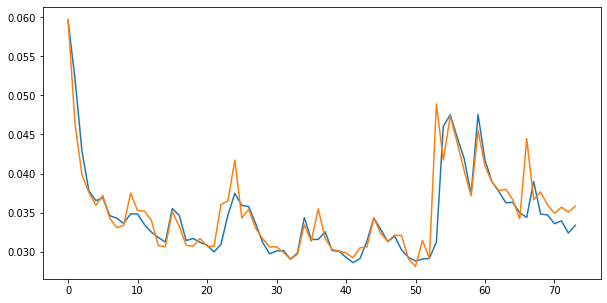

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.41it/s  0.0345                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

72 of 128
TRAIN LOSS: 0.03375780437555578
VAL LOSS: 0.03506145647002591
VAL_ACC50: 0.5190762103444828
VAL_ACC40: 0.6144282986099161


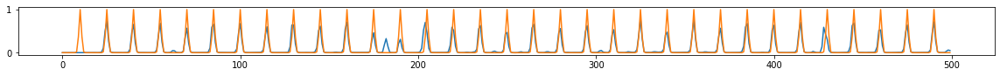

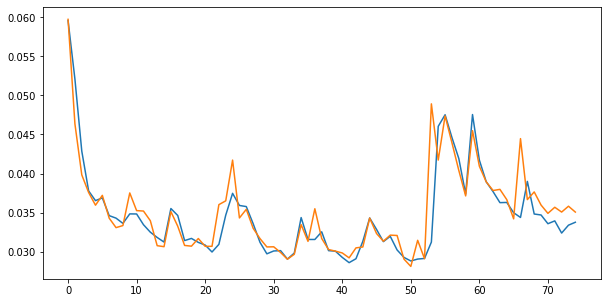

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.44it/s  0.0333                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

73 of 128
TRAIN LOSS: 0.0330142370528645
VAL LOSS: 0.03440632795294126
VAL_ACC50: 0.5980219804655023
VAL_ACC40: 0.6729263402165448


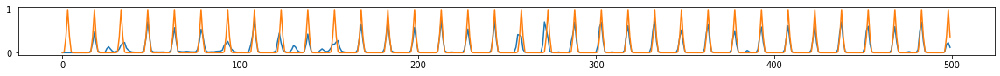

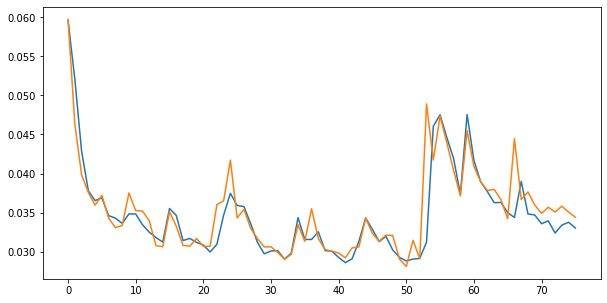

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0283                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

74 of 128
TRAIN LOSS: 0.03233970365383559
VAL LOSS: 0.03216785378754139
VAL_ACC50: 0.5767300017471949
VAL_ACC40: 0.6700406871760953


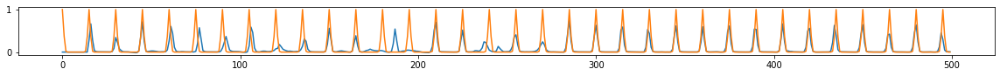

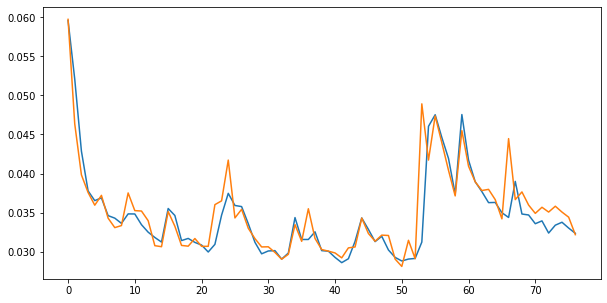

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.36it/s  0.0334                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

75 of 128
TRAIN LOSS: 0.03330396772879693
VAL LOSS: 0.03589205568035444
VAL_ACC50: 0.6379982670774518
VAL_ACC40: 0.7042483752490639


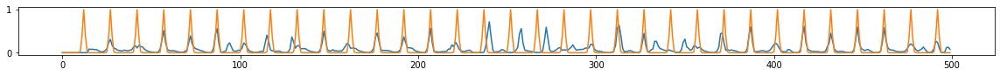

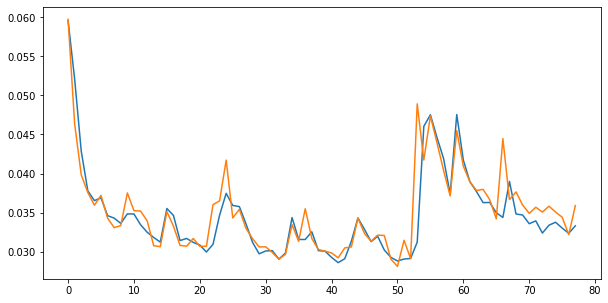

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.39it/s  0.0333                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

76 of 128
TRAIN LOSS: 0.0330441737961438
VAL LOSS: 0.03469254242049323
VAL_ACC50: 0.5787436273681101
VAL_ACC40: 0.6556075758459432


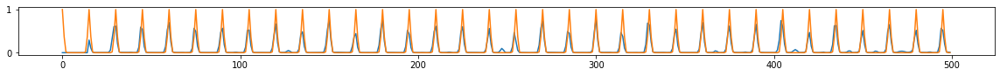

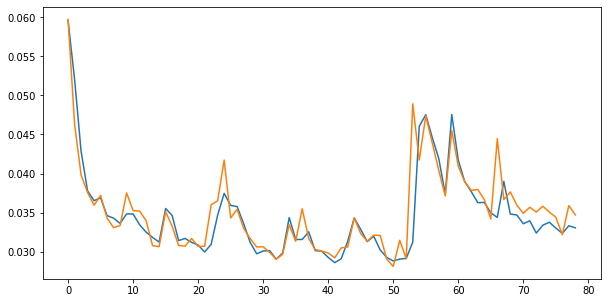

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0387                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

77 of 128
TRAIN LOSS: 0.03244980719561378
VAL LOSS: 0.03280856336156527
VAL_ACC50: 0.6419825426103434
VAL_ACC40: 0.7159361039065874


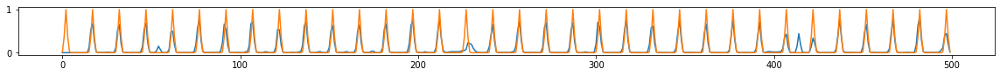

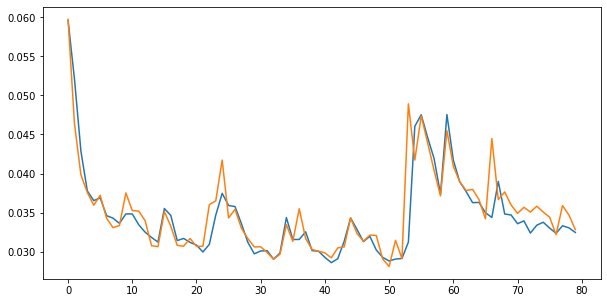

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0281                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

78 of 128
TRAIN LOSS: 0.03255823477067881
VAL LOSS: 0.03268910696109136
VAL_ACC50: 0.6029774651165087
VAL_ACC40: 0.6985935109921885


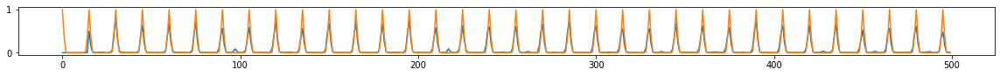

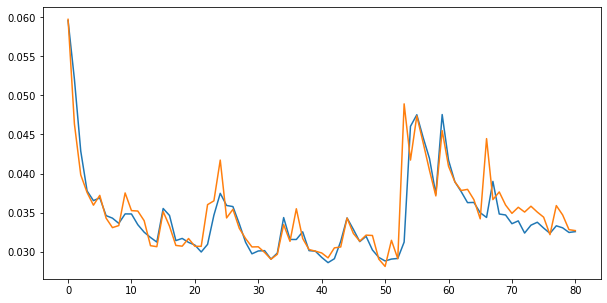

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.33it/s  0.0270                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

79 of 128
TRAIN LOSS: 0.031624718465738826
VAL LOSS: 0.03141736715204186
VAL_ACC50: 0.6469549485221933
VAL_ACC40: 0.7092445302448851


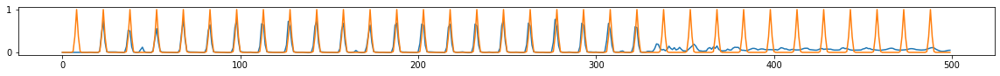

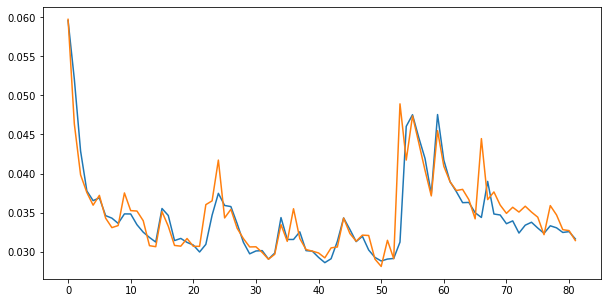

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0335                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

80 of 128
TRAIN LOSS: 0.032305294544332556
VAL LOSS: 0.03235248579747147
VAL_ACC50: 0.6346437721176342
VAL_ACC40: 0.710470268306824


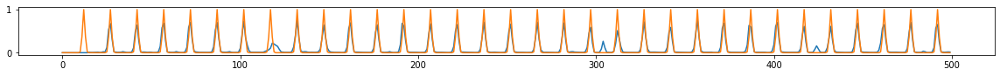

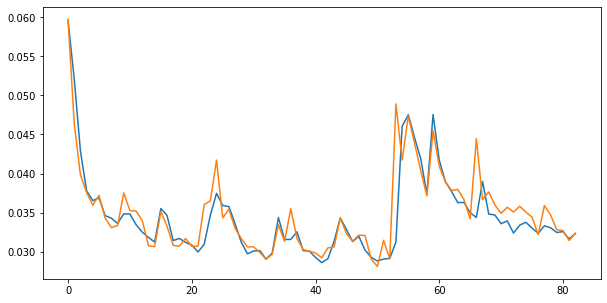

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0252                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

81 of 128
TRAIN LOSS: 0.03130499909942349
VAL LOSS: 0.032263150438666344
VAL_ACC50: 0.5725472529303158
VAL_ACC40: 0.666019670815092


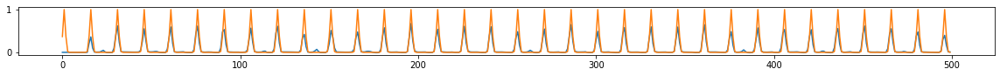

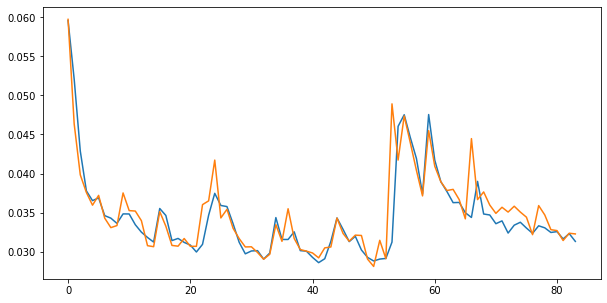

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.29it/s  0.0305                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

82 of 128
TRAIN LOSS: 0.032143419401513204
VAL LOSS: 0.03252096494866742
VAL_ACC50: 0.616841597032357
VAL_ACC40: 0.6956187185856153


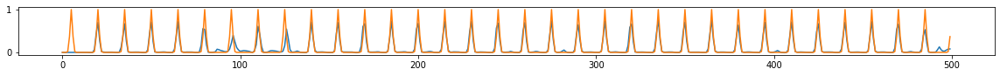

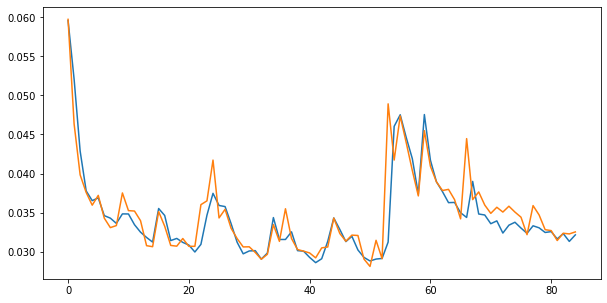

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.30it/s  0.0329                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

83 of 128
TRAIN LOSS: 0.032461549207154244
VAL LOSS: 0.03318659278253714
VAL_ACC50: 0.6999993795723178
VAL_ACC40: 0.7602570884473412


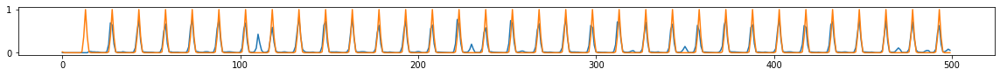

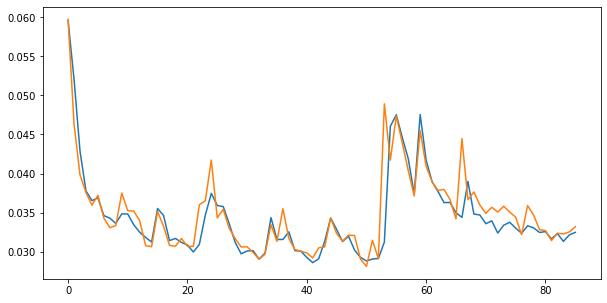

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.38it/s  0.0292                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

84 of 128
TRAIN LOSS: 0.03265676155893339
VAL LOSS: 0.03432459673947758
VAL_ACC50: 0.6459050389864132
VAL_ACC40: 0.7102573298248513


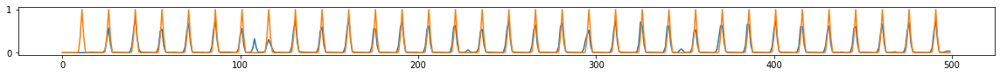

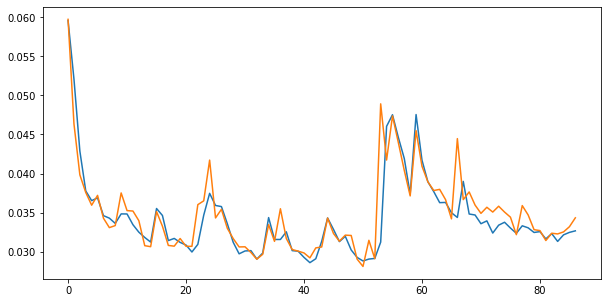

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0329                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

85 of 128
TRAIN LOSS: 0.03222235923426019
VAL LOSS: 0.03367320551640458
VAL_ACC50: 0.5909848366770062
VAL_ACC40: 0.6785904553532928


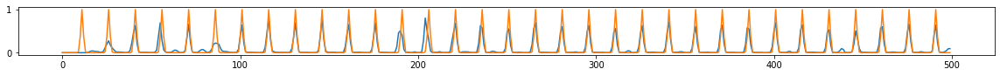

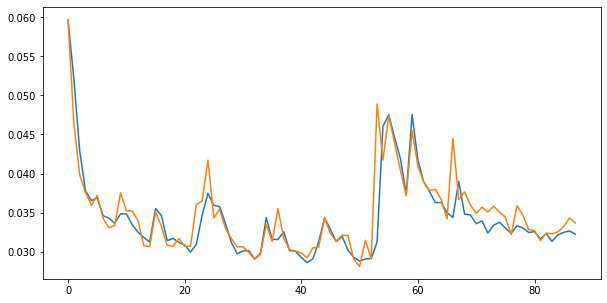

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0285                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

86 of 128
TRAIN LOSS: 0.03062269241652555
VAL LOSS: 0.03133711384402381
VAL_ACC50: 0.642740128759145
VAL_ACC40: 0.7146168007048047


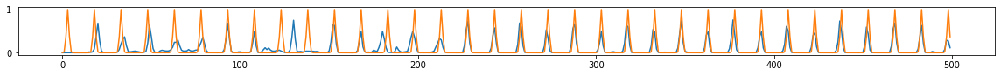

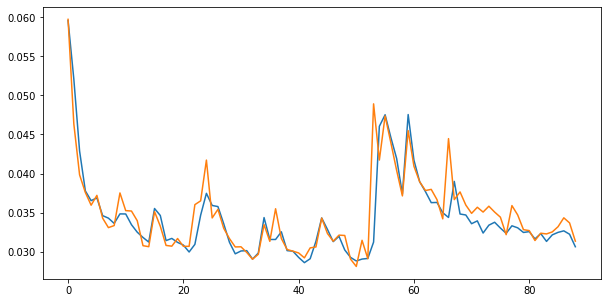

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.45it/s  0.0303                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

87 of 128
TRAIN LOSS: 0.031415222885294095
VAL LOSS: 0.03350508771836758
VAL_ACC50: 0.575967968217965
VAL_ACC40: 0.6647779308542455


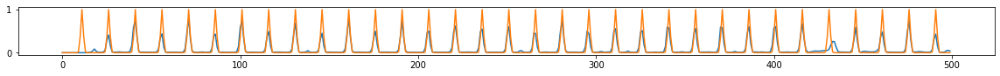

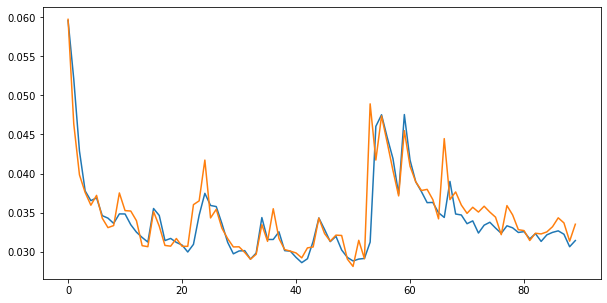

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0318                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

88 of 128
TRAIN LOSS: 0.03257912123161885
VAL LOSS: 0.036198014186488256
VAL_ACC50: 0.4857062405508846
VAL_ACC40: 0.5930859133999449


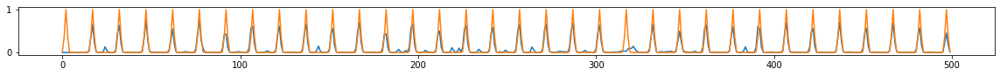

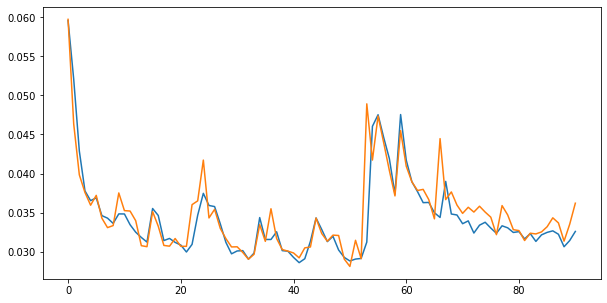

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0407                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

89 of 128
TRAIN LOSS: 0.03725279546860191
VAL LOSS: 0.042316772457626134
VAL_ACC50: 0.23627752325981902
VAL_ACC40: 0.3739069755870917


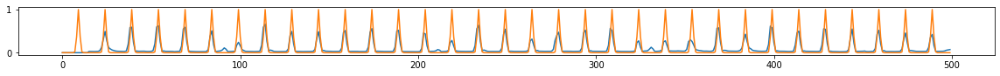

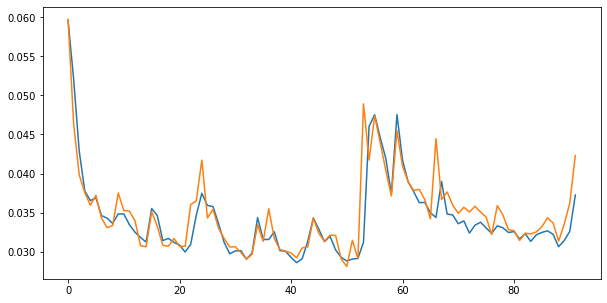

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.48it/s  0.0342                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

90 of 128
TRAIN LOSS: 0.0390711655943758
VAL LOSS: 0.03858035968409644
VAL_ACC50: 0.5058697656135249
VAL_ACC40: 0.6128546566787807


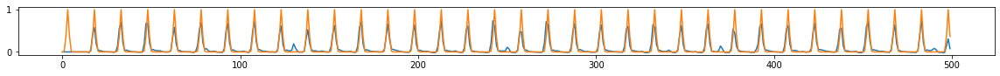

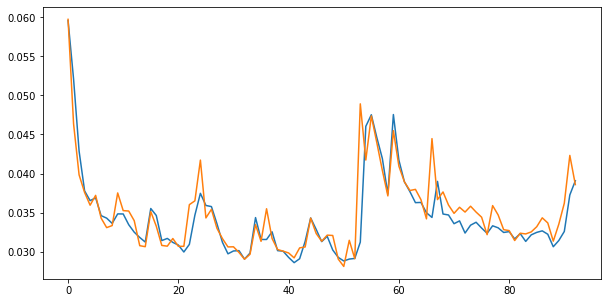

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0324                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

91 of 128
TRAIN LOSS: 0.036065285766704216
VAL LOSS: 0.03592311549517843
VAL_ACC50: 0.5549928509192309
VAL_ACC40: 0.6374539195384082


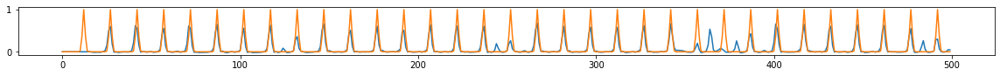

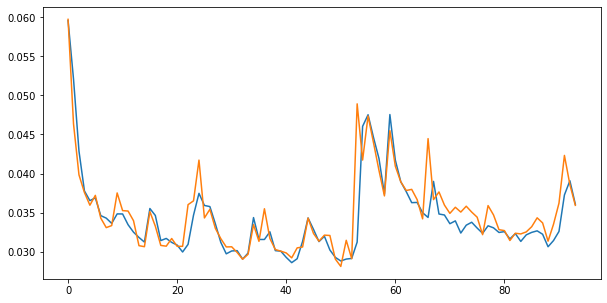

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.31it/s  0.0403                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

92 of 128
TRAIN LOSS: 0.03560847990835706
VAL LOSS: 0.03504516908691989
VAL_ACC50: 0.5103063444004177
VAL_ACC40: 0.6275311477658831


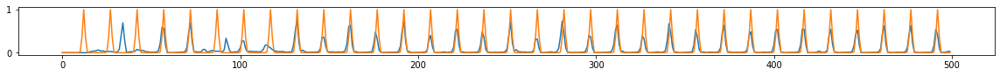

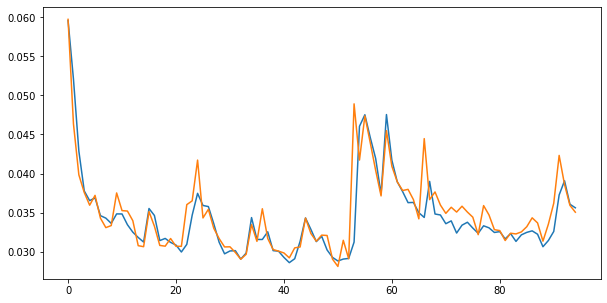

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.32it/s  0.0374                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

93 of 128
TRAIN LOSS: 0.03527751099318266
VAL LOSS: 0.035431586412919894
VAL_ACC50: 0.573606217087492
VAL_ACC40: 0.6612484905200424


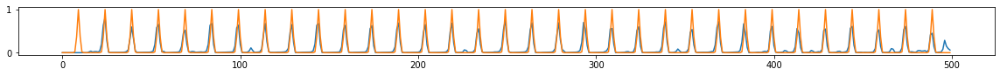

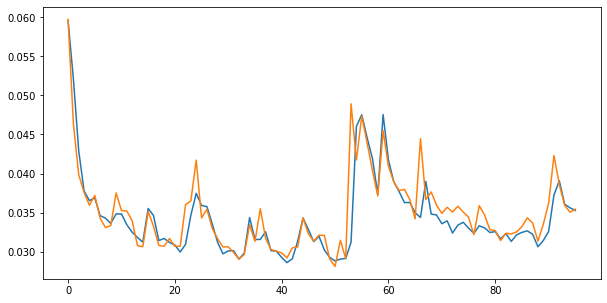

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.38it/s  0.0368                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

94 of 128
TRAIN LOSS: 0.03413633189888464
VAL LOSS: 0.03415606398549345
VAL_ACC50: 0.6068950658184744
VAL_ACC40: 0.6894445630745856


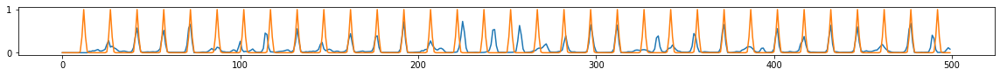

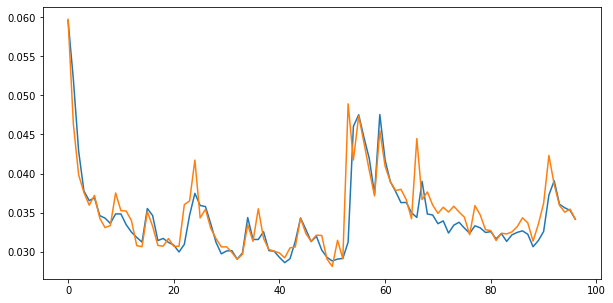

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.36it/s  0.0322                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

95 of 128
TRAIN LOSS: 0.033482877641088434
VAL LOSS: 0.03331805827716986
VAL_ACC50: 0.6001346782091478
VAL_ACC40: 0.6797633224007704


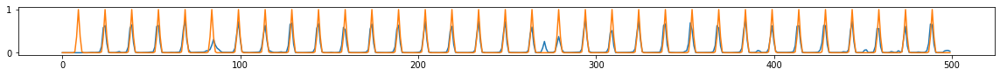

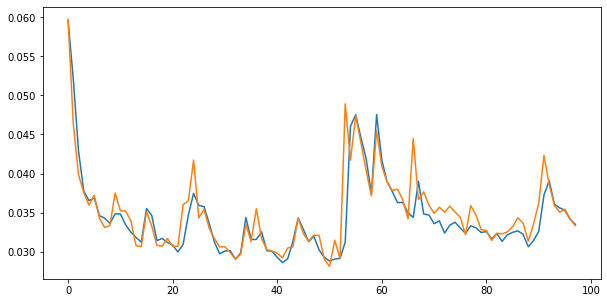

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0320                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

96 of 128
TRAIN LOSS: 0.03331320303388768
VAL LOSS: 0.0330715442283286
VAL_ACC50: 0.5912317616123552
VAL_ACC40: 0.6769247701174672


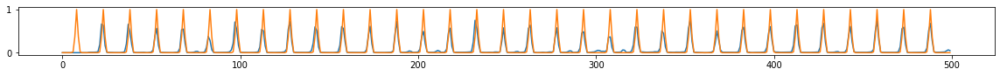

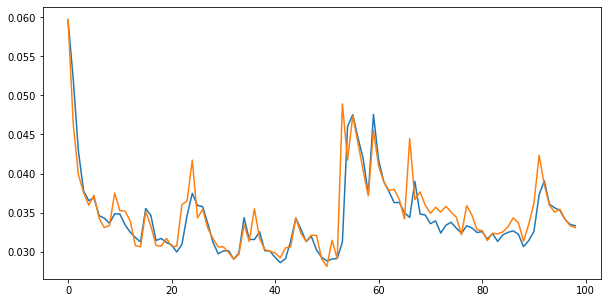

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.39it/s  0.0412                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

97 of 128
TRAIN LOSS: 0.03386735771265295
VAL LOSS: 0.03591993244157897
VAL_ACC50: 0.5547032086680224
VAL_ACC40: 0.6380754743664231


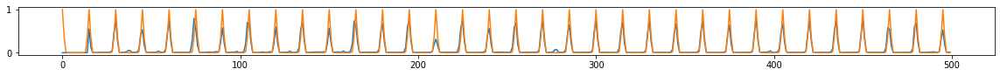

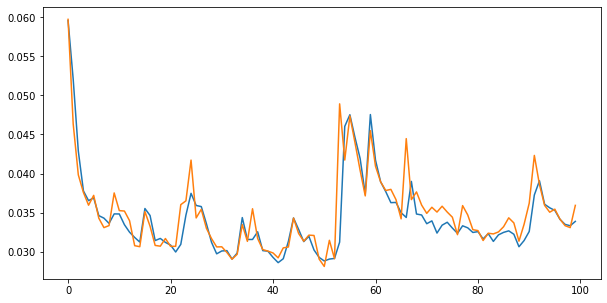

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.45it/s  0.0341                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

98 of 128
TRAIN LOSS: 0.03312390059646633
VAL LOSS: 0.03285950360198816
VAL_ACC50: 0.6249159188959262
VAL_ACC40: 0.7048962601250576


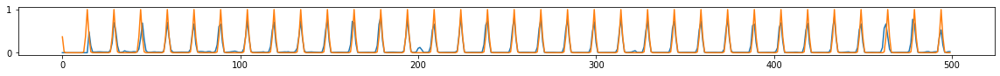

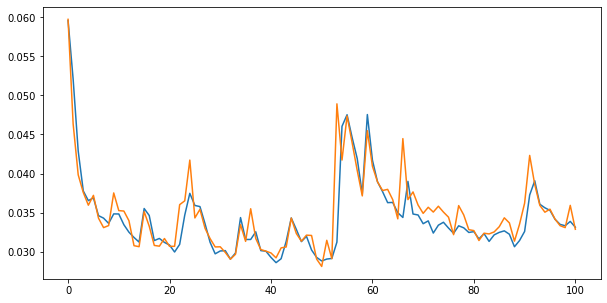

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.43it/s  0.0301                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

99 of 128
TRAIN LOSS: 0.03077499045886927
VAL LOSS: 0.03237023494309849
VAL_ACC50: 0.6258224603407206
VAL_ACC40: 0.7018652236424194


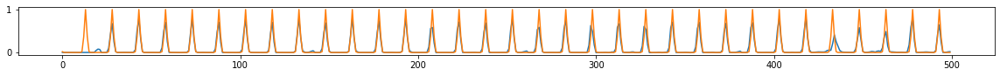

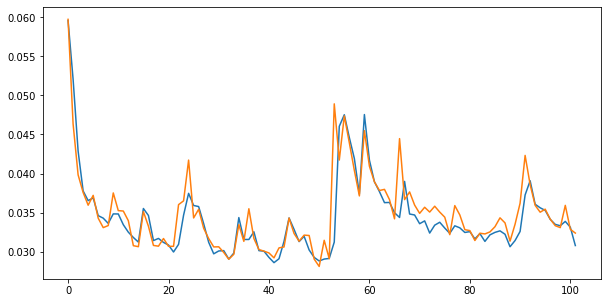

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:05<00:00:00  7.06it/s  0.0260                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

100 of 128
TRAIN LOSS: 0.031273210059023566
VAL LOSS: 0.032337696188026004
VAL_ACC50: 0.6462970462690132
VAL_ACC40: 0.7231937453580909


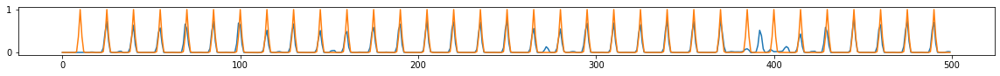

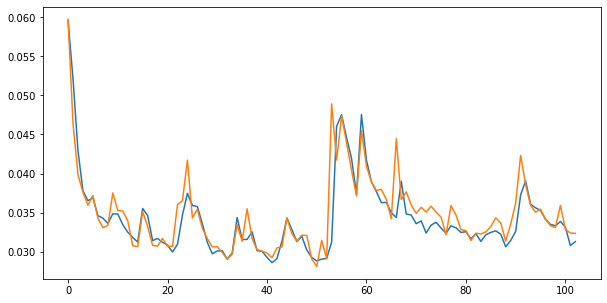

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0352                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

101 of 128
TRAIN LOSS: 0.03139350511547592
VAL LOSS: 0.029227738165193133
VAL_ACC50: 0.6854229527985618
VAL_ACC40: 0.7542749572417606


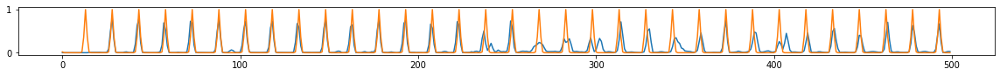

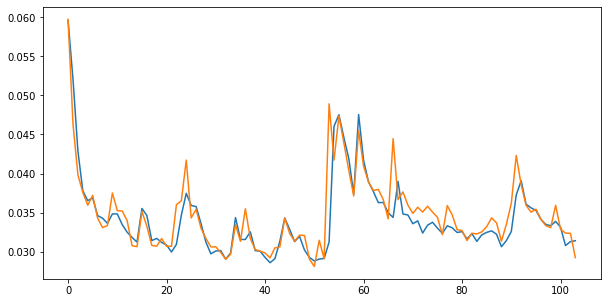

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0299                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

102 of 128
TRAIN LOSS: 0.03115689366435011
VAL LOSS: 0.03240838936633534
VAL_ACC50: 0.5948158510813867
VAL_ACC40: 0.6798213713323625


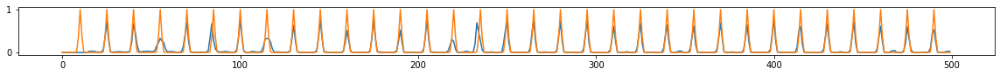

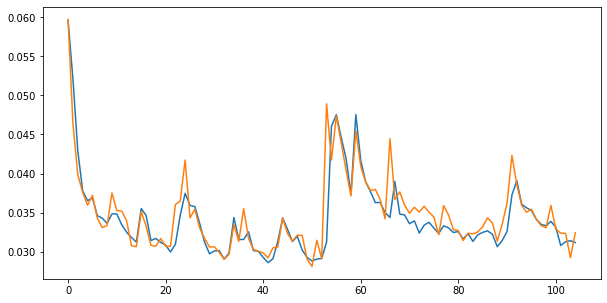

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0261                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

103 of 128
TRAIN LOSS: 0.03114464149499933
VAL LOSS: 0.03105316911306646
VAL_ACC50: 0.7140382239455397
VAL_ACC40: 0.7739118435007296


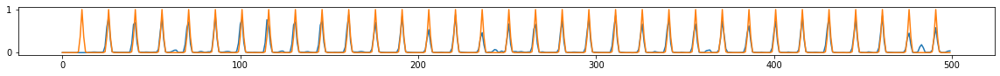

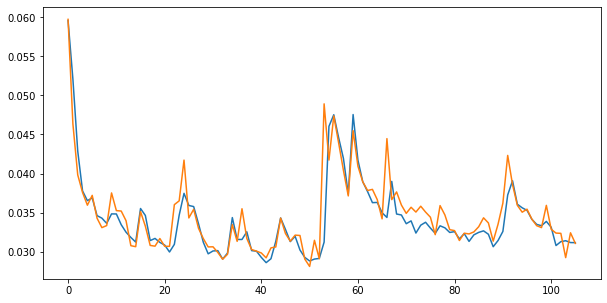

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0310                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

104 of 128
TRAIN LOSS: 0.030085866649945576
VAL LOSS: 0.03344464819464418
VAL_ACC50: 0.591760687302785
VAL_ACC40: 0.6641280583268725


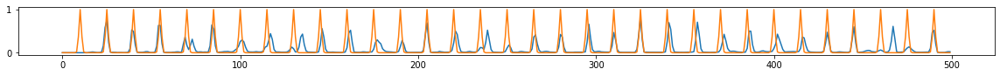

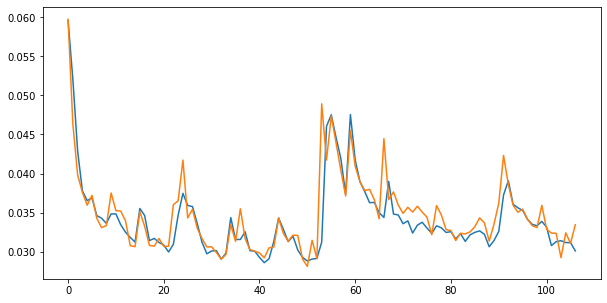

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.37it/s  0.0339                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

105 of 128
TRAIN LOSS: 0.03170301170191831
VAL LOSS: 0.03272860455844137
VAL_ACC50: 0.5835362646132353
VAL_ACC40: 0.6804104572427966


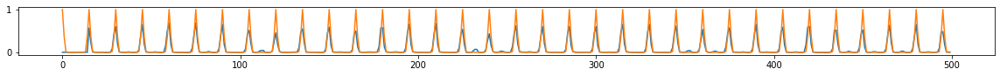

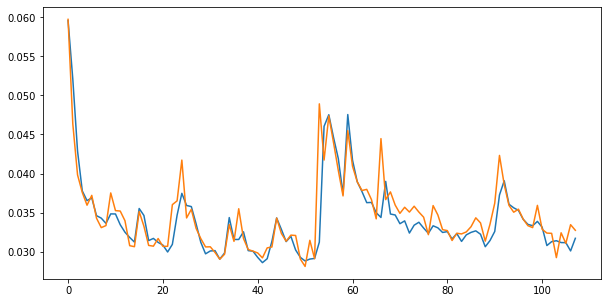

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0337                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

106 of 128
TRAIN LOSS: 0.031082657269305654
VAL LOSS: 0.030302965806590185
VAL_ACC50: 0.6638547926103641
VAL_ACC40: 0.7430626720653002


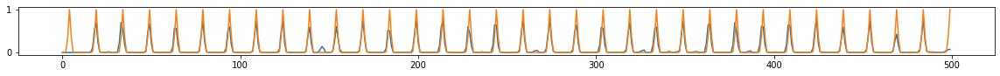

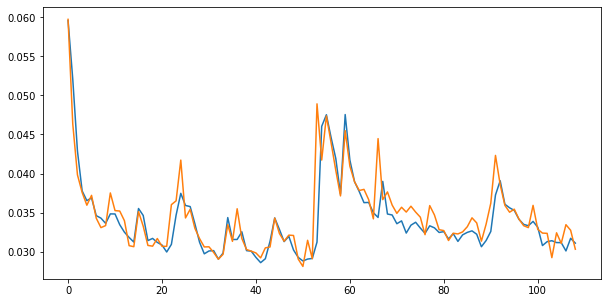

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.34it/s  0.0340                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

107 of 128
TRAIN LOSS: 0.030863358328739803
VAL LOSS: 0.031954293656680316
VAL_ACC50: 0.6085600498663433
VAL_ACC40: 0.7082508788310007


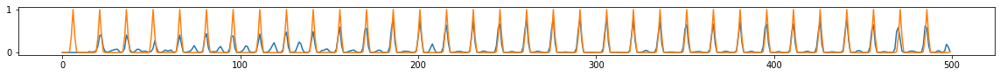

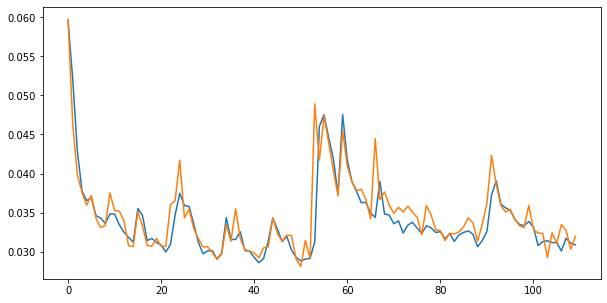

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.30it/s  0.0435                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

108 of 128
TRAIN LOSS: 0.03129525467132529
VAL LOSS: 0.03194326265818543
VAL_ACC50: 0.619785240231931
VAL_ACC40: 0.6875596620968143


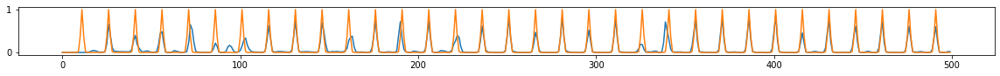

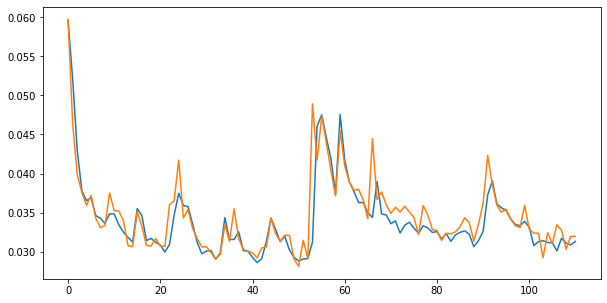

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.43it/s  0.0354                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

109 of 128
TRAIN LOSS: 0.031970899655587144
VAL LOSS: 0.034665415063500404
VAL_ACC50: 0.590668954948286
VAL_ACC40: 0.6669405216719564


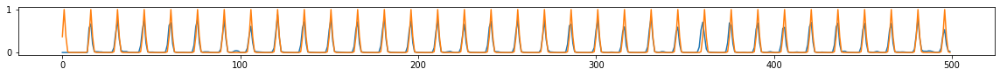

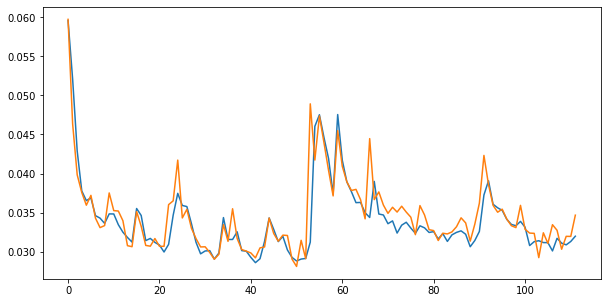

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.53it/s  0.0292                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

110 of 128
TRAIN LOSS: 0.03273996136461695
VAL LOSS: 0.03375494914750258
VAL_ACC50: 0.6303699475095306
VAL_ACC40: 0.7072649253160486


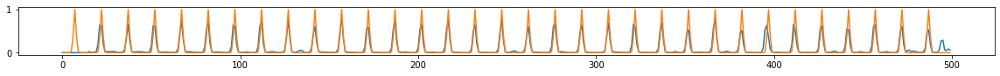

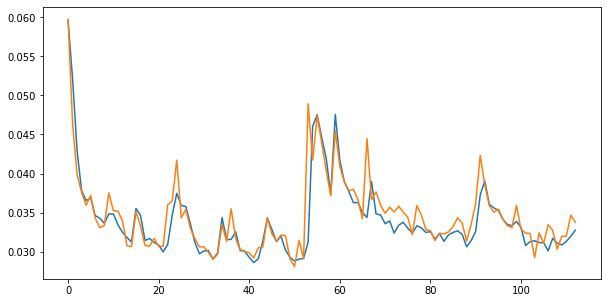

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.39it/s  0.0304                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

111 of 128
TRAIN LOSS: 0.032814689394500524
VAL LOSS: 0.03348238372968303
VAL_ACC50: 0.573237504642346
VAL_ACC40: 0.6691931848801188


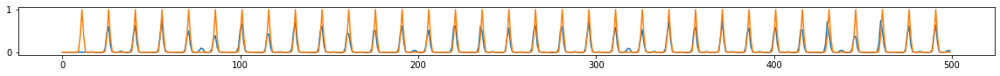

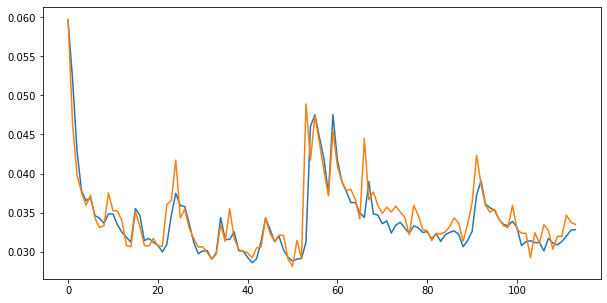

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0393                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

112 of 128
TRAIN LOSS: 0.03333270849867
VAL LOSS: 0.03619988842142953
VAL_ACC50: 0.527450428332655
VAL_ACC40: 0.6507163050659818


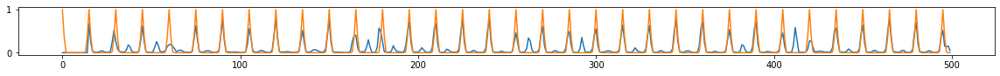

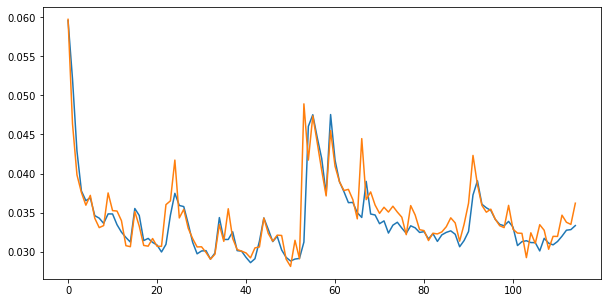

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.43it/s  0.0319                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

113 of 128
TRAIN LOSS: 0.034282737515038915
VAL LOSS: 0.03538417609201537
VAL_ACC50: 0.5401338651686194
VAL_ACC40: 0.6307574199215883


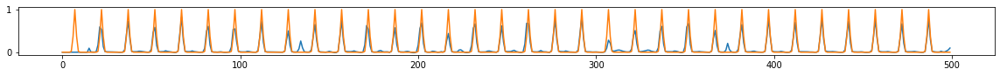

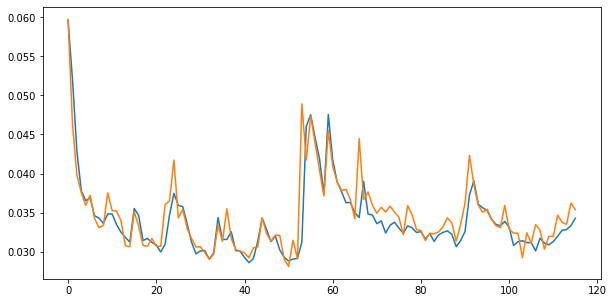

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.47it/s  0.0352                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

114 of 128
TRAIN LOSS: 0.036880772612575025
VAL LOSS: 0.03703819463650385
VAL_ACC50: 0.45387932636224737
VAL_ACC40: 0.5827149865803741


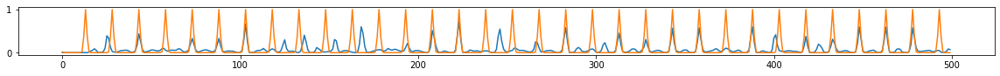

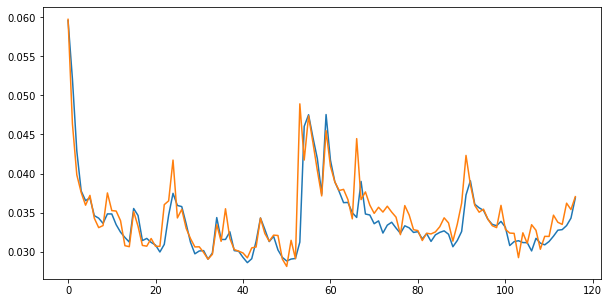

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.46it/s  0.0413                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

115 of 128
TRAIN LOSS: 0.03505909204896954
VAL LOSS: 0.03673382765716977
VAL_ACC50: 0.4228542088519486
VAL_ACC40: 0.5584825245799314


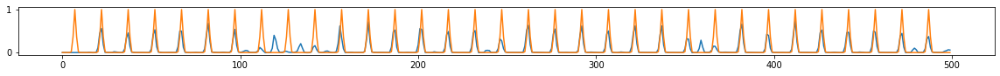

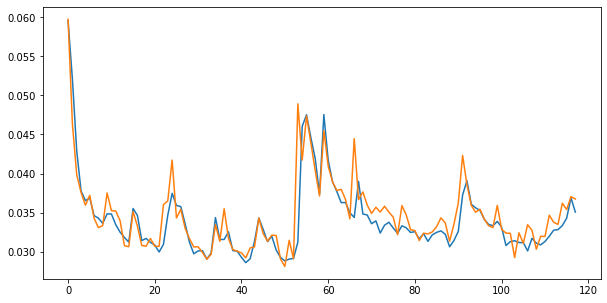

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.37it/s  0.0329                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

116 of 128
TRAIN LOSS: 0.033124284715288214
VAL LOSS: 0.03363198207484351
VAL_ACC50: 0.613670497055442
VAL_ACC40: 0.7022900351777936


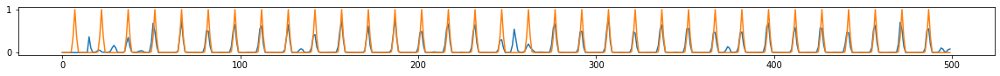

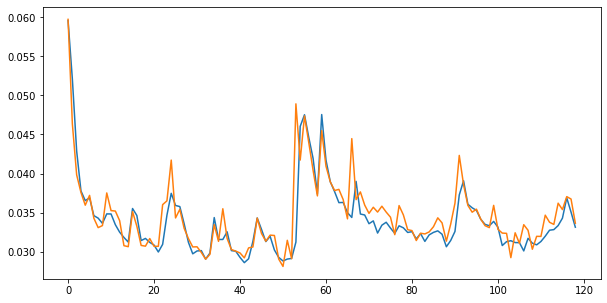

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.35it/s  0.0287                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

117 of 128
TRAIN LOSS: 0.032196399910996355
VAL LOSS: 0.03388368400434653
VAL_ACC50: 0.6023873689306869
VAL_ACC40: 0.688508866930716


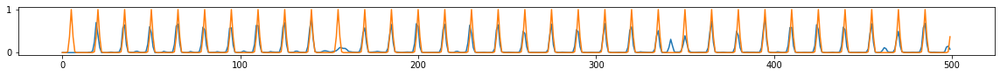

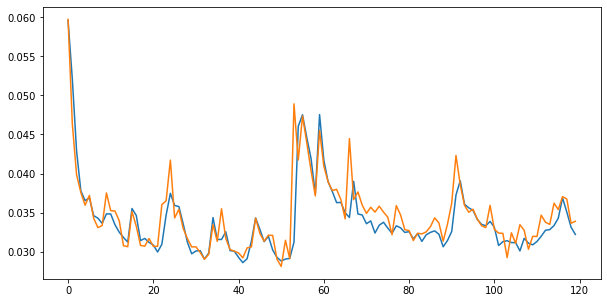

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.49it/s  0.0243                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

118 of 128
TRAIN LOSS: 0.03155624297344022
VAL LOSS: 0.030157174501154158
VAL_ACC50: 0.6756564243422722
VAL_ACC40: 0.7441379663731291


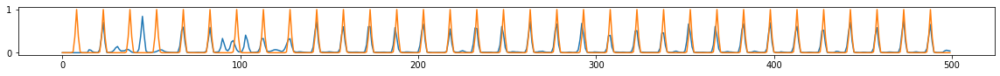

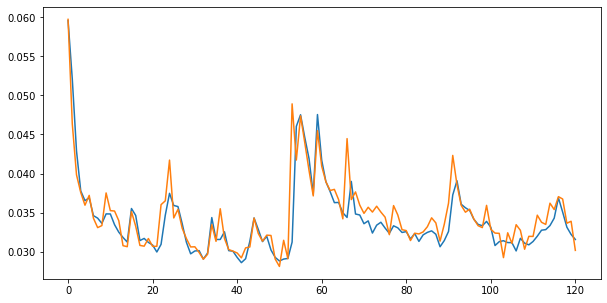

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0263                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

119 of 128
TRAIN LOSS: 0.03056279124899043
VAL LOSS: 0.033272564618123904
VAL_ACC50: 0.633483369996832
VAL_ACC40: 0.7031467847793494


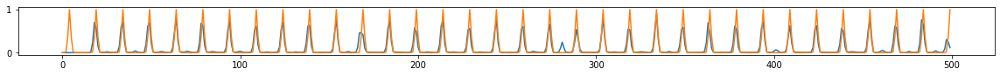

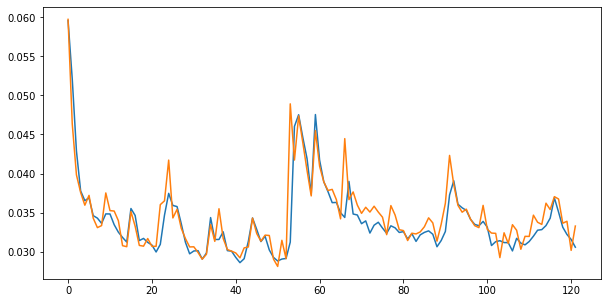

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.50it/s  0.0257                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

120 of 128
TRAIN LOSS: 0.030684781209048297
VAL LOSS: 0.03237476551698314
VAL_ACC50: 0.6291598103574692
VAL_ACC40: 0.7052837716604325


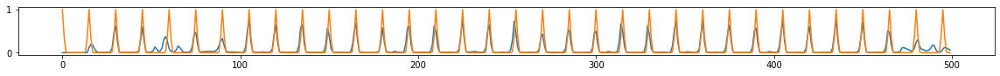

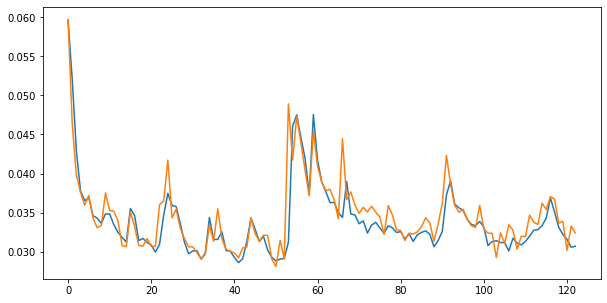

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.31it/s  0.0315                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

121 of 128
TRAIN LOSS: 0.030940126368982926
VAL LOSS: 0.031262370033396616
VAL_ACC50: 0.6795006400328369
VAL_ACC40: 0.7451038765807497


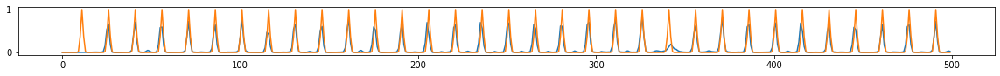

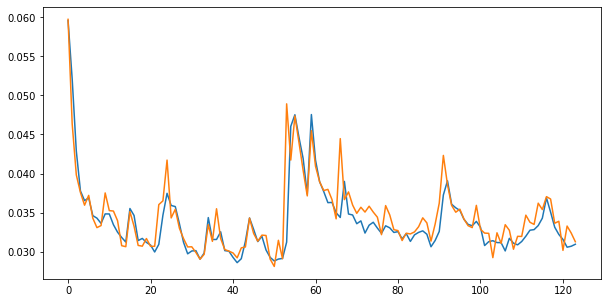

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.37it/s  0.0340                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

122 of 128
TRAIN LOSS: 0.03016357160069876
VAL LOSS: 0.03193239370981852
VAL_ACC50: 0.6521817394782548
VAL_ACC40: 0.7209587261148485


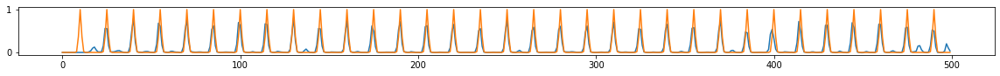

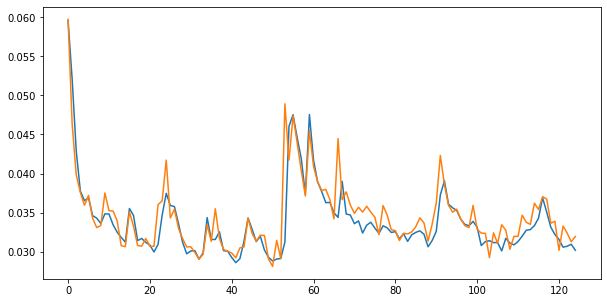

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.39it/s  0.0296                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

123 of 128
TRAIN LOSS: 0.030561660054243274
VAL LOSS: 0.03133313771751192
VAL_ACC50: 0.6698829597696654
VAL_ACC40: 0.735090942788258


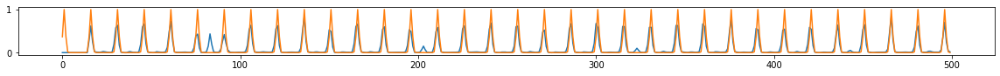

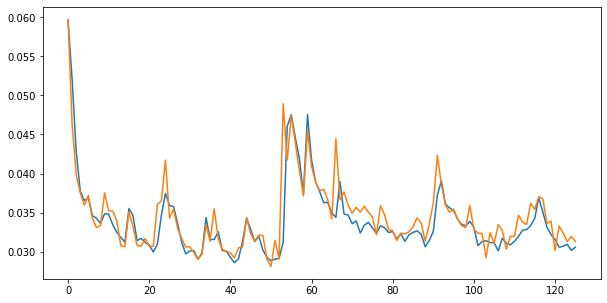

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.48it/s  0.0268                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

124 of 128
TRAIN LOSS: 0.029769710834241576
VAL LOSS: 0.03385849069390032
VAL_ACC50: 0.6120919378557541
VAL_ACC40: 0.7025052264610943


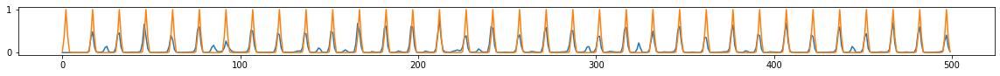

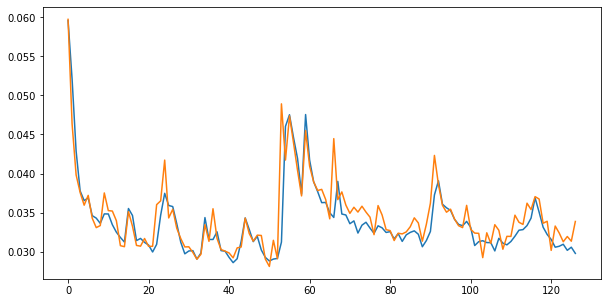

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.40it/s  0.0383                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

125 of 128
TRAIN LOSS: 0.033184963485433
VAL LOSS: 0.032385192811489105
VAL_ACC50: 0.6218562344606333
VAL_ACC40: 0.7098536494368598


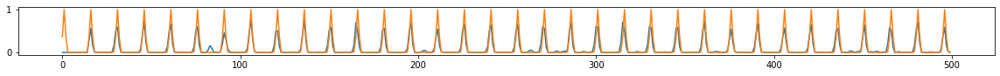

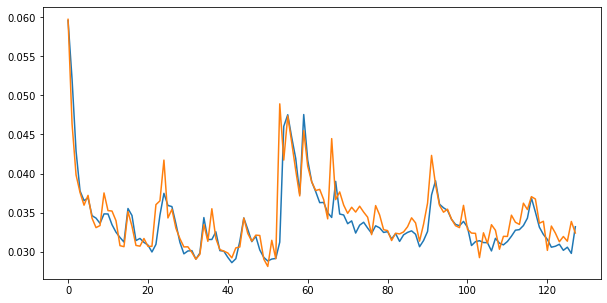

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.34it/s  0.0307                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

126 of 128
TRAIN LOSS: 0.03178202350520425
VAL LOSS: 0.03157157657874955
VAL_ACC50: 0.6415489881946965
VAL_ACC40: 0.7231421800064189


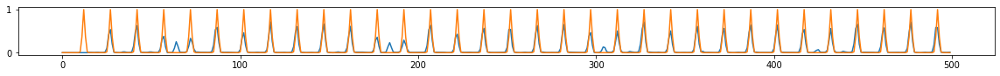

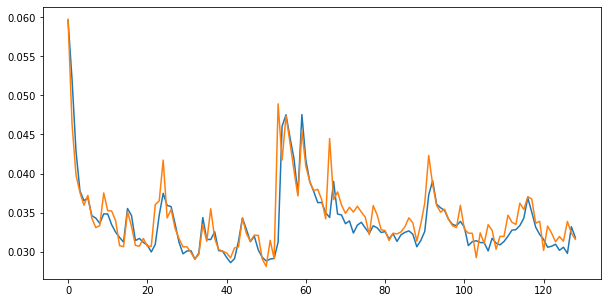

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:04<00:00:00  7.42it/s  0.0239                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

127 of 128
TRAIN LOSS: 0.031086664957304794
VAL LOSS: 0.03156111513574918
VAL_ACC50: 0.6810518155210482
VAL_ACC40: 0.7499510087919052


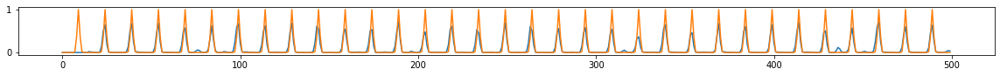

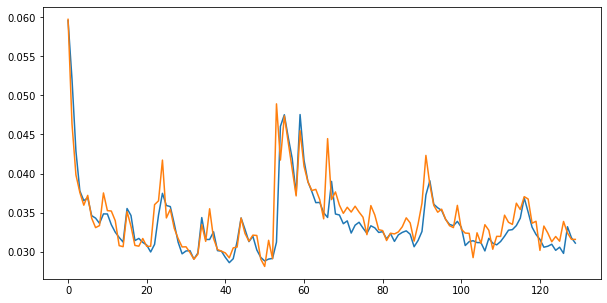

470.18505024909973 secs


In [110]:
start = time.time()

epochs = 64
trainBN()

end = time.time()
print(end - start, 'secs')

In [113]:
torch.save(bn.state_dict(), bn_model_path + str(epoch_cum) + '.pt')

# Training Hitnet

In [16]:
import torch
from torch.utils.data import DataLoader
from torchinfo import summary
from qqdm.notebook import qqdm
import matplotlib.pyplot as plt

In [17]:
batch_size = 32
init_trunc = 1

In [18]:
dim_in = (ds.seq_len, ds.a[0].shape[1])
dim_out = 1 #ds.y[0].shape[0]

In [19]:
device = torch.device('cuda')

In [28]:
bn.load_state_dict(torch.load(bn_model_path + str(128) + '.pt'))

<All keys matched successfully>

In [29]:
epoch_cum = 0
val_hist = []
train_hist = []
hn = HN(dim_in=dim_in, device=device)
hn.to(device)

343


HN(
  (convA1): Conv2d(1, 1, kernel_size=(3, 5), stride=(1, 1), padding=(1, 1))
  (convA2): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lstmX1): LSTM(343, 343, num_layers=2, batch_first=True)
  (linearX1): Linear(in_features=343, out_features=64, bias=True)
  (linear1): Linear(in_features=64, out_features=1, bias=True)
)

In [30]:
hn.init_hidden(1)
summary(hn, input_data=[ds.a[0].unsqueeze(0).to(device), ds.b[0].unsqueeze(0).to(device), ds.o[0].unsqueeze(0).to(device)], col_width=16,
        col_names=["input_size",
                "output_size",
                "num_params",
                "kernel_size",
                "mult_adds",])

Layer (type:depth-idx)                   Input Shape      Output Shape     Param #          Kernel Shape     Mult-Adds
HN                                       --               --               --               --               --
├─Conv2d: 1-1                            [1, 1, 14206, 280] [1, 1, 14206, 278] 16               [1, 1, 3, 5]     63,188,288
├─Conv2d: 1-2                            [1, 1, 14206, 278] [1, 1, 14206, 278] 10               [1, 1, 3, 3]     39,492,680
├─LSTM: 1-3                              [1, 14206, 343]  [1, 14206, 343]  1,887,872        --               26,819,109,632
├─Linear: 1-4                            [1, 14206, 343]  [1, 14206, 64]   22,016           [343, 64]        22,016
├─Linear: 1-5                            [1, 14206, 64]   [1, 14206, 1]    65               [64, 1]          65
Total params: 1,909,979
Trainable params: 1,909,979
Non-trainable params: 0
Total mult-adds (G): 26.92
Input size (MB): 19.60
Forward/backward pass size (MB): 109.56
Par

In [31]:
train_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)
val_ds = Beatmap_Dataset(None, None, seq_dur=seq_dur, sample_rate=sample_rate, 
                     hop_size=hop_size, peak_type=peak_type, width=width)

train_ds.take(ds, 0, int(len(ds) * 0.8))
val_ds.take(ds, int(len(ds) * 0.8), len(ds))

train_ldr = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ldr = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

In [32]:
criterion = nn.MSELoss()
#criterion = nn.L1Loss()
optimizer = torch.optim.Adam(hn.parameters(), lr=0.001)

In [33]:
def hit_percentage(pred, gt, thresh):
    c = 0
    n = 0
    for i in range(1, gt.shape[0]-2):
        n += 1 if gt[i] == 1.0 else 0
        if pred[i] >= thresh:
            if gt[i] == 1 and (gt[i-1] != 1 or gt[i+1] != 1):
                if pred[i] > pred[i-1] and pred[i] > pred[i+1]:
                    c += 1
            elif gt[i] == 1:
                c += 1
    if n == 0:
        return 1
    return c / n

In [34]:
def trainHN(threading=False, threads=4, acc_report=False):
    global epoch_cum
    global A, O, H, BP, P
    global l

    executor = concurrent.futures.ThreadPoolExecutor(threads)
    
    bn.eval()
    for epoch in range(epochs):
        hn.train()
        train_loss = 0
        info = qqdm(train_ldr)
        for a, o, b, h, t, m, in info:
            hn.init_hidden(a.shape[0])
            bn.init_hidden(a.shape[0])
            A, O, H = a.to(device), o.to(device), h.to(device)
            with torch.no_grad():
                BP = bn(A.detach())
                BP = BP.squeeze(2)

            optimizer.zero_grad()
            HP = hn(A, BP, O)

            for i in range(HP.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                H[i][0:l] = torch.tensor([0] * l)
                HP[i][0:l] = torch.tensor([0] * l).unsqueeze(1)


            loss = criterion(HP[:,:,0:dim_out], H.unsqueeze(2))
            loss.backward()
            optimizer.step()
      
            train_loss += loss.item()
            info.set_infos({'loss': f'{loss.item():.4f}'})

        hn.eval()
        torch.no_grad()
        val_loss = 0
        val_acc05 = 0
        val_acc04 = 0
        for a, o, b, h, t, m, in val_ldr:
            hn.init_hidden(a.shape[0])
            bn.init_hidden(a.shape[0])
            A, O, H = a.to(device), o.to(device), h.to(device)
            BP = bn(A)
            BP = BP.squeeze(2)

            HP = hn(A, BP, O)

            for i in range(HP.shape[0]):
                l = int(t[1][i] * 0.001 * m[0][1][i] * init_trunc)
                H[i][0:l] = torch.tensor([0] * l)
                HP[i][0:l] = torch.tensor([0] * l).unsqueeze(1)

            loss = criterion(HP[:,:,0:dim_out], H.unsqueeze(2))

            if threading:
                mapfn = executor.map
            else:
                mapfn = map
            
            if acc_report:
                cum = mapfn(hit_percentage, HP.cpu().detach().numpy(), h, [0.5] * P.shape[0])
                val_acc05 = sum(cum)
                cum = mapfn(hit_percentage, HP.cpu().detach().numpy(), h, [0.4] * P.shape[0])
                val_acc04 = sum(cum)            
            
            val_loss += loss.item()

        train_loss = train_loss/len(train_ldr)    
        val_loss = val_loss/len(val_ldr)
        print(epoch+epoch_cum, 'of', epochs+epoch_cum)
        print("TRAIN LOSS:", train_loss)
        print("VAL LOSS:", val_loss)
        train_hist.append(float(train_loss))
        val_hist.append(float(val_loss))
        
        if acc_report:
            val_acc05 = val_acc05/len(val_ldr)/batch_size
            val_acc04 = val_acc04/len(val_ldr)/batch_size
            print("VAL_ACC05:", val_acc05)
            print("VAL_ACC04:", val_acc04)
        
        plt.rcParams["figure.figsize"] = (20,2)
        for i in range(dim_out):
            plt.plot(HP[0,:,i].cpu().detach().numpy())
            plt.plot(BP[i].cpu().detach().numpy())
            plt.plot(h[i])
            plt.show()
        
        plt.rcParams["figure.figsize"] = (10, 5)
        plt.plot(train_hist)
        plt.plot(val_hist)
        plt.show()
            
    epoch_cum += epochs

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.96it/s  0.1567                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

0 of 64
TRAIN LOSS: 0.1833353630370564
VAL LOSS: 0.153826880786154


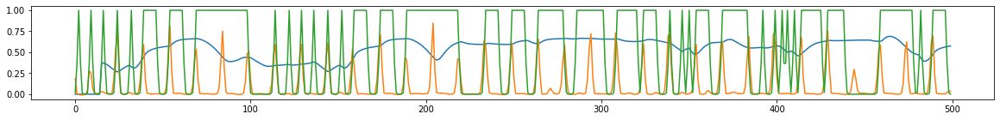

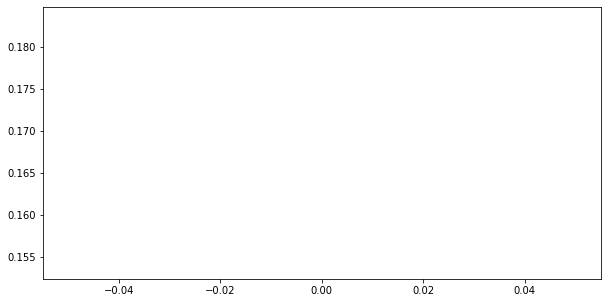

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.99it/s  0.1320                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

1 of 64
TRAIN LOSS: 0.14505361061957148
VAL LOSS: 0.13881518443425497


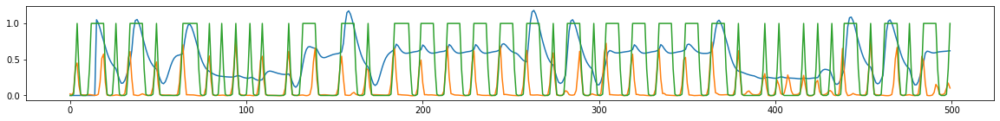

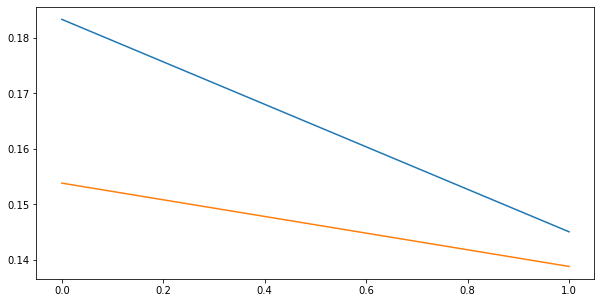

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.96it/s  0.1166                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

2 of 64
TRAIN LOSS: 0.12694980452458063
VAL LOSS: 0.12246629761324988


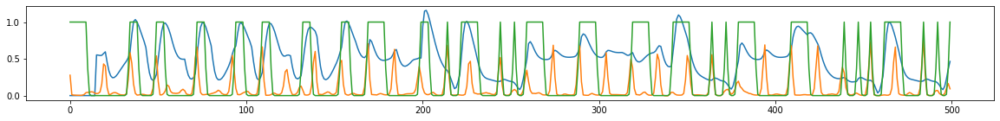

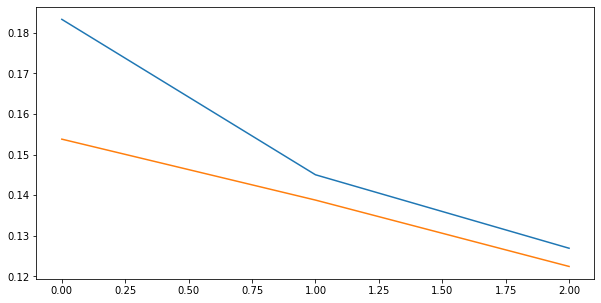

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.97it/s  0.1224                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

3 of 64
TRAIN LOSS: 0.11593586061563757
VAL LOSS: 0.11395372284783258


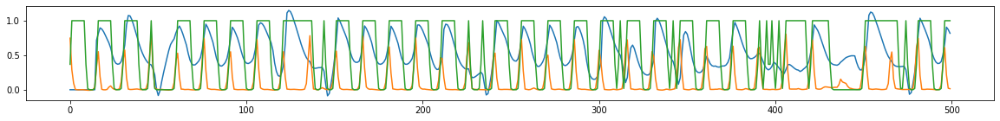

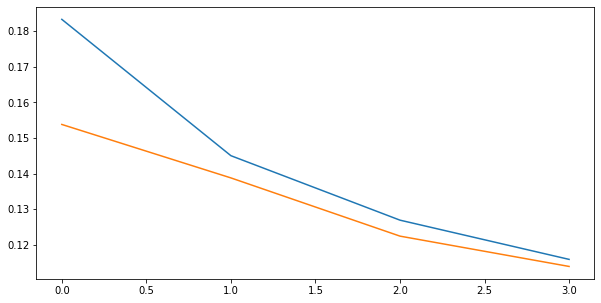

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.95it/s  0.1175                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

4 of 64
TRAIN LOSS: 0.10645552972952525
VAL LOSS: 0.10454768935839336


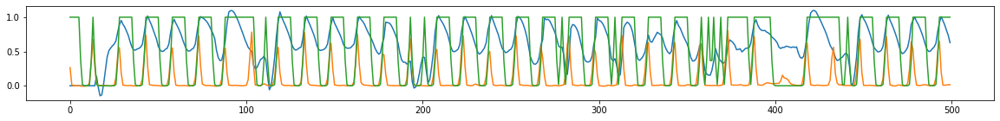

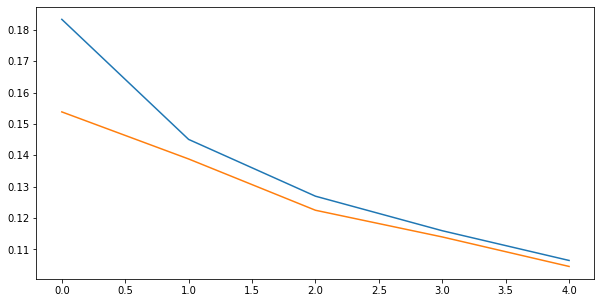

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.94it/s  0.1040                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

5 of 64
TRAIN LOSS: 0.09908540484805901
VAL LOSS: 0.10014527539412181


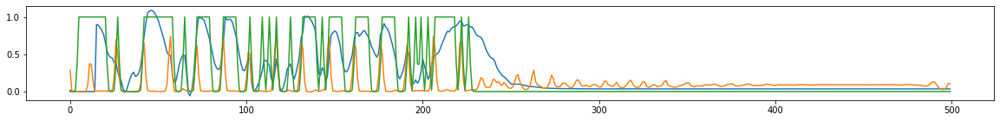

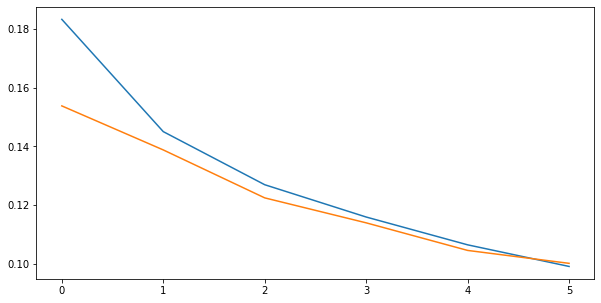

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.94it/s  0.1002                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

6 of 64
TRAIN LOSS: 0.09379056861831082
VAL LOSS: 0.09792221503125297


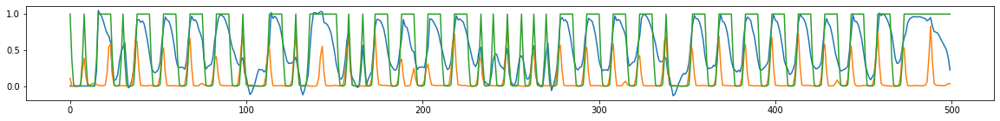

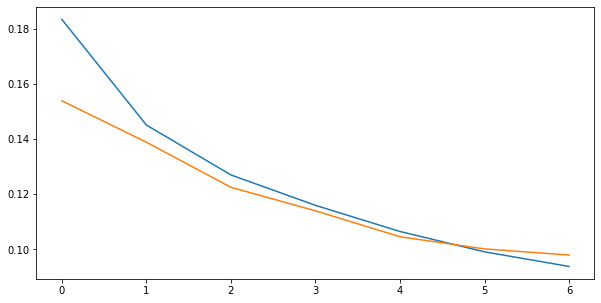

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.94it/s  0.0834                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

7 of 64
TRAIN LOSS: 0.09016894590523508
VAL LOSS: 0.09229200581709544


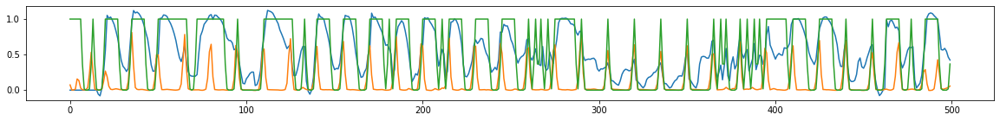

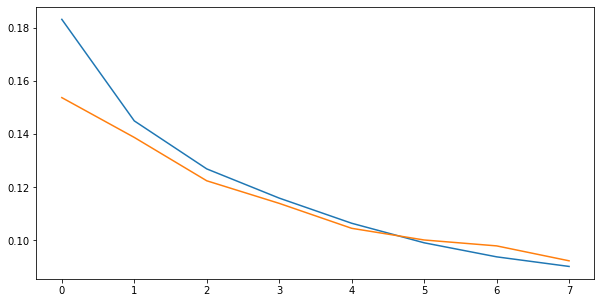

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.93it/s  0.0882                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

8 of 64
TRAIN LOSS: 0.08300482295453548
VAL LOSS: 0.08799117969142066


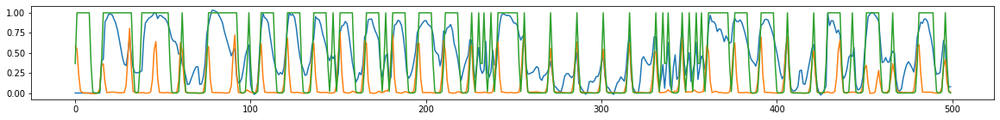

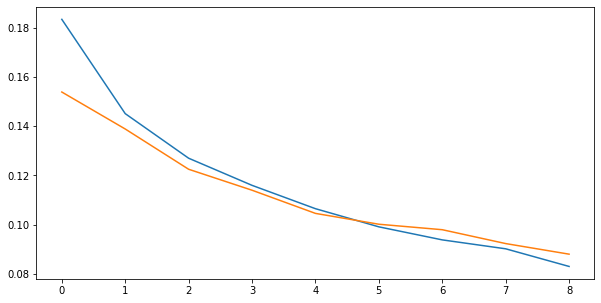

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.93it/s  0.0792                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

9 of 64
TRAIN LOSS: 0.08491017317606343
VAL LOSS: 0.08761284334792031


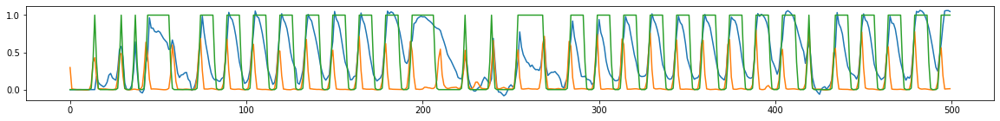

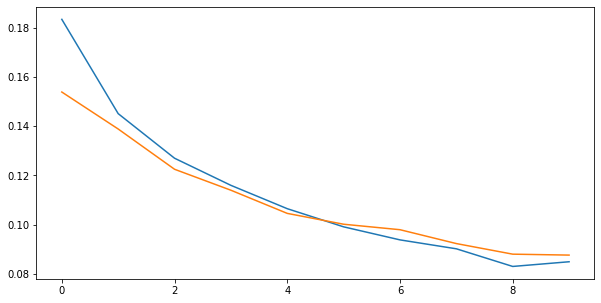

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.94it/s  0.0878                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

10 of 64
TRAIN LOSS: 0.08291119357777967
VAL LOSS: 0.08330818348460728


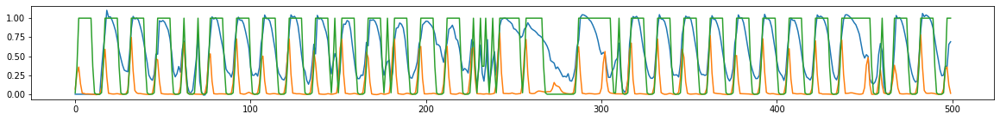

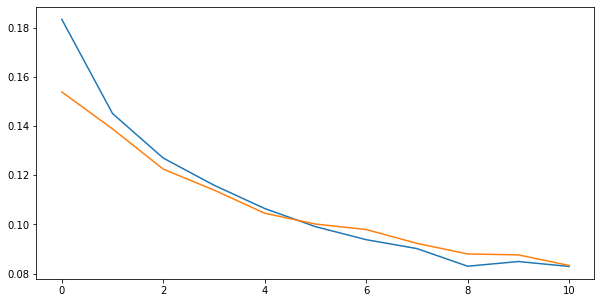

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.93it/s  0.0689                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

11 of 64
TRAIN LOSS: 0.07919817459252146
VAL LOSS: 0.08157451699177425


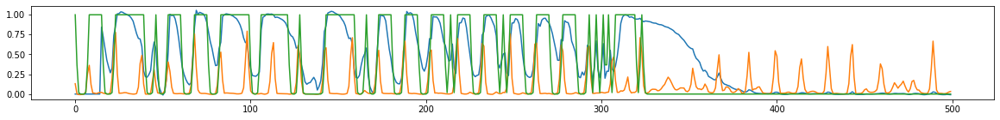

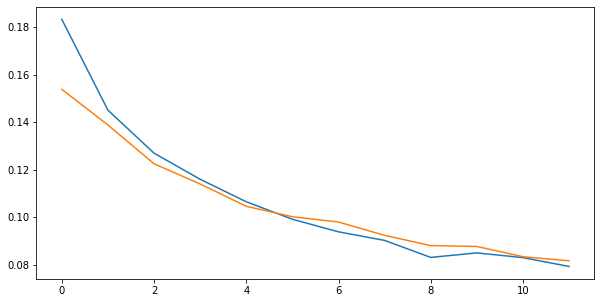

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.93it/s  0.0748                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

12 of 64
TRAIN LOSS: 0.07688739699208075
VAL LOSS: 0.08311908940474193


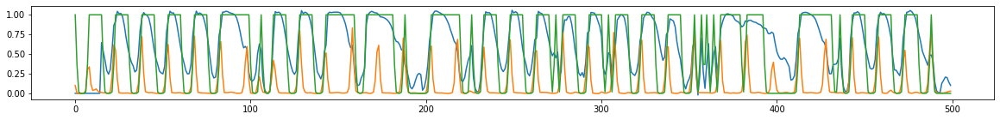

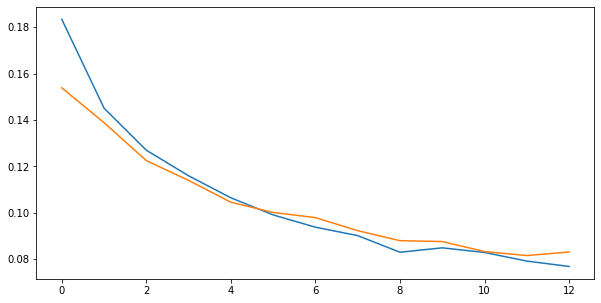

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0808                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

13 of 64
TRAIN LOSS: 0.07906371199836333
VAL LOSS: 0.08358379122283724


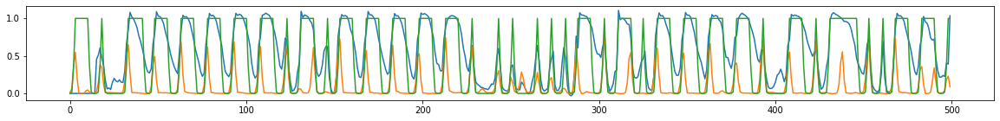

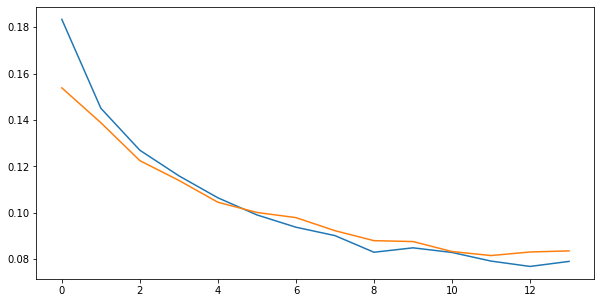

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0608                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

14 of 64
TRAIN LOSS: 0.07567811115748352
VAL LOSS: 0.07760877327786551


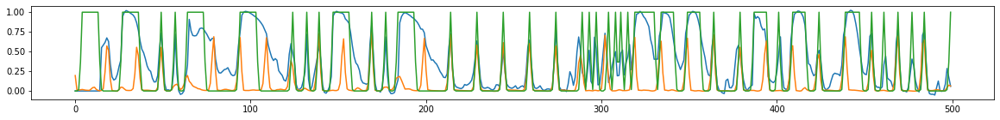

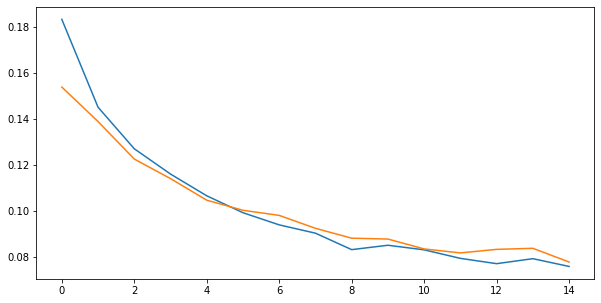

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0664                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

15 of 64
TRAIN LOSS: 0.07910098963313633
VAL LOSS: 0.07844848599698809


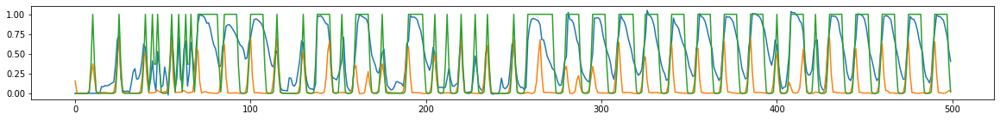

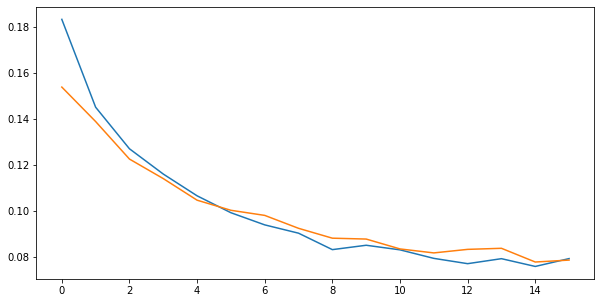

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0815                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

16 of 64
TRAIN LOSS: 0.07488981520550118
VAL LOSS: 0.0742870279484325


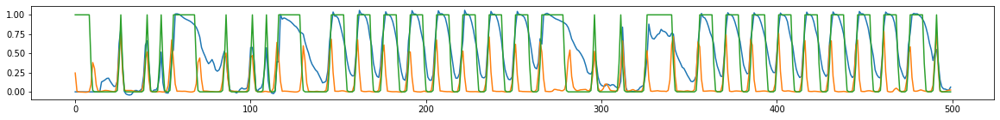

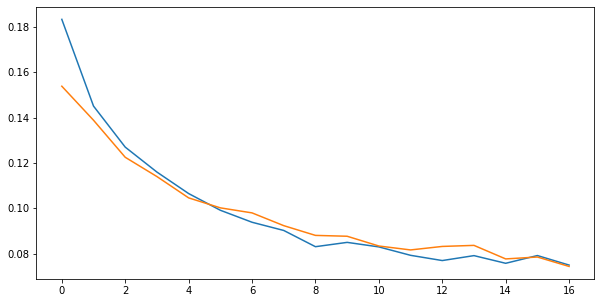

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0885                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

17 of 64
TRAIN LOSS: 0.07382533626837863
VAL LOSS: 0.0799056084619628


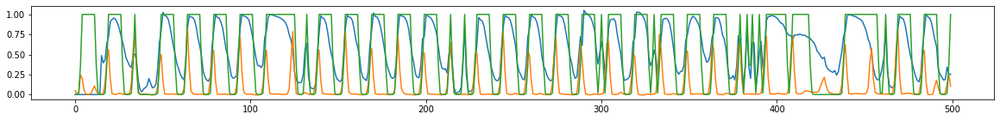

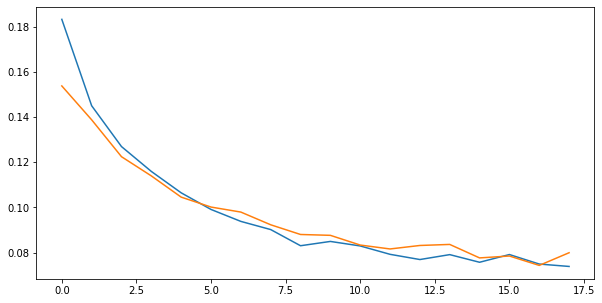

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0689                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

18 of 64
TRAIN LOSS: 0.07278981618583202
VAL LOSS: 0.07664790666765636


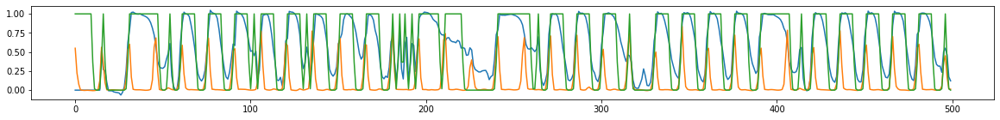

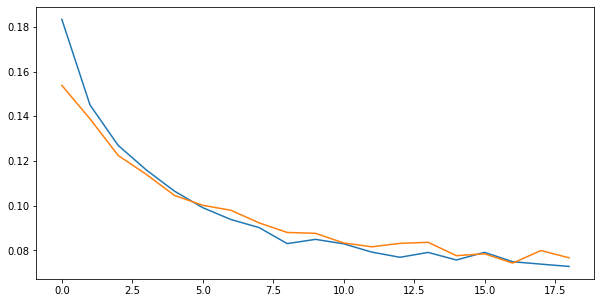

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0759                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

19 of 64
TRAIN LOSS: 0.07394721907460028
VAL LOSS: 0.07600028978453742


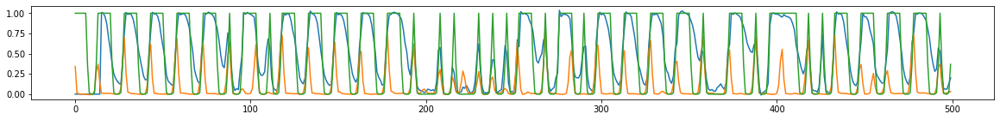

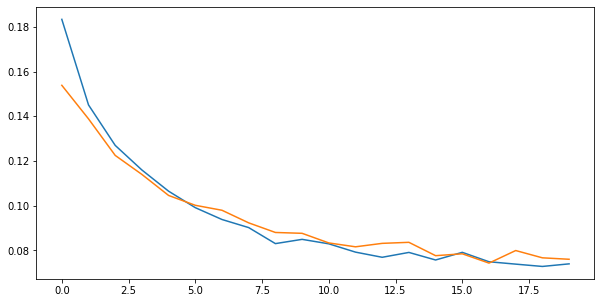

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0591                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

20 of 64
TRAIN LOSS: 0.07092929662515719
VAL LOSS: 0.07975807247890367


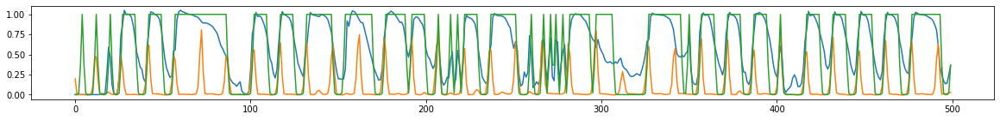

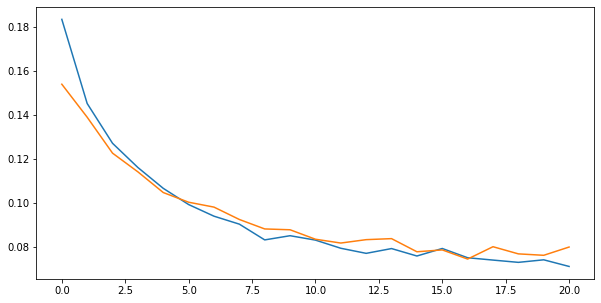

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0635                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

21 of 64
TRAIN LOSS: 0.07823377785583337
VAL LOSS: 0.0847637297378646


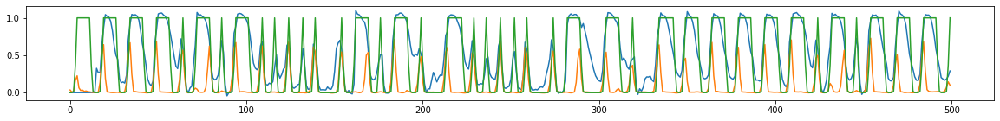

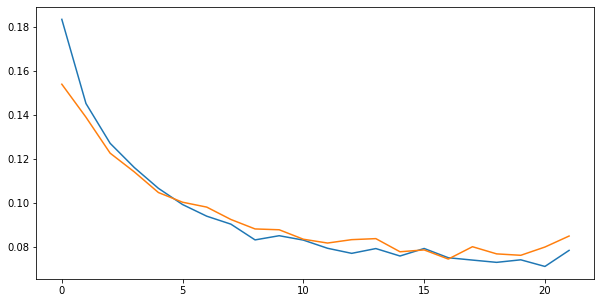

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0968                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

22 of 64
TRAIN LOSS: 0.0750493308943179
VAL LOSS: 0.07749420735571119


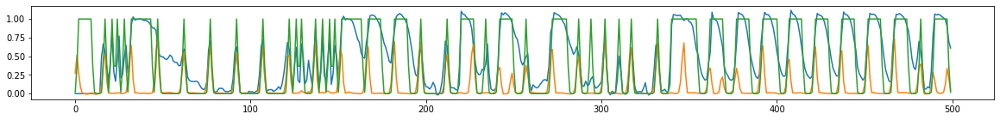

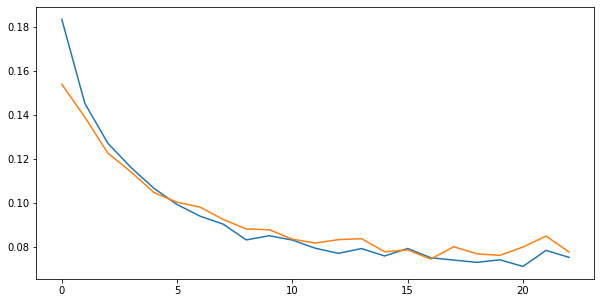

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0748                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

23 of 64
TRAIN LOSS: 0.07482063035584158
VAL LOSS: 0.07848392675320308


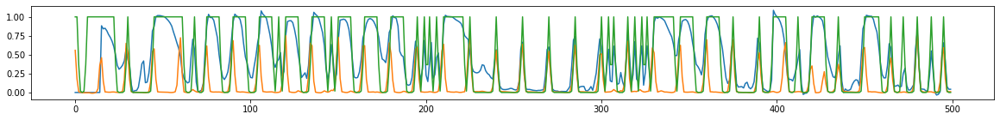

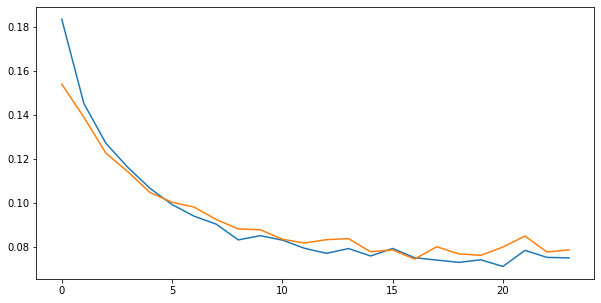

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0641                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

24 of 64
TRAIN LOSS: 0.0724321183645063
VAL LOSS: 0.0736852346195115


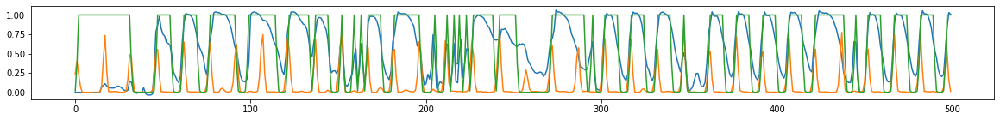

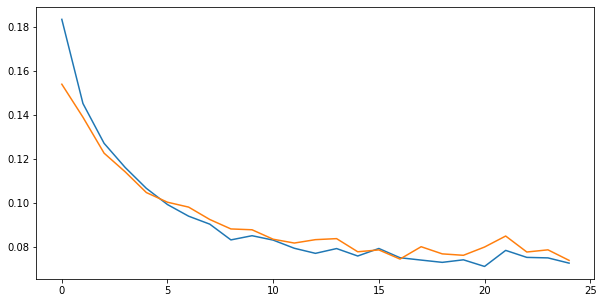

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0673                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

25 of 64
TRAIN LOSS: 0.0698733420835601
VAL LOSS: 0.07456131941742367


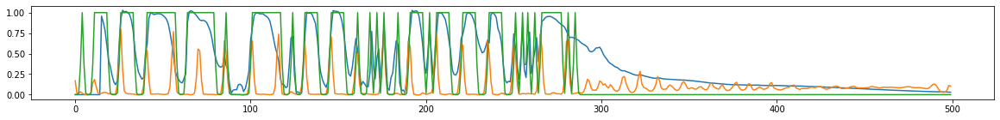

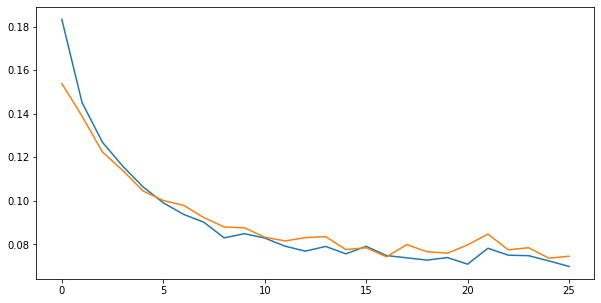

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0598                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

26 of 64
TRAIN LOSS: 0.07116525299433205
VAL LOSS: 0.07525322586297989


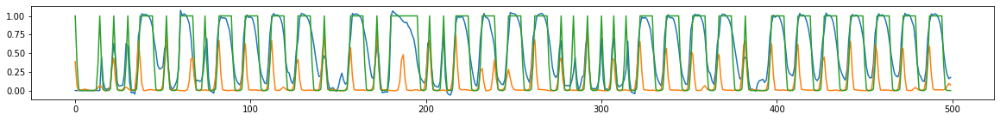

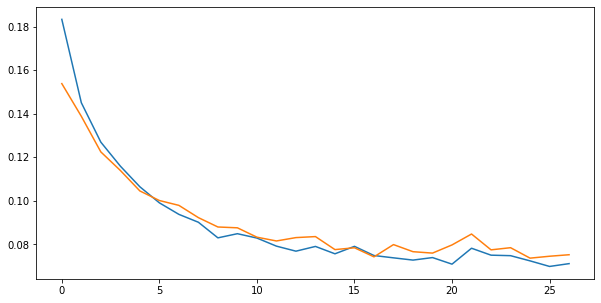

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0595                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

27 of 64
TRAIN LOSS: 0.06917665536618894
VAL LOSS: 0.06835207177533044


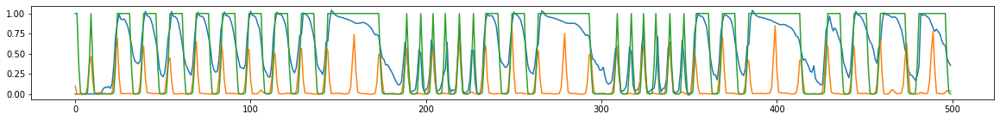

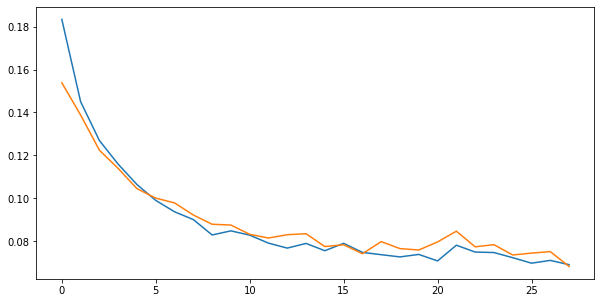

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0652                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

28 of 64
TRAIN LOSS: 0.06809372723930412
VAL LOSS: 0.07383355415529674


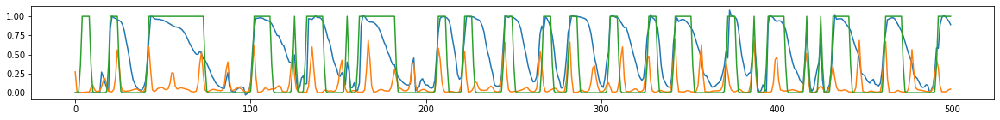

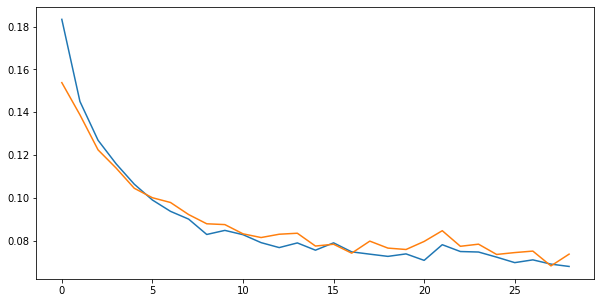

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0558                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

29 of 64
TRAIN LOSS: 0.0684678125091725
VAL LOSS: 0.07149190331498782


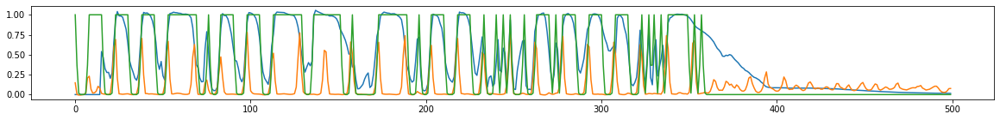

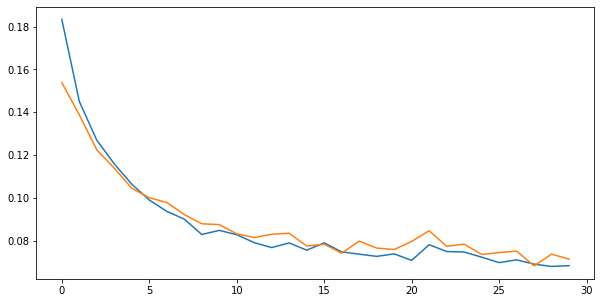

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0638                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

30 of 64
TRAIN LOSS: 0.06517506401158041
VAL LOSS: 0.07072460775574048


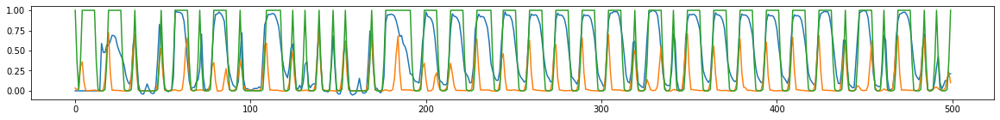

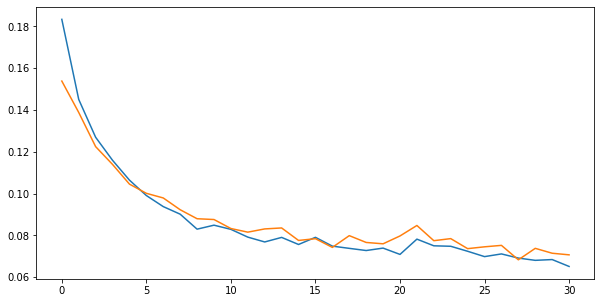

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0713                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

31 of 64
TRAIN LOSS: 0.06701515263153447
VAL LOSS: 0.07573750283983019


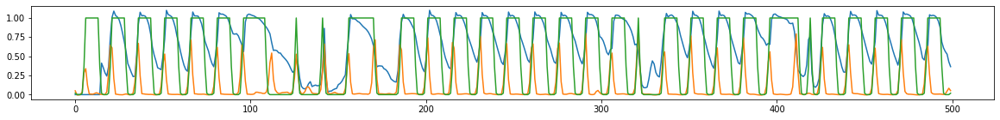

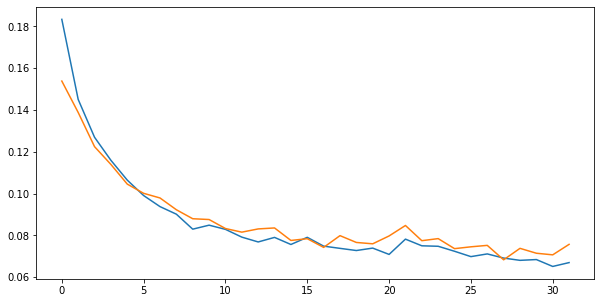

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0654                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

32 of 64
TRAIN LOSS: 0.06706817572315533
VAL LOSS: 0.07008152165346676


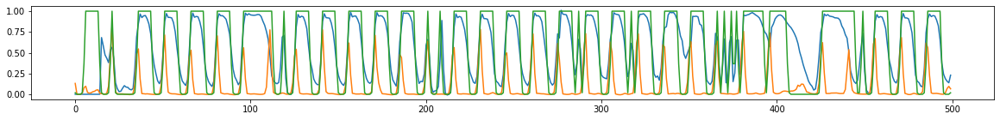

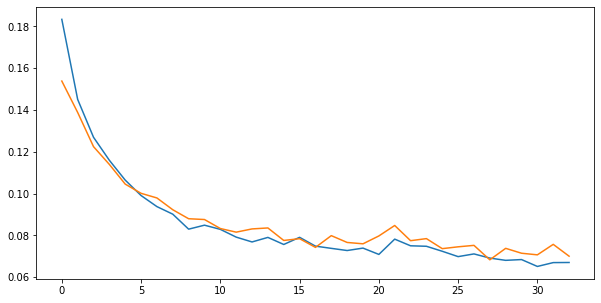

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0716                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

33 of 64
TRAIN LOSS: 0.06629104467315806
VAL LOSS: 0.07514629264672597


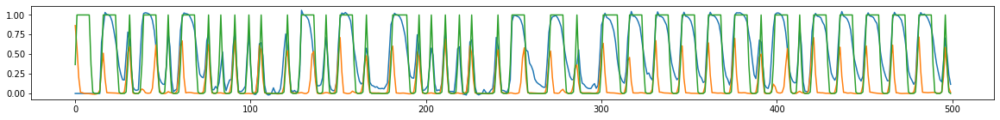

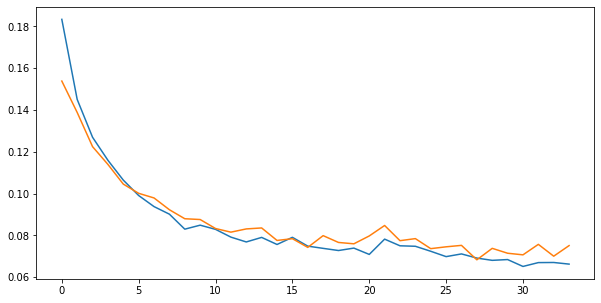

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0661                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

34 of 64
TRAIN LOSS: 0.0648125619110134
VAL LOSS: 0.0661543599433369


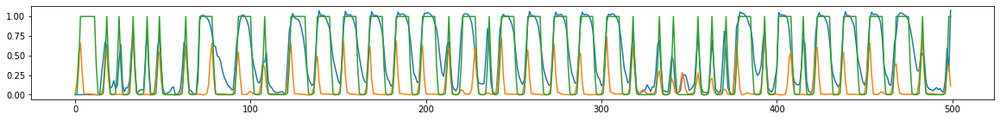

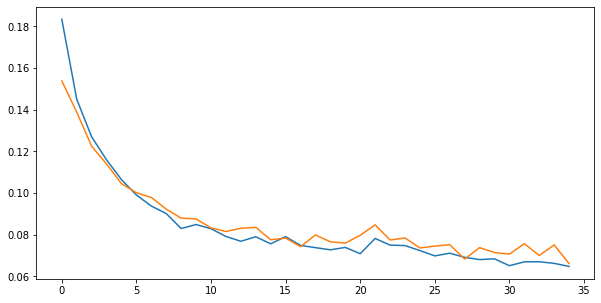

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0670                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

35 of 64
TRAIN LOSS: 0.0653301966894004
VAL LOSS: 0.07017623798714744


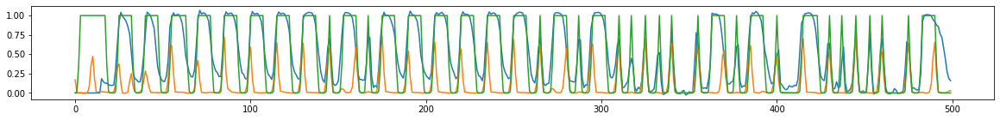

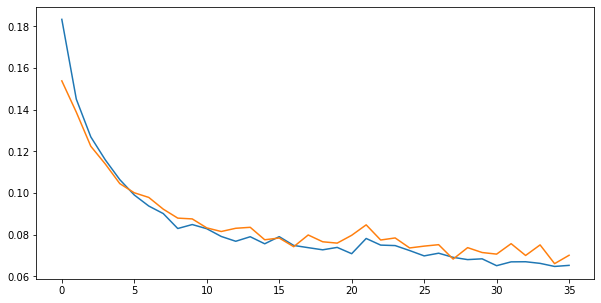

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0770                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

36 of 64
TRAIN LOSS: 0.06382828950881958
VAL LOSS: 0.06987818620271152


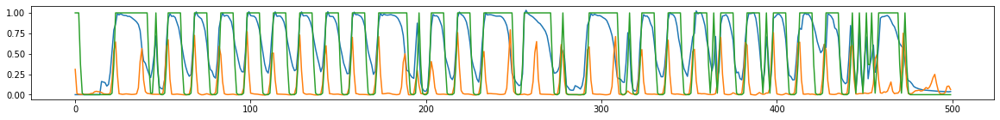

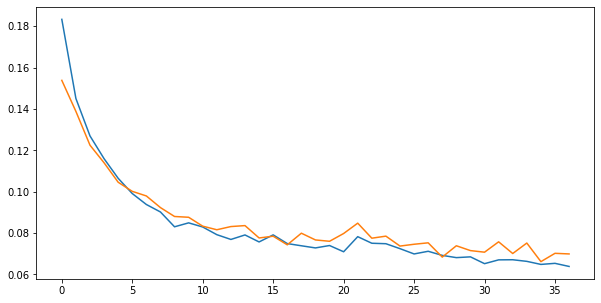

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0688                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

37 of 64
TRAIN LOSS: 0.06537374233206113
VAL LOSS: 0.06864114312662019


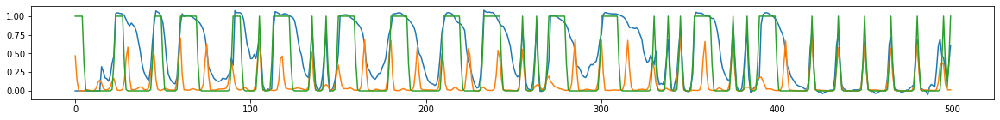

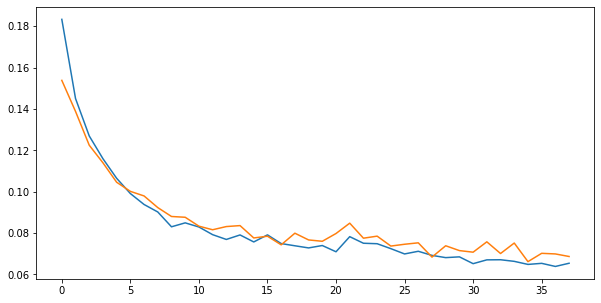

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0627                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

38 of 64
TRAIN LOSS: 0.06304328619605964
VAL LOSS: 0.07161897586451636


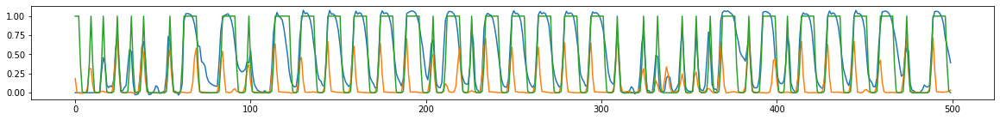

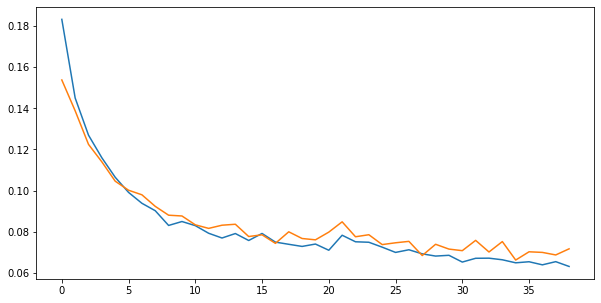

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0704                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

39 of 64
TRAIN LOSS: 0.06124485035737356
VAL LOSS: 0.06636673501796192


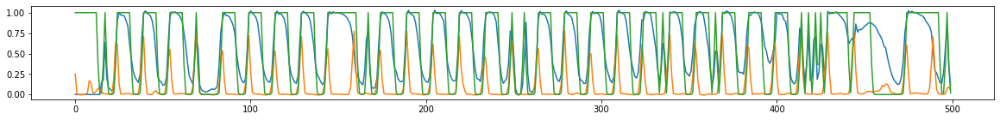

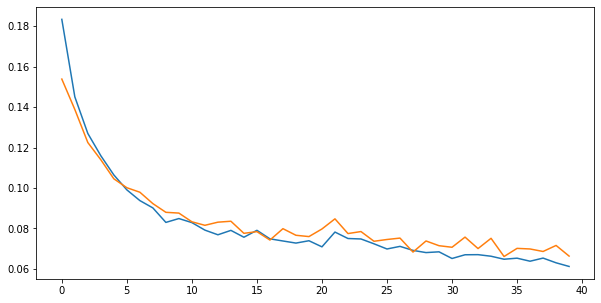

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0609                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

40 of 64
TRAIN LOSS: 0.06291484677543242
VAL LOSS: 0.06807326856586668


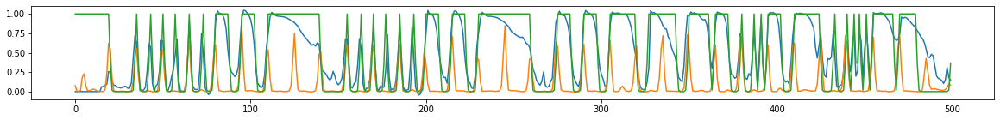

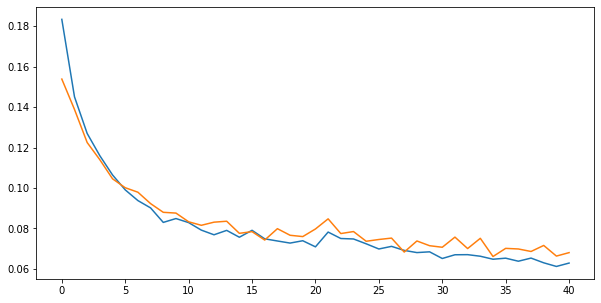

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0669                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

41 of 64
TRAIN LOSS: 0.06371595772604148
VAL LOSS: 0.06824455989731683


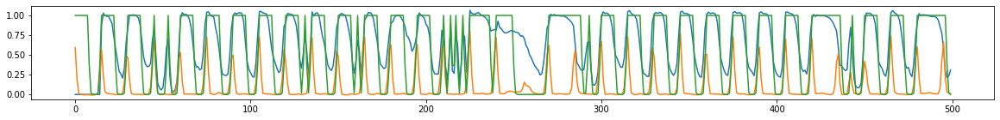

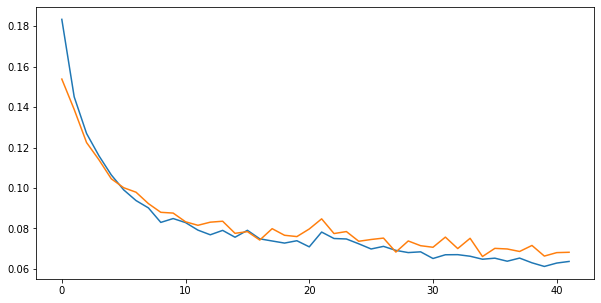

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0534                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

42 of 64
TRAIN LOSS: 0.06197442735234896
VAL LOSS: 0.06622003349992964


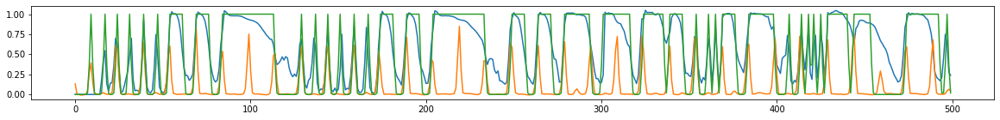

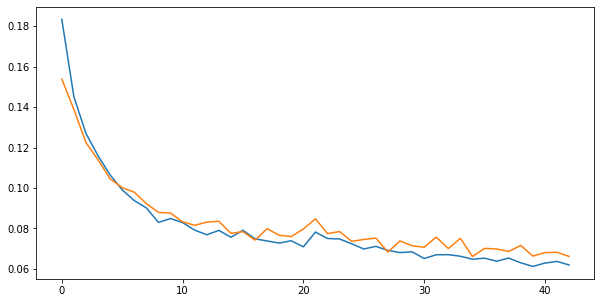

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0571                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

43 of 64
TRAIN LOSS: 0.062113279994163245
VAL LOSS: 0.06910601299670008


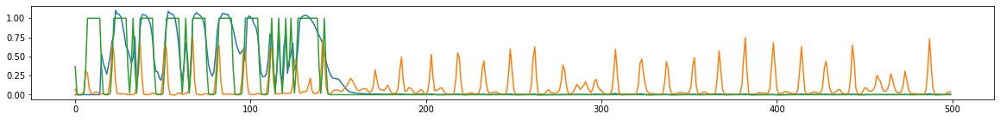

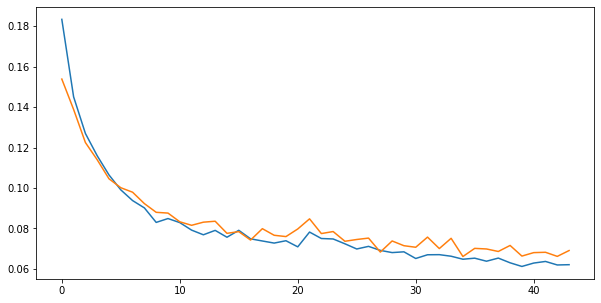

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0603                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

44 of 64
TRAIN LOSS: 0.06205059877700276
VAL LOSS: 0.06826337468292978


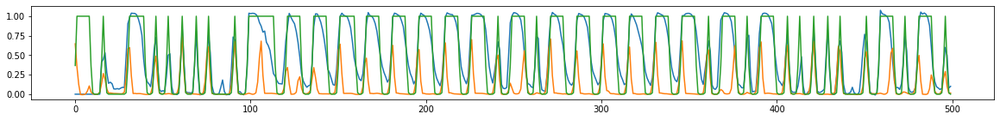

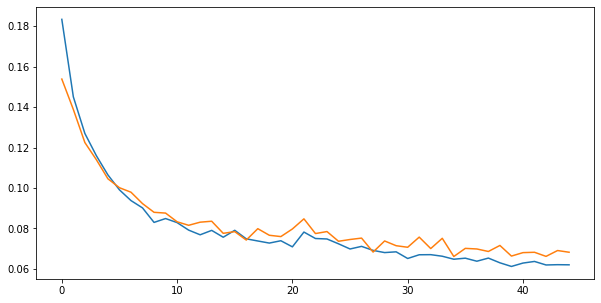

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0548                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

45 of 64
TRAIN LOSS: 0.06122995033446285
VAL LOSS: 0.06490578129887581


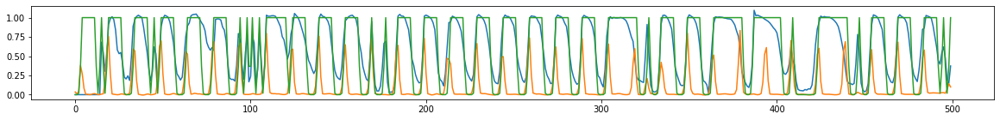

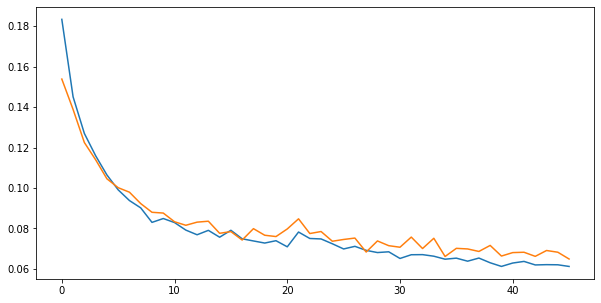

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0604                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

46 of 64
TRAIN LOSS: 0.060983526106509894
VAL LOSS: 0.06557778476013078


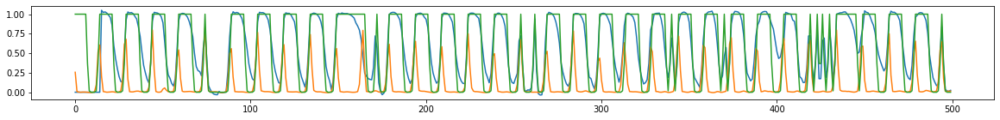

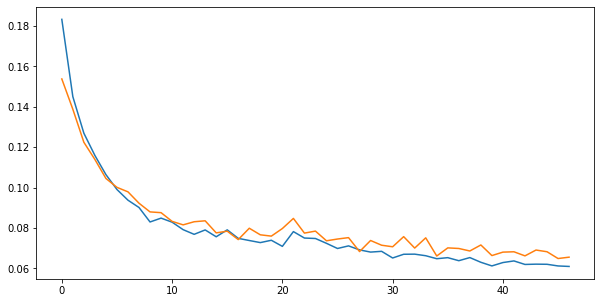

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0653                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

47 of 64
TRAIN LOSS: 0.06193317783375581
VAL LOSS: 0.06424528194798364


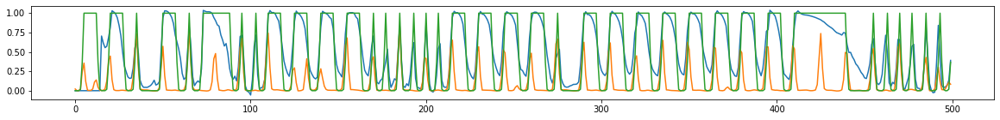

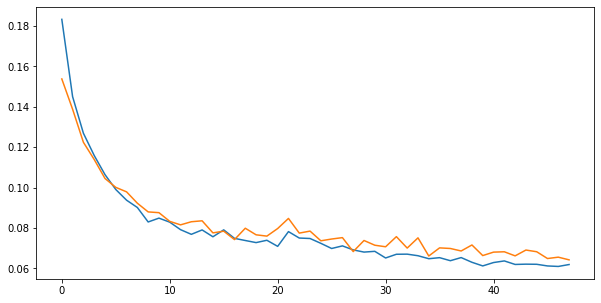

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0882                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

48 of 64
TRAIN LOSS: 0.06139314526485072
VAL LOSS: 0.06615391456418568


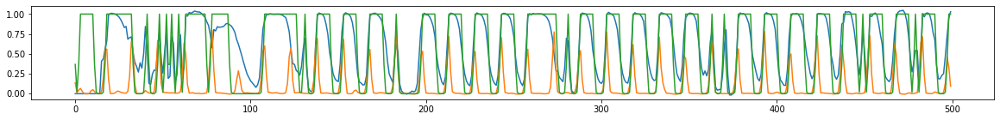

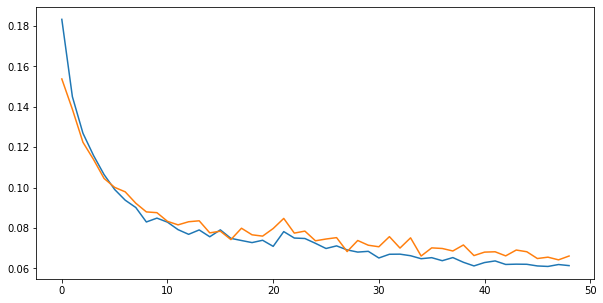

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0524                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

49 of 64
TRAIN LOSS: 0.05841994471848011
VAL LOSS: 0.0692888932923476


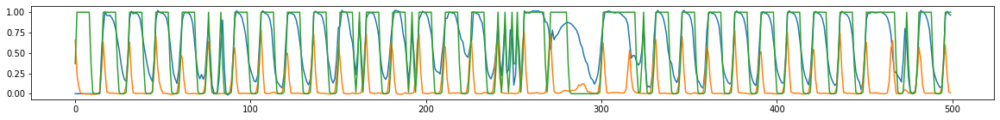

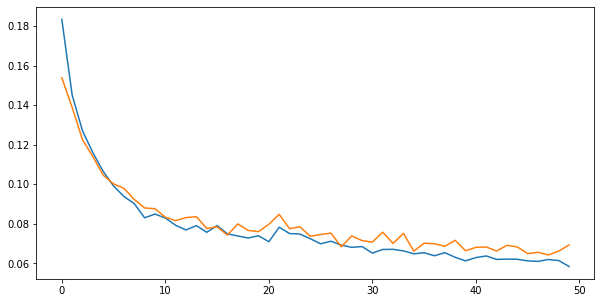

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0612                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

50 of 64
TRAIN LOSS: 0.061286884980897106
VAL LOSS: 0.06296866180168258


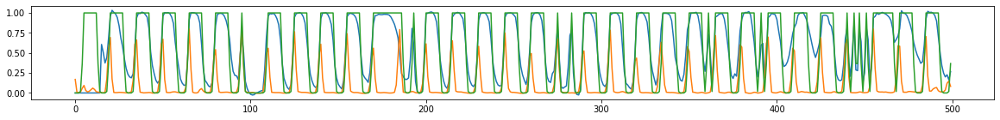

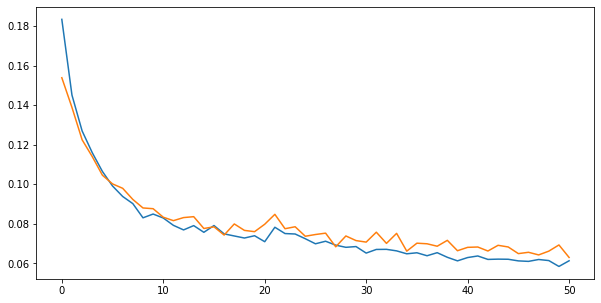

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.1000                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

51 of 64
TRAIN LOSS: 0.06106473019139634
VAL LOSS: 0.06801370986633831


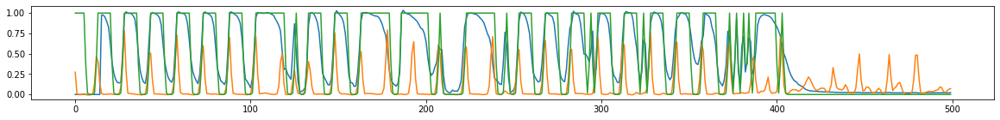

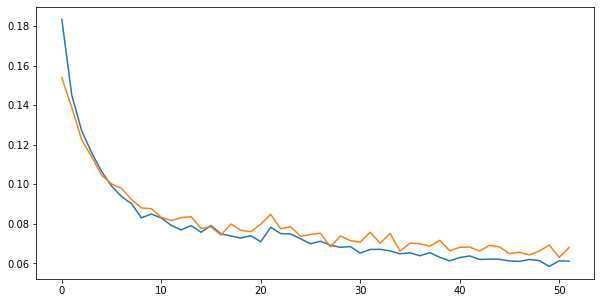

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0773                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

52 of 64
TRAIN LOSS: 0.060822764308088355
VAL LOSS: 0.06635138558016883


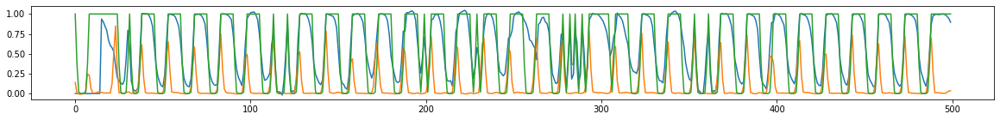

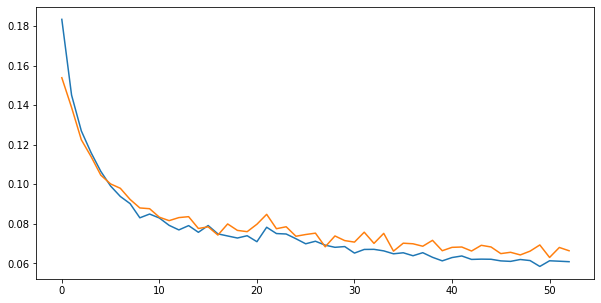

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0635                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

53 of 64
TRAIN LOSS: 0.058626051164335675
VAL LOSS: 0.06495854175753063


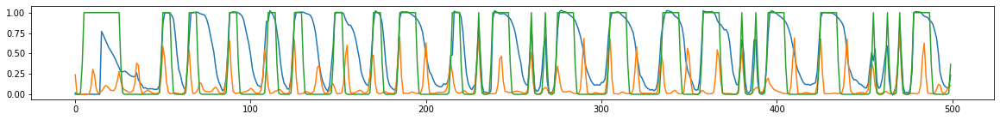

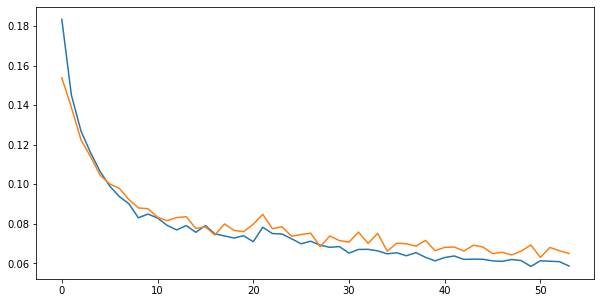

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0534                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

54 of 64
TRAIN LOSS: 0.05937676400774055
VAL LOSS: 0.06413310145338376


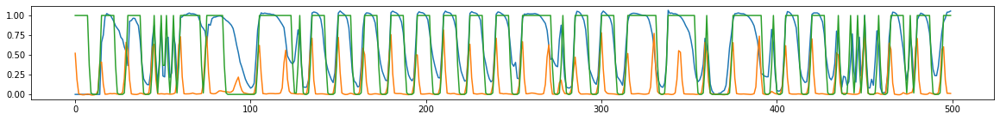

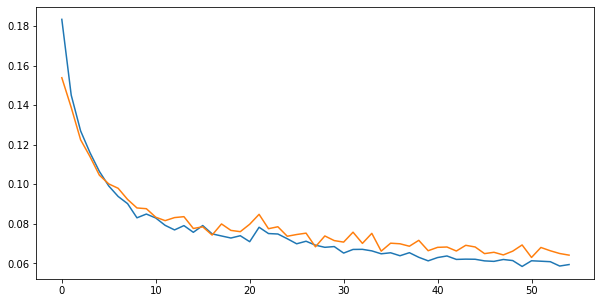

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0694                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

55 of 64
TRAIN LOSS: 0.05819077851871649
VAL LOSS: 0.06240409819616212


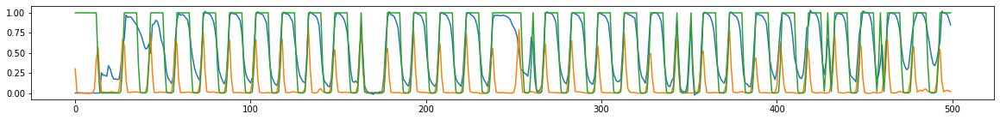

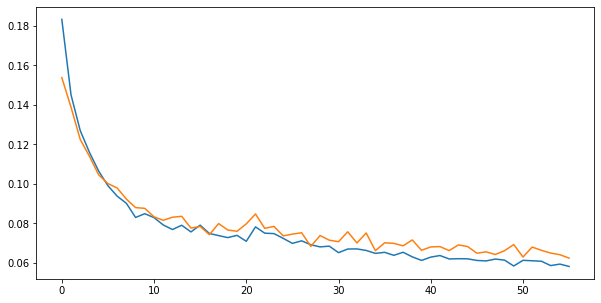

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0570                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

56 of 64
TRAIN LOSS: 0.05917691553218497
VAL LOSS: 0.06573274524675475


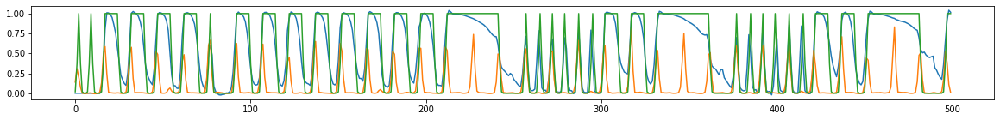

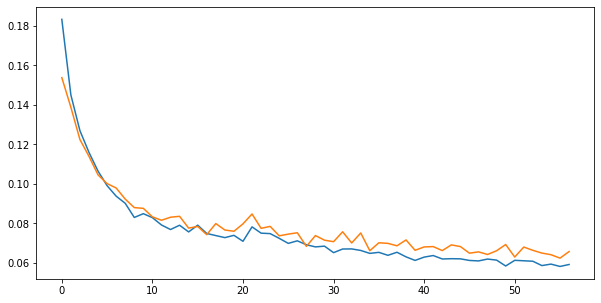

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0449                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

57 of 64
TRAIN LOSS: 0.05796584611137708
VAL LOSS: 0.06162058810393015


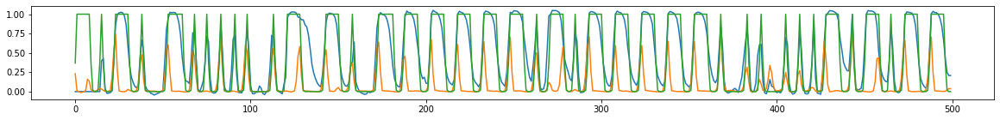

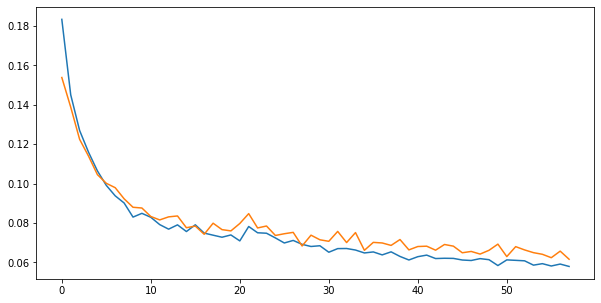

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0598                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

58 of 64
TRAIN LOSS: 0.05824026444719897
VAL LOSS: 0.06704311900668675


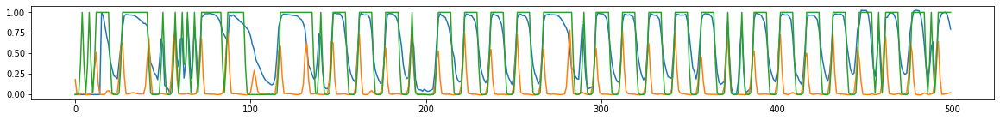

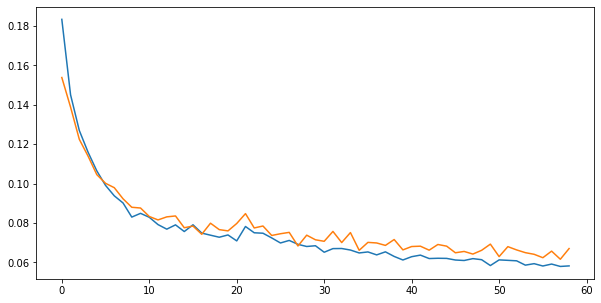

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0473                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

59 of 64
TRAIN LOSS: 0.05767959149347411
VAL LOSS: 0.0687235871122943


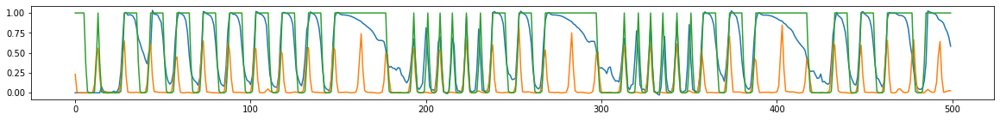

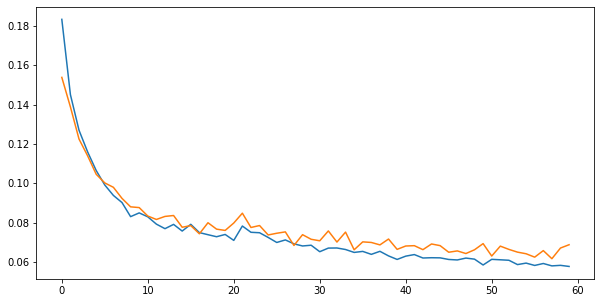

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.92it/s  0.0749                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

60 of 64
TRAIN LOSS: 0.059250934773849115
VAL LOSS: 0.0702849994930956


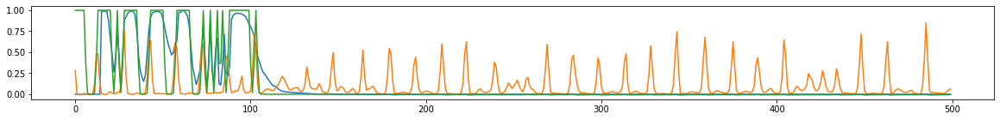

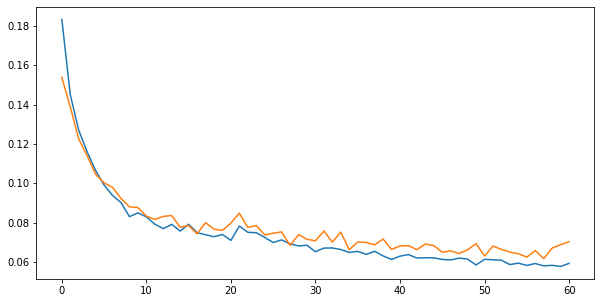

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.90it/s  0.0531                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

61 of 64
TRAIN LOSS: 0.05750014384587606
VAL LOSS: 0.06574973132875231


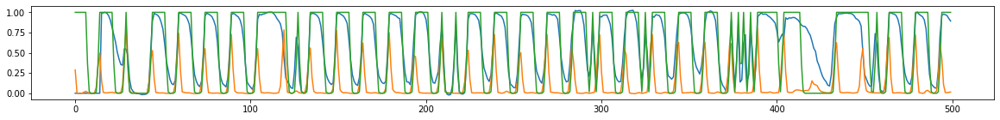

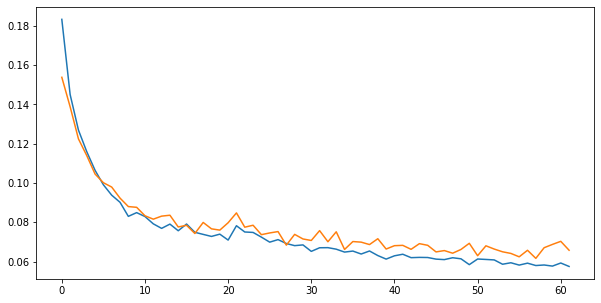

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0612                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

62 of 64
TRAIN LOSS: 0.05671133380383253
VAL LOSS: 0.06454375841551357


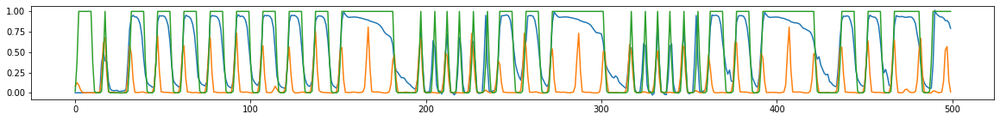

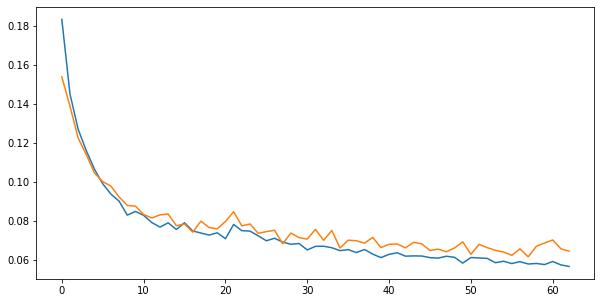

 Iters    Elapsed Time      Speed     loss                                      
 36/36  00:00:07<00:00:00  4.91it/s  0.0596                                     

IpythonBar(children=(HTML(value='  0.0%'), FloatProgress(value=0.0)))

63 of 64
TRAIN LOSS: 0.057330409064888954
VAL LOSS: 0.06519500994020039


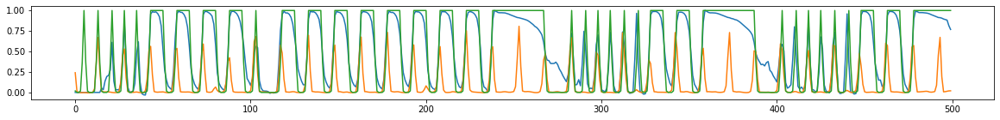

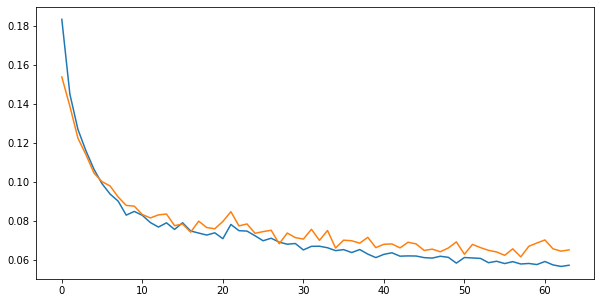

510.88379168510437 secs


In [35]:
start = time.time()

epochs = 64
trainHN()

end = time.time()
print(end - start, 'secs')

In [37]:
torch.save(hn.state_dict(), hn_model_path + str(epoch_cum) + '.pt')

In [ ]:
train_hist = train_hist[10:]
val_hist = val_hist[10:]

In [ ]:
start = time.time()

epochs = 64
train()

end = time.time()
print(end - start, 'secs')

In [234]:
torch.save(model.state_dict(), hn_model_path + str(epoch_cum) + '.pt')

# Test model

In [38]:
import torch

In [39]:
hn.load_state_dict(torch.load(hn_model_path + str(64) + '.pt'))
bn.load_state_dict(torch.load(bn_model_path + str(128) + '.pt'))

<All keys matched successfully>

In [40]:
#osud = '../ex/beatmaps/567301 LamazeP - Spam Jack'
#osuf = 'LamazeP - Spam Jack (OsuToothbrush) [SPAM].osu'
#osud = '../ex/beatmaps/252981 DJ Okawari - Flower Dance (Short Ver)'
#osuf = 'DJ Okawari - Flower Dance (Short Ver.) (-Hanayuki-) [Relax].osu'
osud = '../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku'
osuf = 'sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-\'s Hard].osu'

In [41]:
log_spect = LOG_SPECT(sample_rate=sample_rate, hop_size=hop_size, n_bands=[24], mode='offline')
osubeatmap = Beatmap(osud, osuf, log_spect, sample_rate=sample_rate, hop_size=hop_size, width=width, peak_type=peak_type, tmp='./wav/')

In [42]:
a, b, o, h = osubeatmap.get_audio(), osubeatmap.get_beats(), osubeatmap.get_hitobjects(), osubeatmap.get_hits()
A, B, O = a.to(device).unsqueeze(0), b.to(device).unsqueeze(0), o.to(device).unsqueeze(0)

In [43]:
hn.to(device)
bn.to(device)
hn.init_hidden(1)
bn.init_hidden(1)
bn.eval()
hn.eval()

HN(
  (convA1): Conv2d(1, 1, kernel_size=(3, 5), stride=(1, 1), padding=(1, 1))
  (convA2): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lstmX1): LSTM(343, 343, num_layers=2, batch_first=True)
  (linearX1): Linear(in_features=343, out_features=64, bias=True)
  (linear1): Linear(in_features=64, out_features=1, bias=True)
)

In [44]:
BP = bn(A)
HP = hn(A, BP.squeeze(2), O)

In [45]:
hp = HP.cpu().detach().numpy().squeeze(0)
bp = BP.cpu().detach().numpy().squeeze(0)
#acc = hit_precentage(p, h, 0.4)

#print(acc)

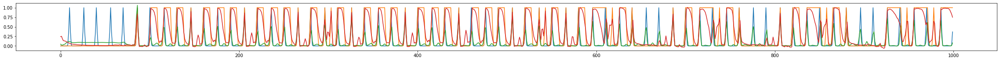

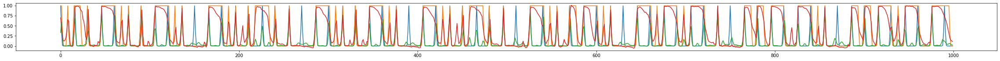

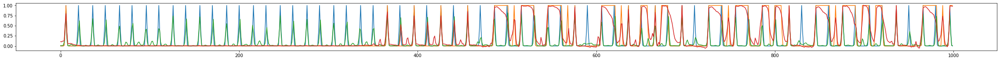

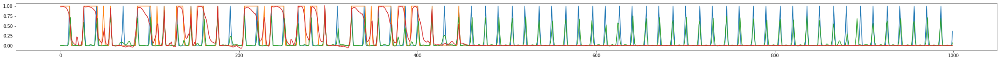

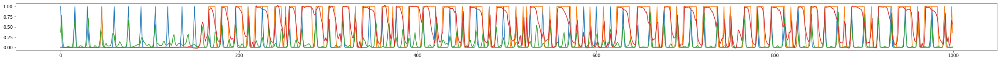

...

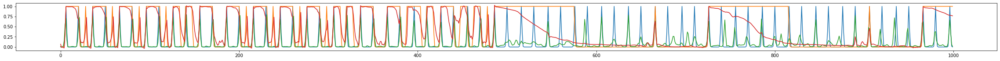

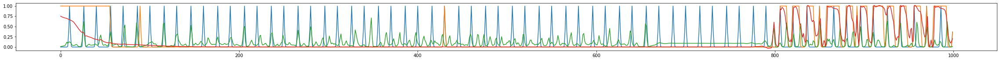

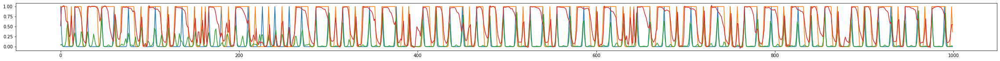

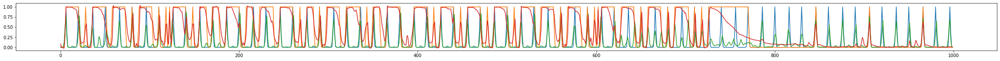

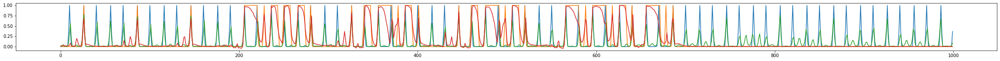

In [46]:
plt.rcParams["figure.figsize"] = (40,2)
for i in range(int(len(hp)/1000) - 1):
    plt.plot(b[1000*i:1000*(i+1)])
    plt.plot(h[1000*i:1000*(i+1)])
    plt.plot(bp[1000*i:1000*(i+1)])
    plt.plot(hp[1000*i:1000*(i+1)])
    plt.show()

# Create Replay Video

In [47]:
from IPython.display import Video

In [51]:
np.save('predASU.npy', hp)

In [52]:
eosud = osud.replace('/', '\/')

In [53]:
!sed -i "s/Beatmap path.*/Beatmap path\": \"$eosud\/$osuf\",/" data.json
!sed -i "s/Output path.*/Output path\": \"videoASU.mp4\",/" data.json

In [54]:
!python create_replayHN.py predASU.npy 50 0.5

2022-04-05 10:10:56,827:INFO:osr2mp4.Osr2mp4:__init__:test
2022-04-05 10:10:56,827:TRACE:osr2mp4.Utils.Setup:setupglobals:CALL *({'osu! path': '', 'Skin path': 'skin/', 'Beatmap path': "../ex/beatmaps/348381 sasakureUK - Spider Thread Monopoly feat Hatsune Miku/sasakure.UK - Spider Thread Monopoly feat. Hatsune Miku (Mishima Yurara) [Milan-'s Hard].osu", '.osr path': 'auto', 'Default skin path': 'skin/', 'Output path': 'videoASU.mp4', 'Width': 1024, 'Height': 600, 'FPS': 30, 'Start time': 0, 'End time': -1, 'Video codec': 'mjpeg', 'Process': 0, 'ffmpeg path': 'ffmpeg'}, {'Show score meter': True, 'Always show key overlay': True, 'Song volume': 100, 'Effect volume': 100, 'Enable PP counter': True, 'Enable Strain Graph': True, 'FFmpeg codec': 'libx264', 'FFmpeg custom commands': '', 'Audio bitrate': 320, 'api key': None, 'Use FFmpeg video writer': True, 'Custom mods': ''}, [], <osr2mp4.global_var.Settings object at 0x7fc0f60d0430>) **{'ppsettings': {'x': 1220, 'y': 690, 'text_x': 1140, '

In [56]:
Video("videoASU.mp4")